Least square fit for 6th order polynomial using scipy
--------------------------------------------------------------------------

In [1]:
import sys
import os

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path+"\\")

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from numpy import random
import dynesty
import seaborn as sns
from numpy import random
from numpy.random import MT19937
from numpy.random import RandomState, SeedSequence
from scipy.optimize import least_squares
from scipy.optimize import curve_fit
from scipy.optimize import minimize
from Bayesian_Dynesty_Restricted_LCDM_ga_20230915 import *
#from Bayesian_Dynesty_Restricted_LCDM_ga_20220512 import *
from genetic_algorithm230915 import *
#from genetic_algorithm220512 import *
#from genetic_algorithm220505 import *

read Hz data
------------------

In [2]:
try:
  train = np.loadtxt('/content/drive/MyDrive/연구 project/cosmology/H(z)_2203.10825.csv', delimiter=',', dtype='float', skiprows=1)
except Exception as e:
  print("Error = {0}".format(e))
  try:
    train = np.loadtxt('/content/drive/MyDrive/cosmology/H(z)_2203.10825.csv', delimiter=',', dtype='float', skiprows=1)
  except Exception as e:
    print("Error = {}".format(e))
    train = np.loadtxt('./H(z)_2203.10825.csv', delimiter=',', dtype='float', skiprows=1)
train_x = train[:,0]
train_y = train[:,1]
train_sigma=train[:,2]
M = len(train_x)
print("Data size = {0}".format(len(train_x)))

Error = /content/drive/MyDrive/연구 project/cosmology/H(z)_2203.10825.csv not found.
Error = /content/drive/MyDrive/cosmology/H(z)_2203.10825.csv not found.
Data size = 32


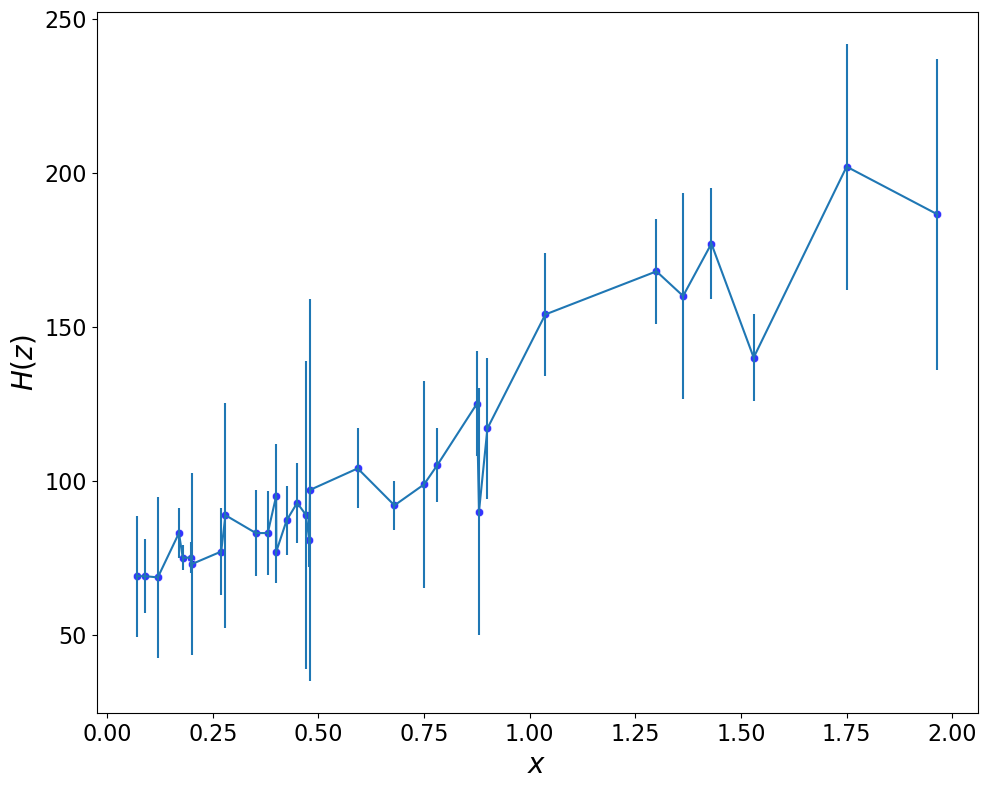

In [3]:
draw_data(train_x, train_y, train_sigma)

define optimize function
----------------------------------

In [3]:
x0 = np.array([100.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0])
fun([  55.99787729 , 182.70364549, -487.77741817,  498.40171095,   96.76843638, -301.99012188,   91.96869298], train_x, train_y, train_sigma)
fun_none([  55.99787729 , 182.70364549, -487.77741817,  498.40171095,   96.76843638, -301.99012188,   91.96869298], train_x, train_y, train_sigma)

4.985313404991062

In [33]:
print(fun_none([  55.99787729 , 182.70364549, -487.77741817,  498.40171095,   96.76843638, -301.99012188,   91.96869298], train_x, train_y, train_sigma))
print(fun_none([  57.48395091609652, 0.  ,       164.42483035, -422.26740958 , 589.92174406, -321.96551356,   60.2415114], train_x, train_y, train_sigma))
print(fun_none([  68.133, 32.70383999999999  ,       24.854918399999995, -1.0290808319999978 , -4.0395783168, 2.314406279577602,   0.35495153732812634], train_x, train_y, train_sigma))
print(fun_ridge([  68.97631647624674, 0.  ,       32.84339084 ,10.32466915, 20.01736306,  -1.01013294, -4.14747966], train_x, train_y, train_sigma))
print(fun_lasso([  70.15664535512322,  0.,         23.58703511, 28.35392261,  9.50689285, -0.88146741, -3.27265783], train_x, train_y, train_sigma))

4.985313404991062
57.06168231706453
8.6515240623459
38.344622322569705
33.51624925791854


In [4]:
res_lsq = least_squares(fun, x0, args=(train_x, train_y, train_sigma))
popt, pcov = curve_fit(fun_fit, train_x, train_y, x0, train_sigma)
res_none = minimize(fun_none, x0, method='L-BFGS-B', tol=1e-8, args=(train_x, train_y, train_sigma))
res_ridge = minimize(fun_ridge, x0, method='L-BFGS-B', tol=1e-8, args=(train_x, train_y, train_sigma))
res_lasso = minimize(fun_lasso, x0, method='L-BFGS-B', tol=1e-8, args=(train_x, train_y, train_sigma))

In [6]:
x0_L = np.array([1.0, 0.5])
popt_L, pcov_L = curve_fit(fun_fit_LCDM, train_x, train_y, x0_L, train_sigma)


C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:1403: RuntimeWarning: invalid value encountered in sqrt
  v = H0*np.sqrt((1-OL0)*(1+t)**3 + OL0)


In [9]:
print("res_lsq = {0}".format(res_lsq))

res_lsq =      message: `gtol` termination condition is satisfied.
     success: True
      status: 1
         fun: [-1.240e-01 -1.184e-02 ... -1.409e+00  3.281e-01]
           x: [ 5.600e+01  1.827e+02 -4.878e+02  4.985e+02  9.665e+01
               -3.019e+02  9.196e+01]
        cost: 4.985313404326659
         jac: [[ 5.102e-02  3.571e-03 ...  8.573e-08  5.813e-09]
               [ 8.333e-02  7.500e-03 ...  4.922e-07  4.408e-08]
               ...
               [ 2.500e-02  4.375e-02 ...  4.103e-01  7.181e-01]
               [ 1.984e-02  3.899e-02 ...  5.813e-01  1.142e+00]]
        grad: [ 4.575e-10  2.903e-09 -6.805e-10 -9.427e-11 -7.281e-09
               -8.053e-09 -8.158e-09]
  optimality: 8.158440256700317e-09
 active_mask: [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00  0.000e+00
                0.000e+00  0.000e+00]
        nfev: 12
        njev: 8


In [5]:
print("popt = {0}".format(popt))
print("pcov = {0}".format(pcov))
perr = np.sqrt(np.diag(pcov))
print("perr = {0}".format(perr))

popt = [  55.99787729  182.70364549 -487.77741817  498.40171095   96.76843638
 -301.99012188   91.96869298]
pcov = [[ 3.41103523e+02 -3.96807332e+03  1.57309161e+04 -2.83790612e+04
   2.53924751e+04 -1.09662711e+04  1.81991217e+03]
 [-3.96807332e+03  4.83019837e+04 -1.99097603e+05  3.70223319e+05
  -3.39107911e+05  1.49162944e+05 -2.51173621e+04]
 [ 1.57309161e+04 -1.99097603e+05  8.54096801e+05 -1.64070016e+06
   1.54178998e+06 -6.92025600e+05  1.18412856e+05]
 [-2.83790612e+04  3.70223319e+05 -1.64070016e+06  3.24119475e+06
  -3.11651519e+06  1.42503910e+06 -2.47509345e+05]
 [ 2.53924751e+04 -3.39107911e+05  1.54178998e+06 -3.11651519e+06
   3.05575425e+06 -1.42002150e+06  2.49910090e+05]
 [-1.09662711e+04  1.49162944e+05 -6.92025600e+05  1.42503910e+06
  -1.42002150e+06  6.68885192e+05 -1.19034131e+05]
 [ 1.81991217e+03 -2.51173621e+04  1.18412856e+05 -2.47509345e+05
   2.49910090e+05 -1.19034131e+05  2.13788773e+04]]
perr = [  18.46898813  219.77712269  924.17357756 1800.33184429 1

In [ ]:
fun_fit()

In [7]:
print("popt = {0}".format(popt_L))
print("pcov = {0}".format(pcov_L))
perr_L = np.sqrt(np.diag(pcov_L))
print("perr = {0}".format(perr_L))

popt = [68.15230565  0.68099136]
pcov = [[4.58932374e+00 7.60433326e-02]
 [7.60433326e-02 1.69660250e-03]]
perr = [2.1422707  0.04118983]


In [12]:
print("res_none = {0}".format(res_none))
print("res_ridge = {0}".format(res_ridge))
print("res_lasso = {0}".format(res_lasso))

res_none =   message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 4.988202825327999
        x: [ 5.784e+01  1.585e+02 -3.794e+02  2.822e+02  3.064e+02
            -3.985e+02  1.088e+02]
      nit: 49
      jac: [-2.229e-05 -2.132e-06  9.681e-06 -2.753e-06  2.025e-05
             1.013e-05  2.043e-05]
     nfev: 456
     njev: 57
 hess_inv: <7x7 LbfgsInvHessProduct with dtype=float64>
res_ridge =   message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 9.766451052847417
        x: [ 6.973e+01  2.391e+01  2.104e+01  1.589e+01  2.612e+00
            -1.053e+01  2.137e+00]
      nit: 32
      jac: [-4.263e-06  1.101e-05  1.545e-05  2.185e-05  3.322e-05
             5.080e-05  8.153e-05]
     nfev: 304
     njev: 38
 hess_inv: <7x7 LbfgsInvHessProduct with dtype=float64>
res_lasso =   message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 5.672652056492935
        

In [13]:
params = res_lsq.x

In [14]:
x0 = [50.0, 0.5]
popt, pcov = curve_fit(fun_fit_LCDM, train_x, train_y, x0, train_sigma)

In [15]:
print("popt = {0}".format(popt))
print("pcov = {0}".format(pcov))
perr = np.sqrt(np.diag(pcov))
print("perr = {0}".format(perr))

popt = [68.15230548  0.68099136]
pcov = [[4.58932411e+00 7.60433533e-02]
 [7.60433533e-02 1.69660319e-03]]
perr = [2.14227078 0.04118984]


In [4]:
x0 = [70.0, 0.7]
#th_samples_new, th_samples_ignored = find_H0_Omega_L0_scipy(H_GA_power, th_samples_Interacting, train_x, train_sigma, x0)
params = [ 65.19150947,   96.37304528, -204.84092753,  103.82747624,  331.73884544, -347.95102451,   90.28361852]
params1 = find_H0_Omega_L0_single_scipy(H_ML_none, params, train_x, train_sigma, x0)
print("Params = {0}".format(params1))

Params = [0.6744687535417517, 68.58021246131273, True, 0.020903136200414667, 1.082004889581112]


In [4]:
x0 = [70.0, 0.7]
#th_samples_new, th_samples_ignored = find_H0_Omega_L0_scipy(H_GA_power, th_samples_Interacting, train_x, train_sigma, x0)
params = [  72.23508144,  13.38461105,   3.75429337, 106.03935698, -73.41626385,   3.81633195,   4.4323096]
params1 = find_H0_Omega_L0_single_scipy(H_ML_ridge, params, train_x, train_sigma, x0)
print("Params = {0}".format(params1))

Params = [0.5496586029495564, 55.968250137521956, True, 0.01778177901102242, 0.6228850957902615]


In [6]:
x0 = [70.0, 0.7]
#th_samples_new, th_samples_ignored = find_H0_Omega_L0_scipy(H_GA_power, th_samples_Interacting, train_x, train_sigma, x0)
params = [ 65.07883175,   96.94751382, -205.04598287,  103.12484364,  331.56479242, -347.11871663,   89.99203462]
params1 = find_H0_Omega_L0_single_scipy(H_ML_lasso, params, train_x, train_sigma, x0)
print("Params = {0}".format(params1))

Params = [0.6699366717742931, 67.92273464645682, True, 0.021188096128940834, 1.078084857185527]


In [17]:
residuals = fun(params, train_x, train_y, train_sigma)

In [18]:
print("jac = {0}".format(res_lsq.jac.shape))
print("gradient = {0}".format(res_lsq.grad))

jac = (32, 7)
gradient = [ 4.57466592e-10  2.90316923e-09 -6.80534462e-10 -9.42711187e-11
 -7.28148875e-09 -8.05305805e-09 -8.15844026e-09]


In [19]:
beta = 0.001
set_regularization(beta)

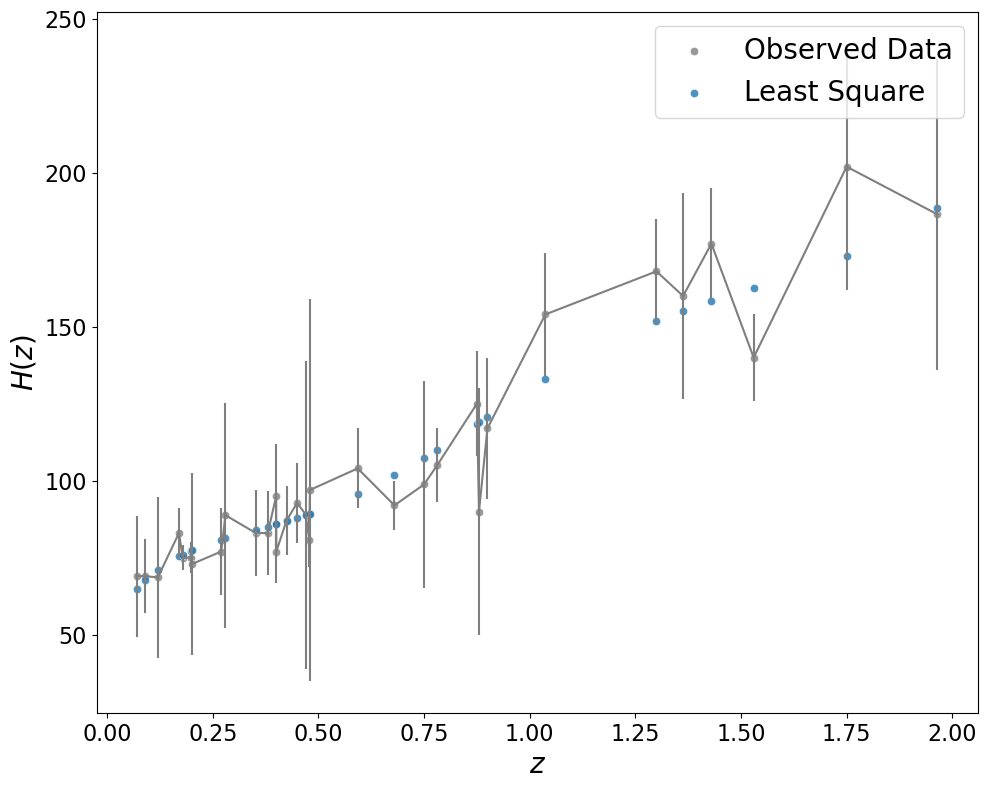

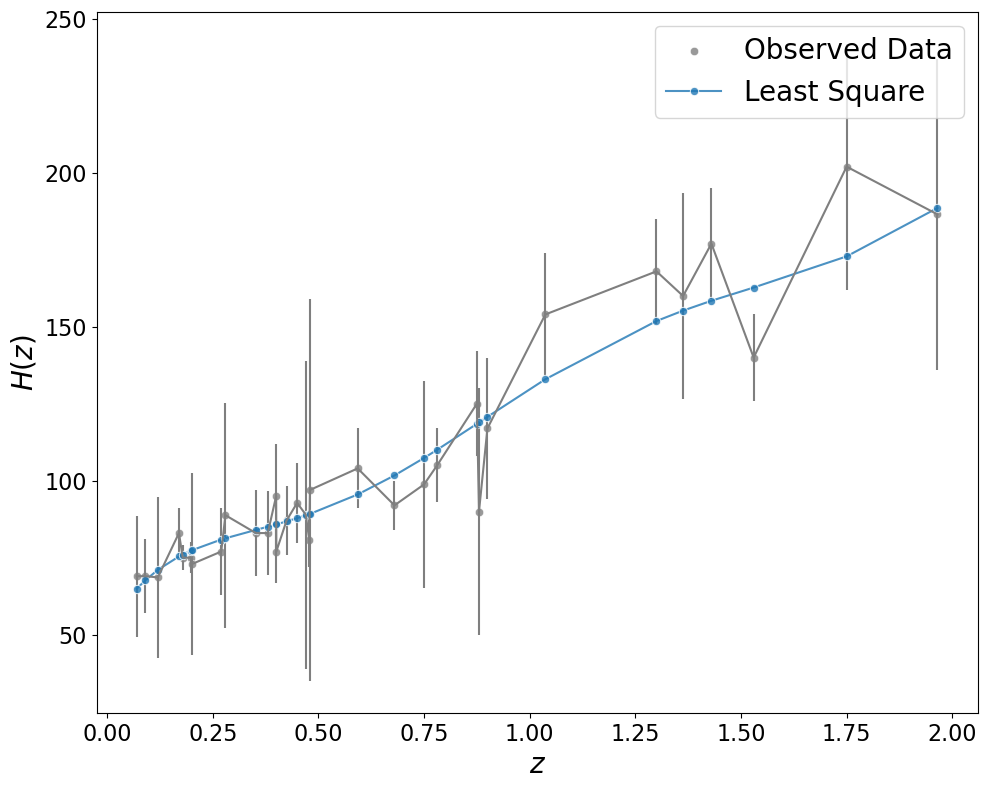

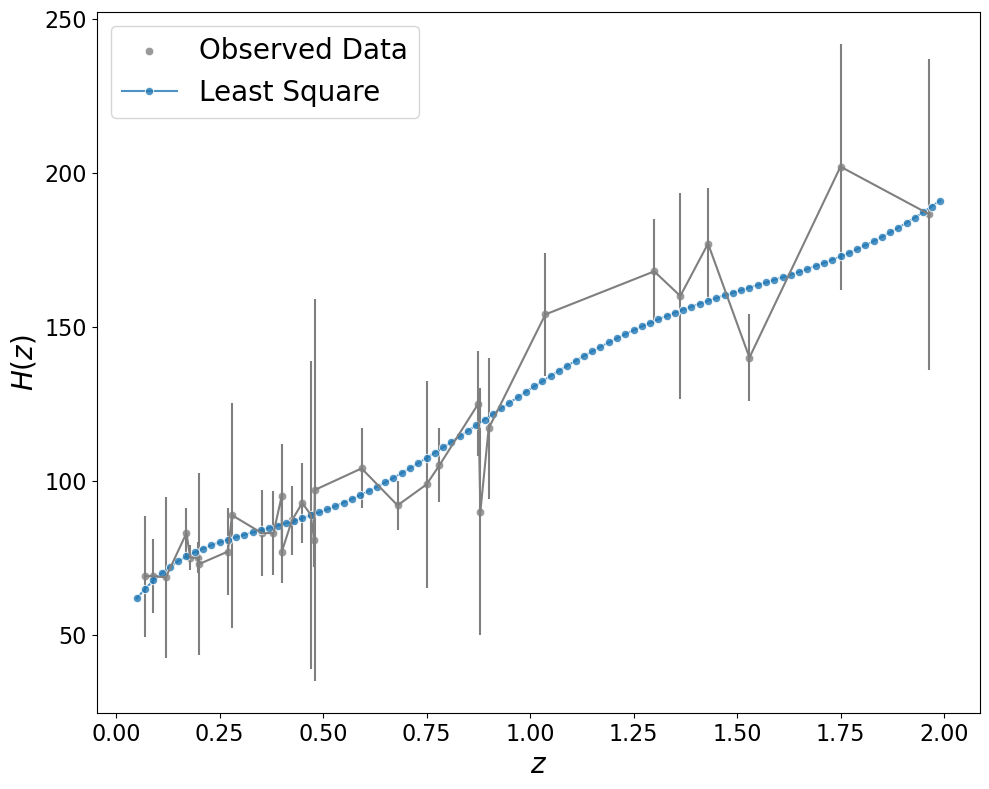

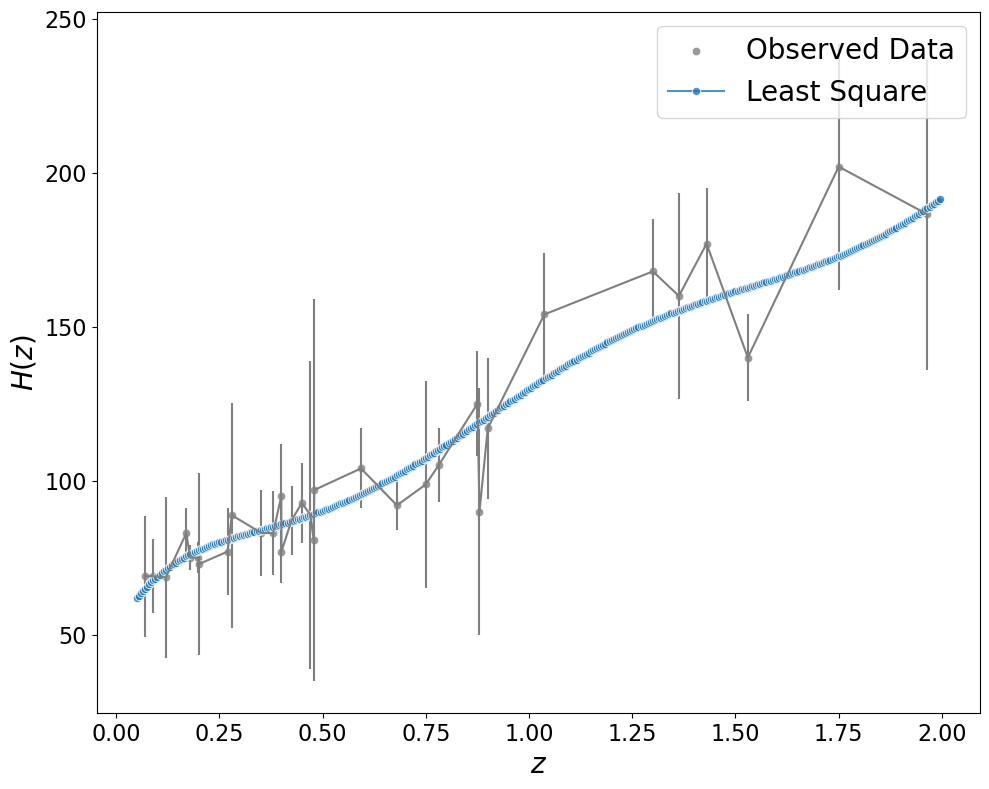

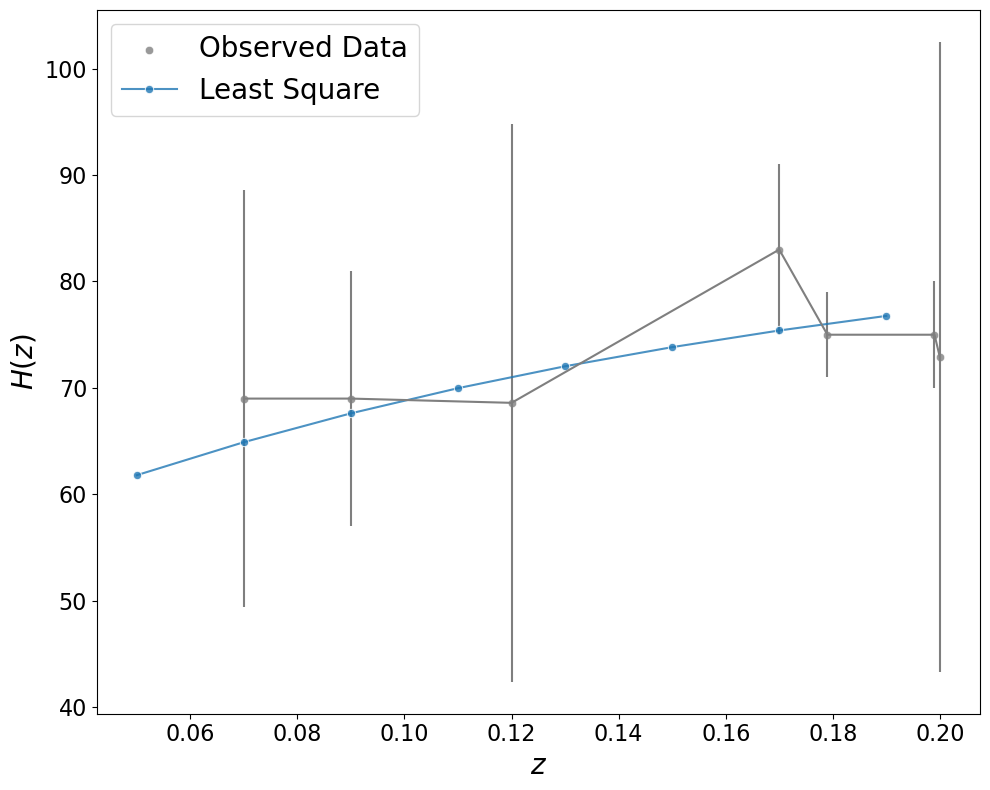

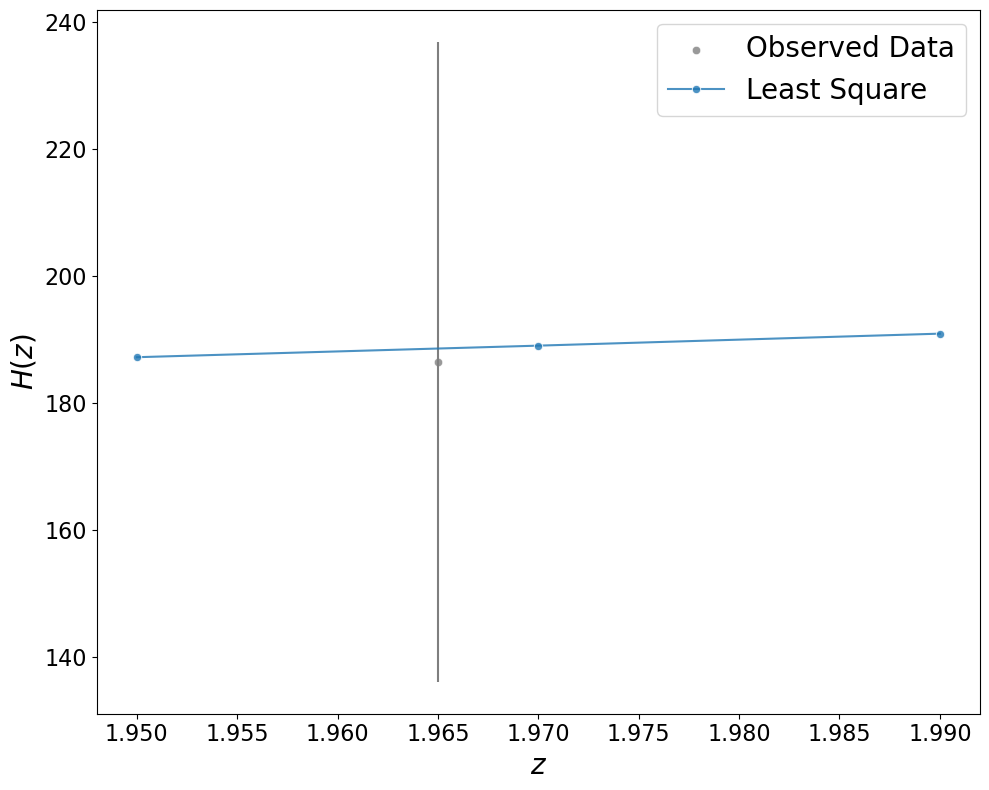

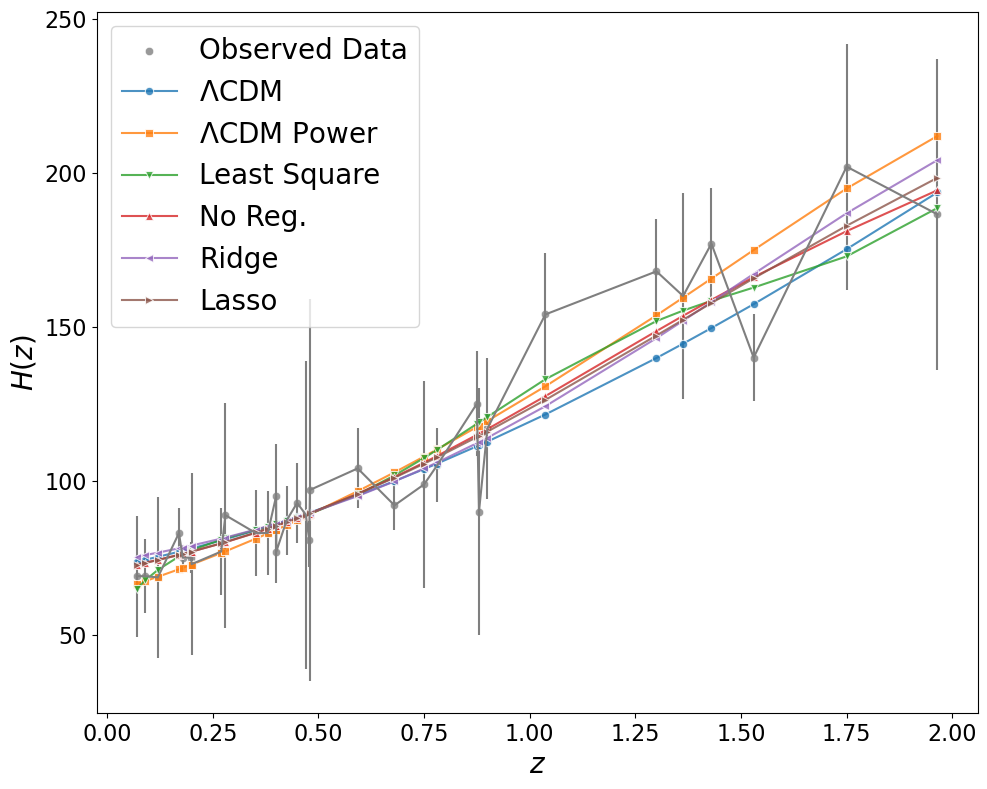

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


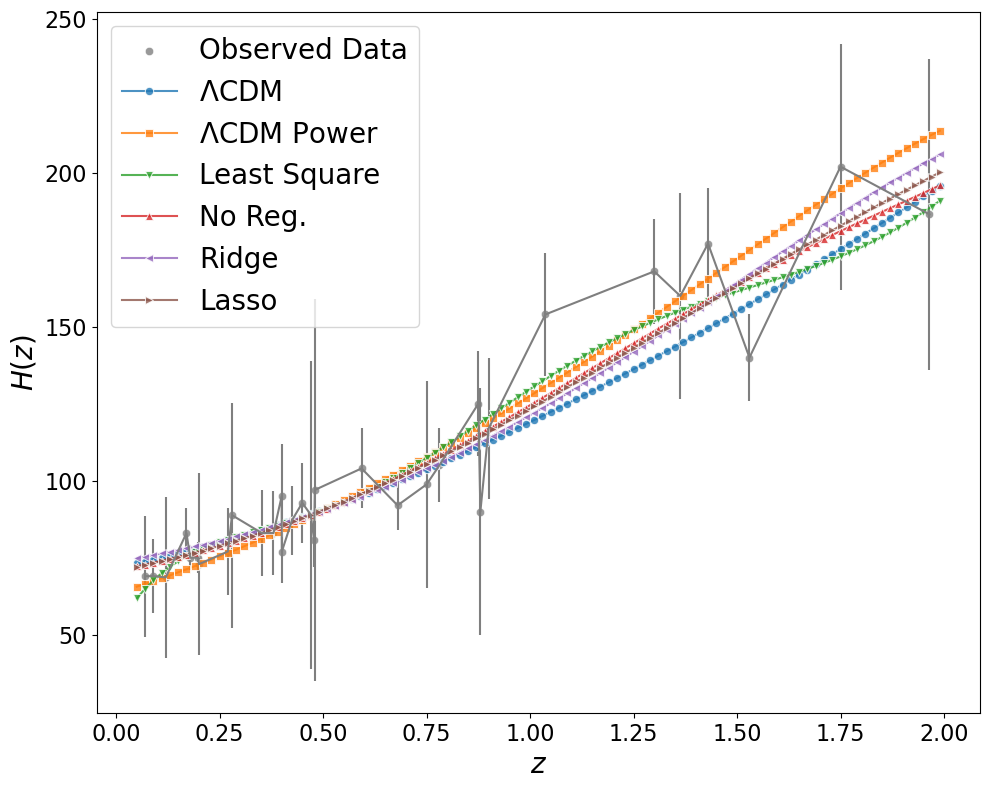

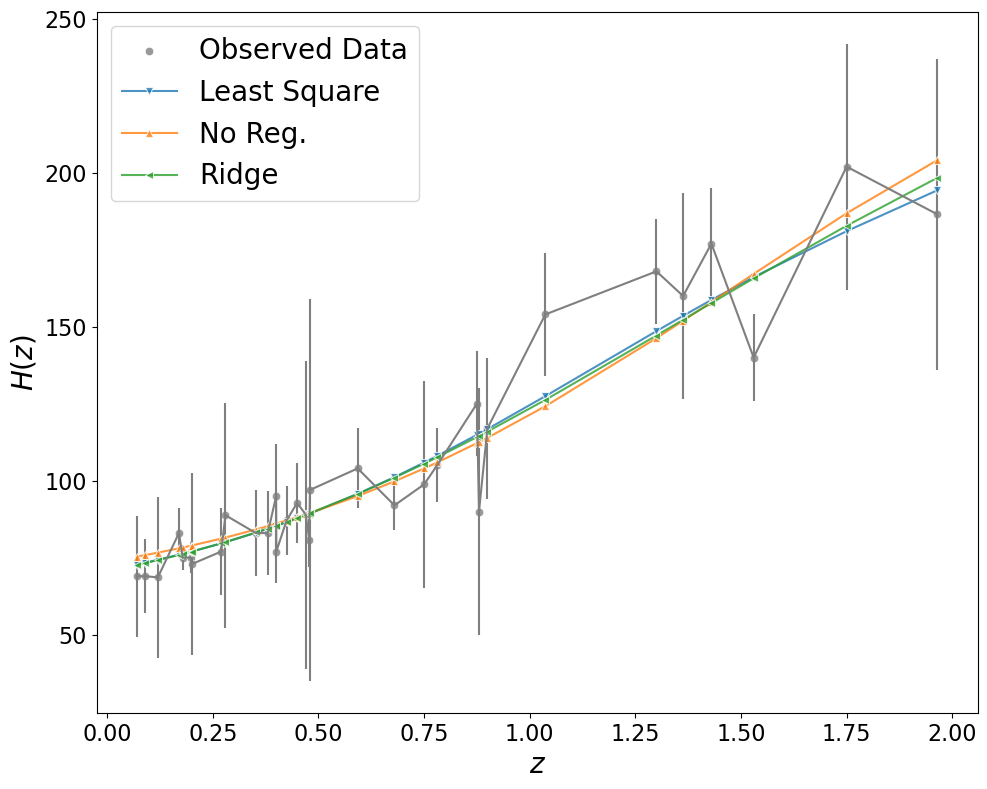

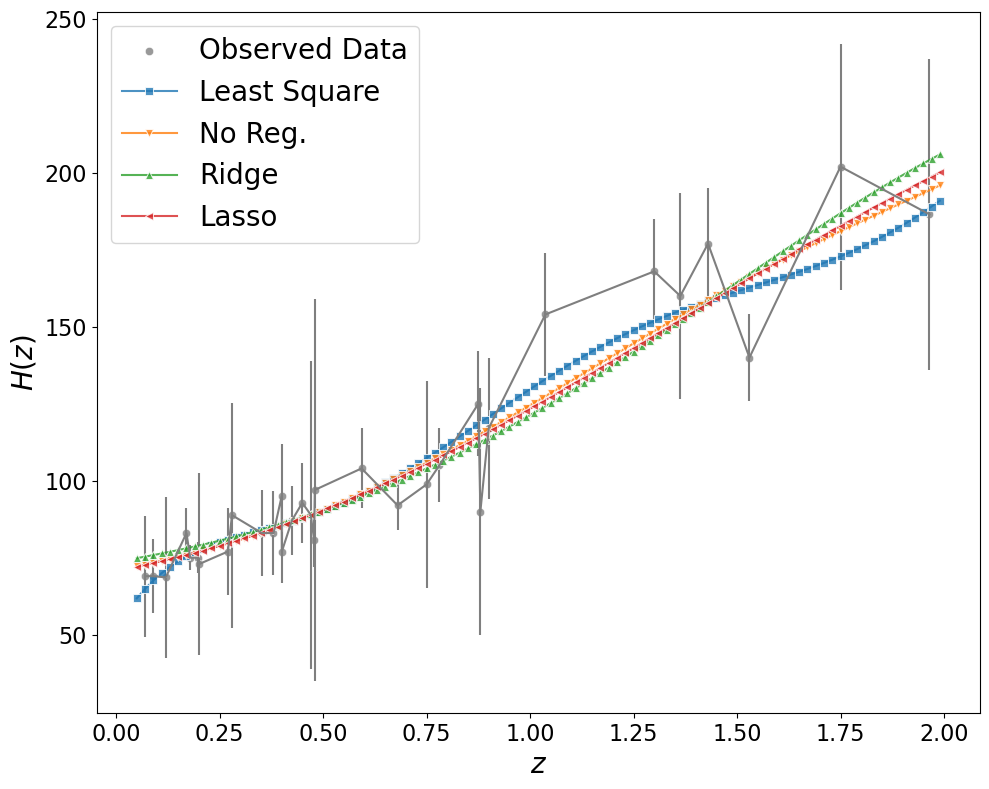

In [20]:
draw_ML_functions(H_ML_none, params, train_x, train_y, train_sigma, 'Least Square')

In [8]:
th_min = [-0.9, 0.0, 20.0, 0.0, 0.9, 0.0, -100.0, 10.0, 0, 0, 0, 0, 0, -100, -100, -100, -100, -100, -100, -100]
th_max = [0.9, 1.0, 200.0, 0.5, 1.1, 2.0, 100.0, 200, 50, 100, 10, 200, 200, 100, 100, 100, 100, 100, 100, 100]
th_fixed = [0.0, 0.95, 100.0, 0.05, 1, 1, 0, 8.55**2, 19.1, 30.99, 4.88, 79.0, 92.3, 0, 0, 0, 0, 0, 0, 0]
variants = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]
vary_index = get_varying_index(variants)
beta = 0.001
set_global_params(th_fixed, vary_index, variants, beta)
set_train_data(train_x, train_y, train_sigma)

In [9]:
params_lcdm =[  68.133,   32.704, 24.855, -1.029, -4.040,  2.314,   0.355] 
params_curvefit =[  55.99787729 , 182.70364549, -487.77741817,  498.40171095,   96.76843638, -301.99012188,   91.96869298] 
params_none = [65.19150947,   96.37304528, -204.84092753,  103.82747624,  331.73884544, -347.95102451,   90.28361852]
params_ridge = [72.23508144,  13.38461105,   3.75429337, 106.03935698, -73.41626385,   3.81633195,   4.4323096]
params_lasso = [65.07883175,   96.94751382, -205.04598287,  103.12484364,  331.56479242, -347.11871663,   89.99203462]
print("chi^2 LCDM = {0}".format(loglikeML_None_restricted(params_lcdm)))
print("chi^2 Least Square = {0}".format(loglikeML_None_restricted(params_curvefit)))
print("chi^2 No Penalty = {0}".format(loglikeML_None_restricted(params_none)))
print("chi^2 Ridge = {0}".format(loglikeML_Ridge_restricted(params_ridge)))
print("chi^2 Lasso = {0}".format(loglikeML_Lasso_restricted(params_lasso)))


chi^2 LCDM = -8.650712284258415
chi^2 Least Square = -4.985313404991062
chi^2 No Penalty = -5.282743811179722
chi^2 Ridge = -17.36415088899085
chi^2 Lasso = -5.902528190660974


In [12]:
AIC = -2*loglikeML_None_restricted(params_curvefit) + 2*2
BIC = -2*loglikeML_None_restricted(params_curvefit) + 2*np.log(len(train_x))
print("BIC = {0}, AIC = {1}".format(BIC, AIC))

BIC = 16.902098615581576, AIC = 13.970626809982123


In [10]:
AIC = -2*loglikeML_None_restricted(params_none) + 2*6
BIC = -2*loglikeML_None_restricted(params_none) + 6*np.log(len(train_x))
print("BIC = {0}, AIC = {1}".format(BIC, AIC))

BIC = 31.3599030391578, AIC = 22.56548762235944


In [11]:
AIC = -2*loglikeML_None_restricted(params_ridge) + 2*6
BIC = -2*loglikeML_None_restricted(params_ridge) + 6*np.log(len(train_x))
print("BIC = {0}, AIC = {1}".format(BIC, AIC))

BIC = 33.44306488810129, AIC = 24.648649471302928


In [12]:
AIC = -2*loglikeML_None_restricted(params_lasso) + 2*6
BIC = -2*loglikeML_None_restricted(params_lasso) + 6*np.log(len(train_x))
print("BIC = {0}, AIC = {1}".format(BIC, AIC))

BIC = 31.360599082370307, AIC = 22.56618366557195


Draw for grammar.txt case
-----------------------------------------

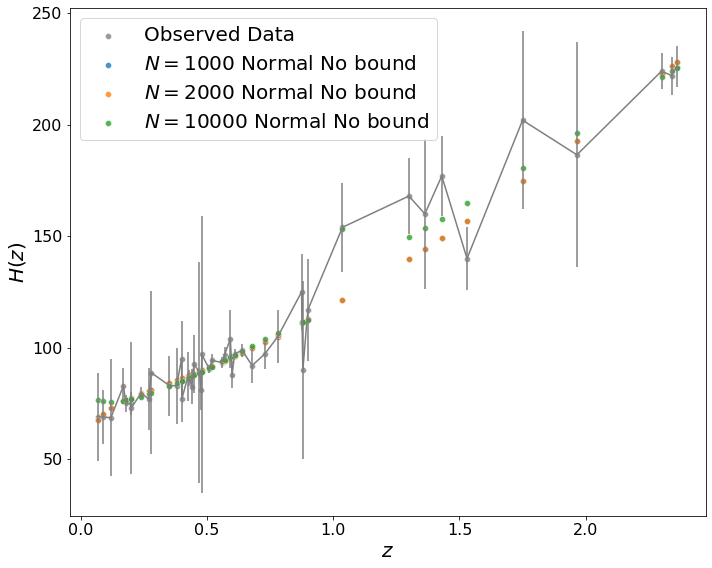

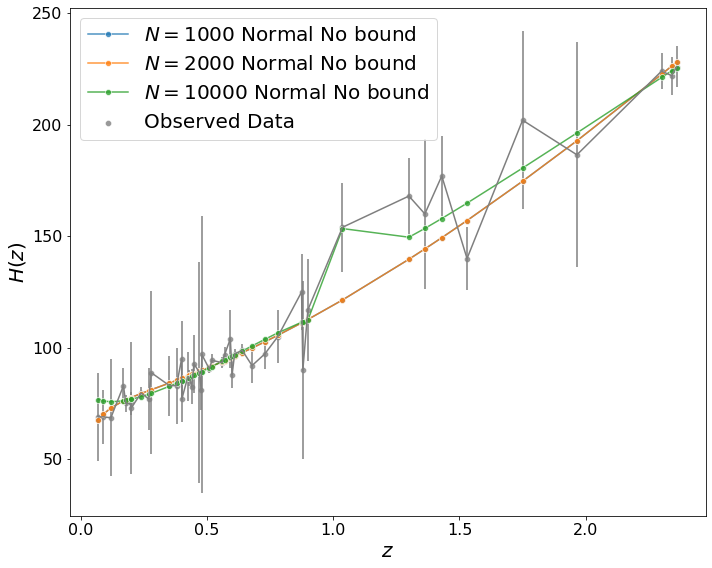

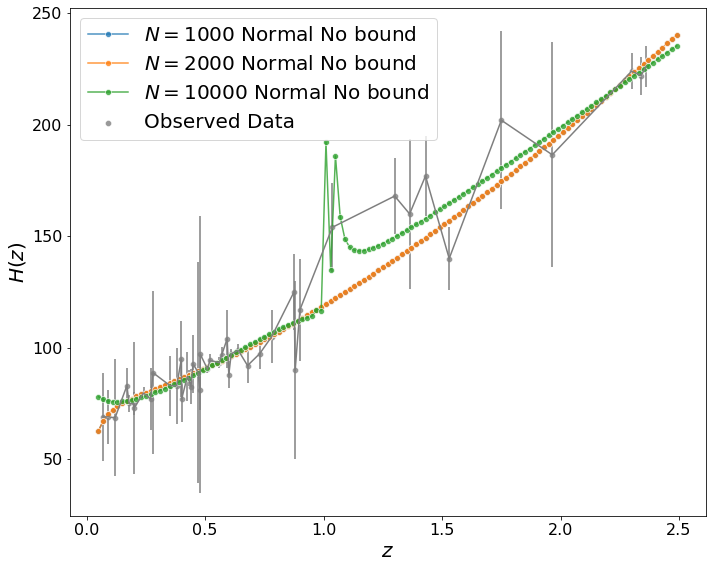

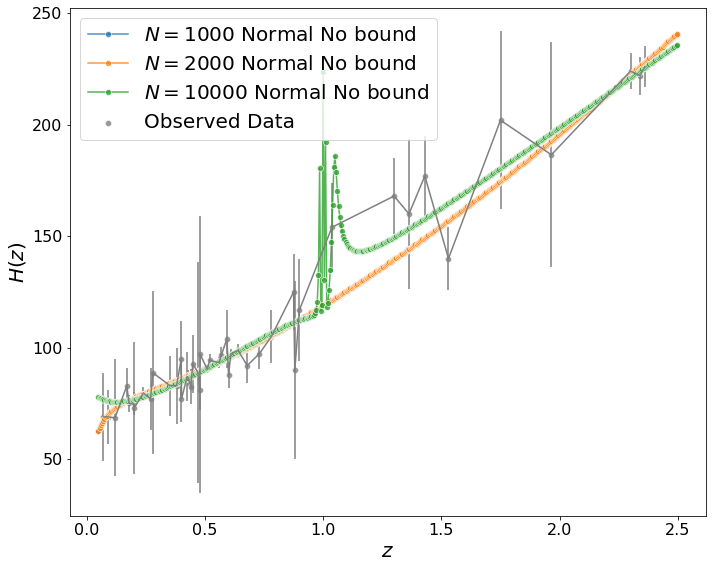

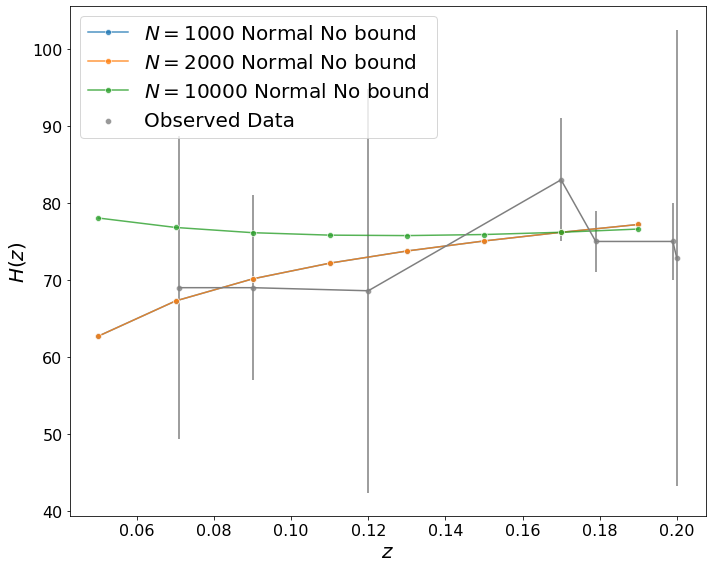

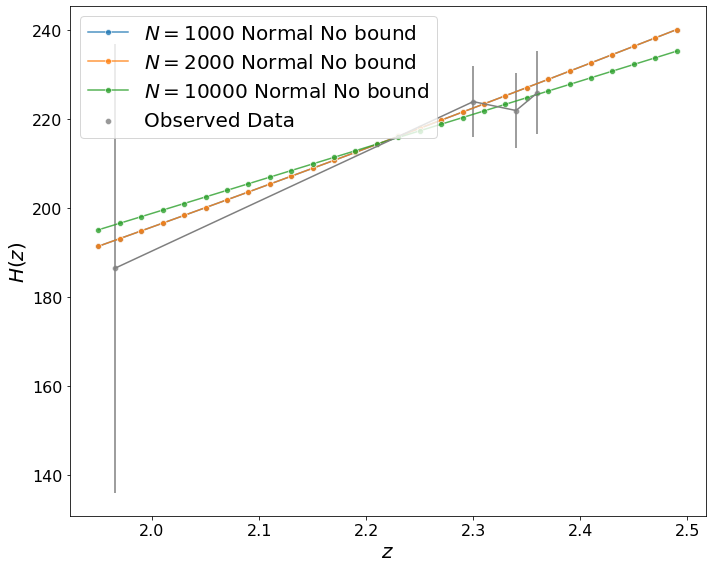

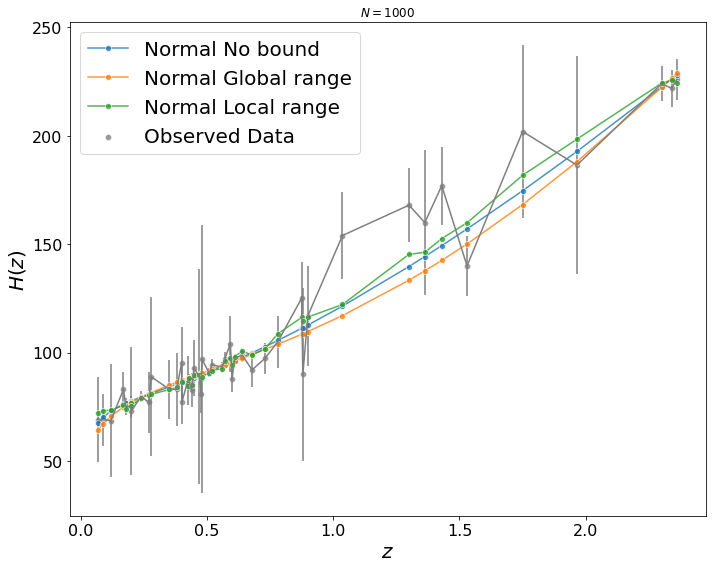

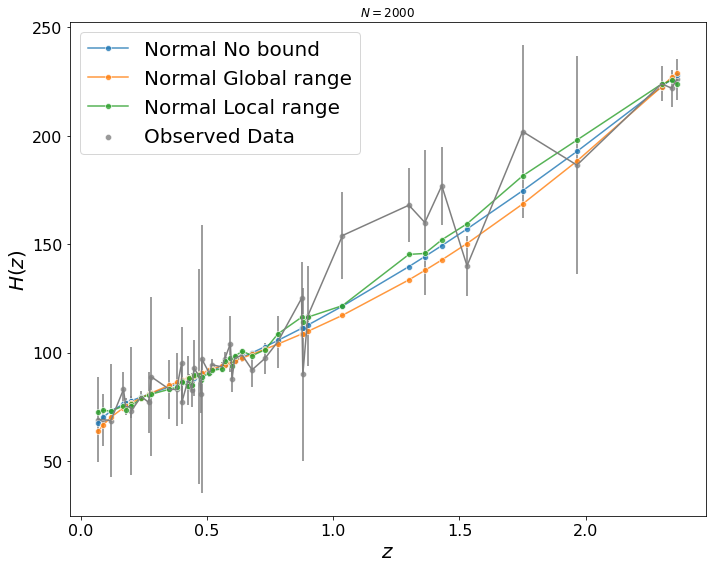

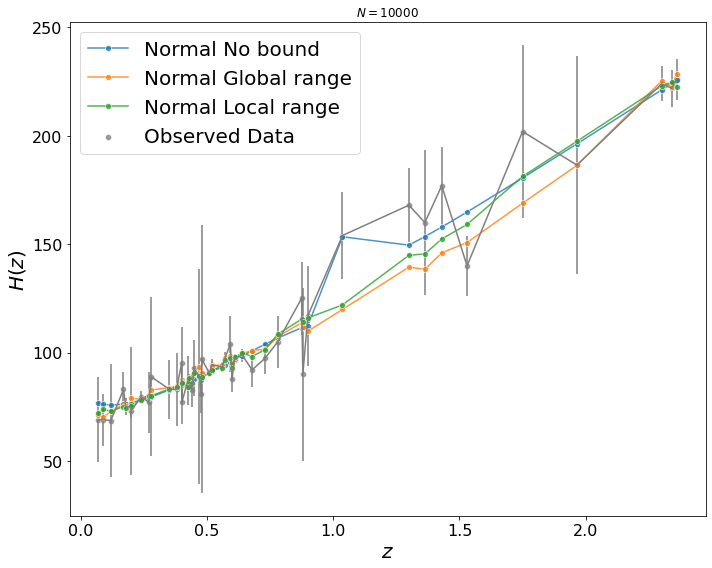

In [5]:
draw_functions('norm', 'nobound', train_x, train_y, train_sigma)

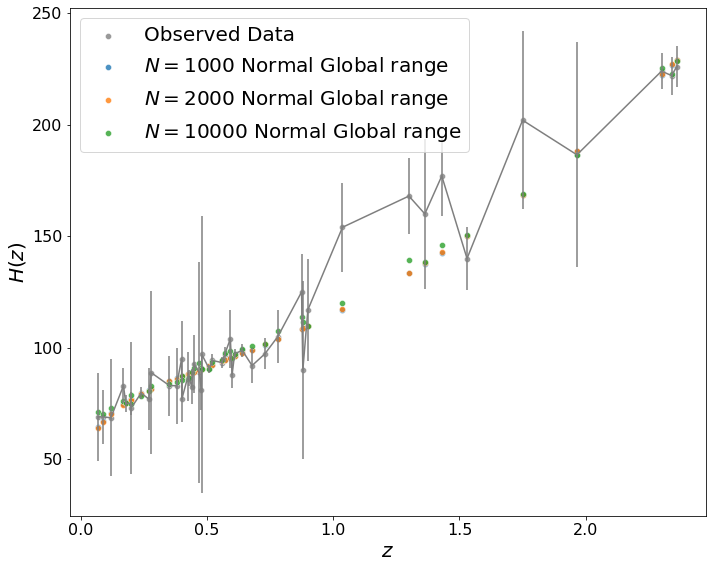

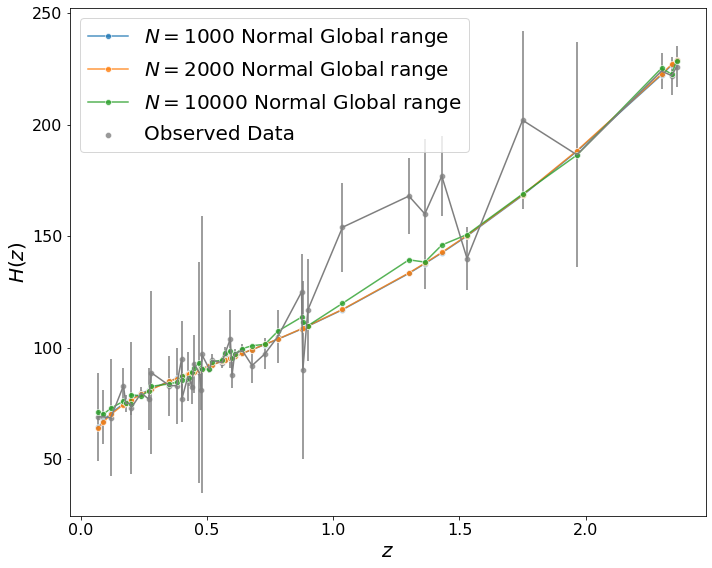

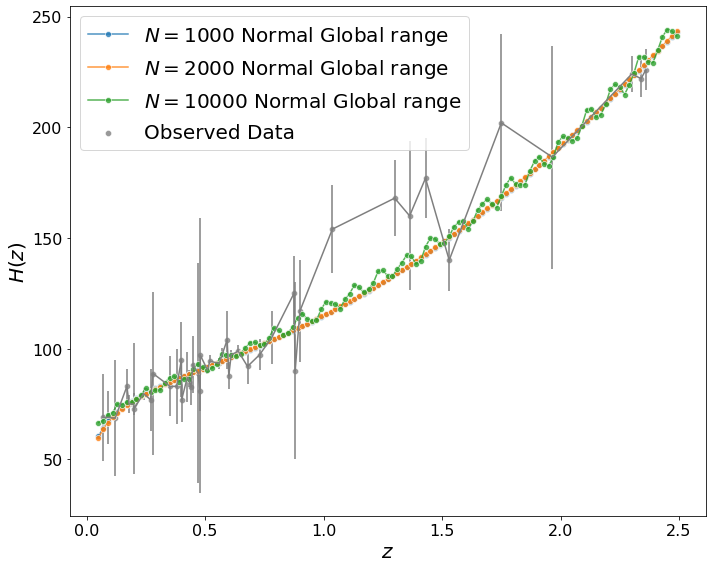

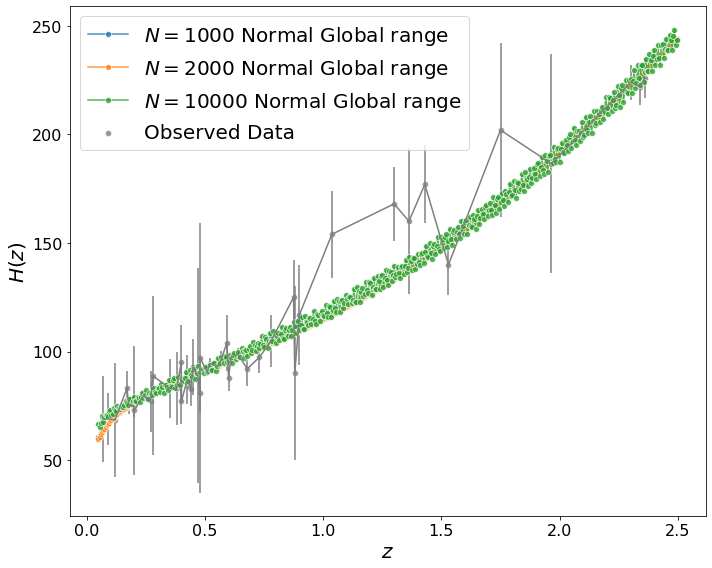

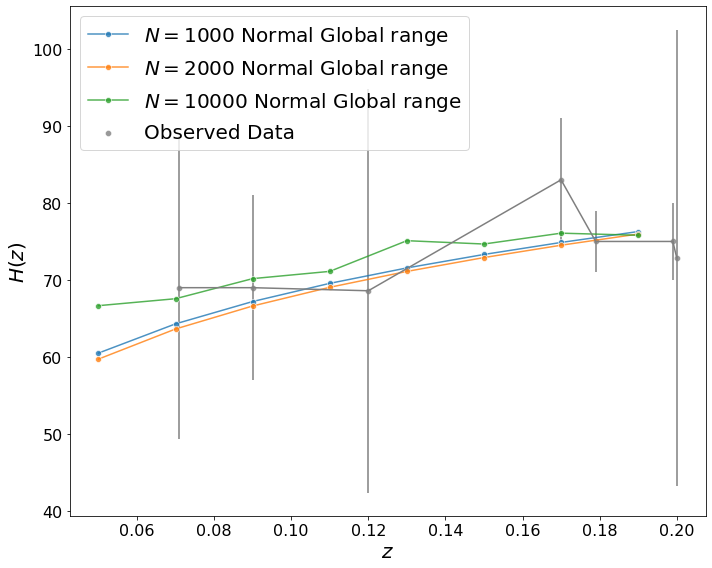

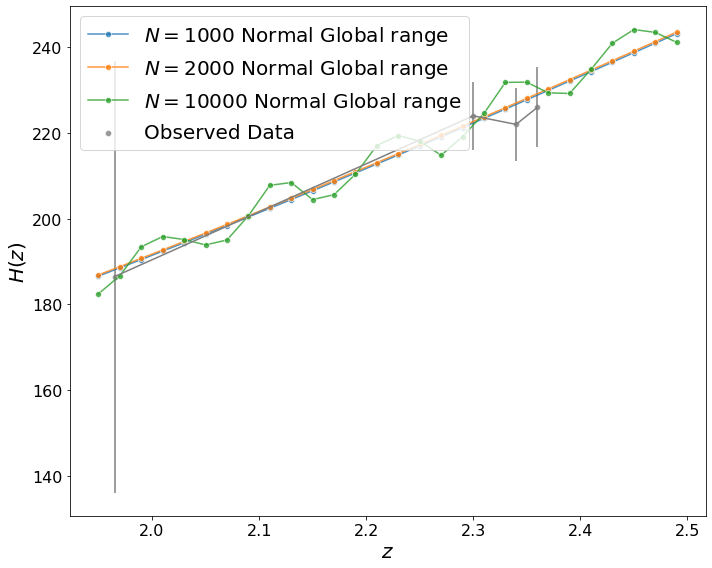

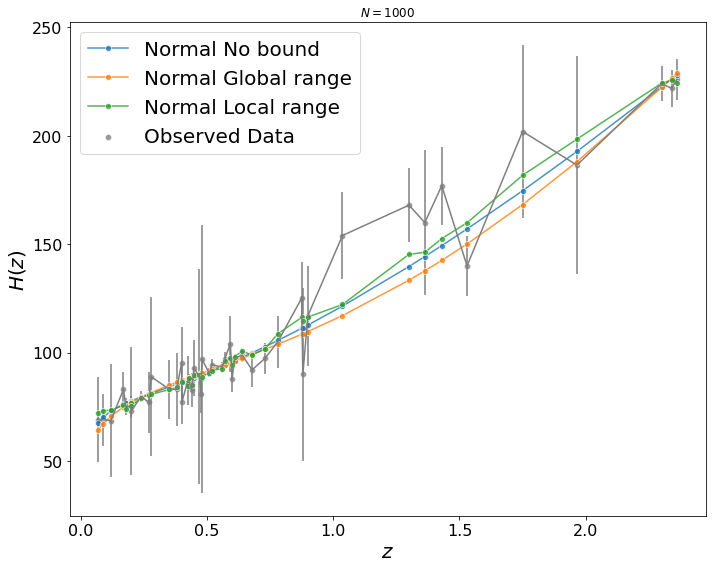

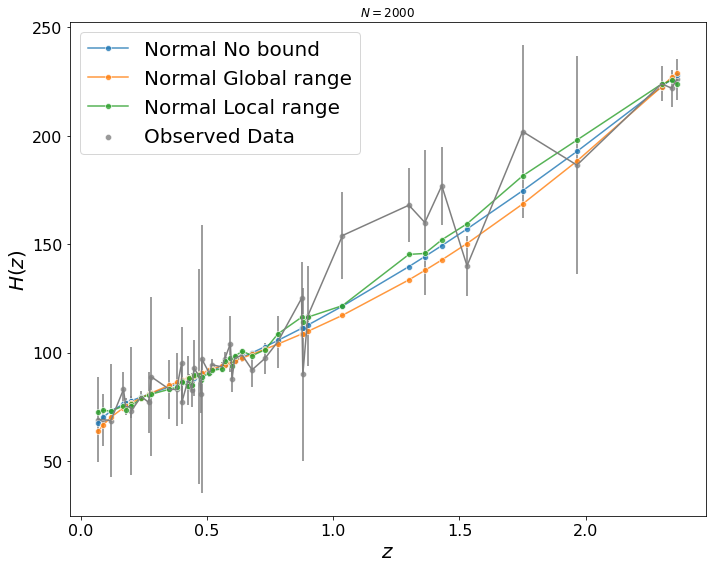

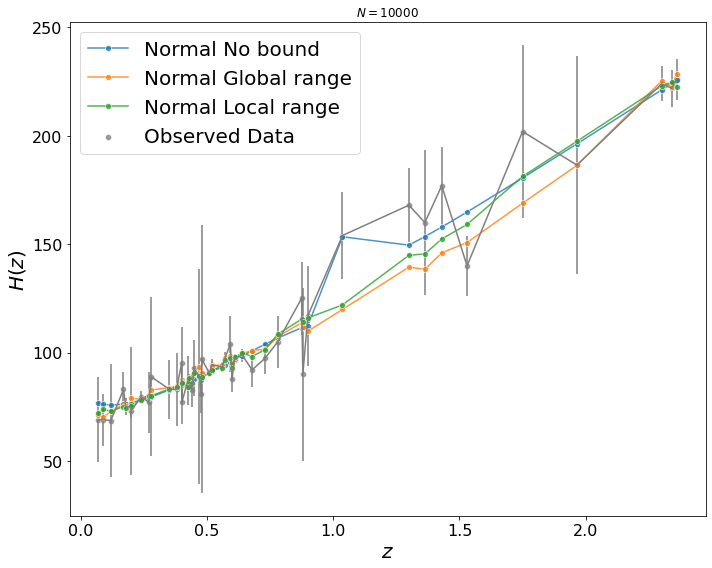

In [6]:
draw_functions('norm', 'global', train_x, train_y, train_sigma)

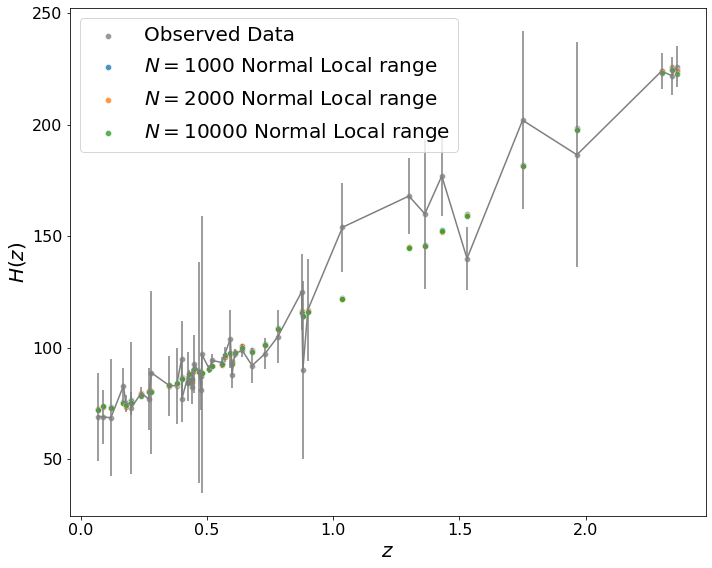

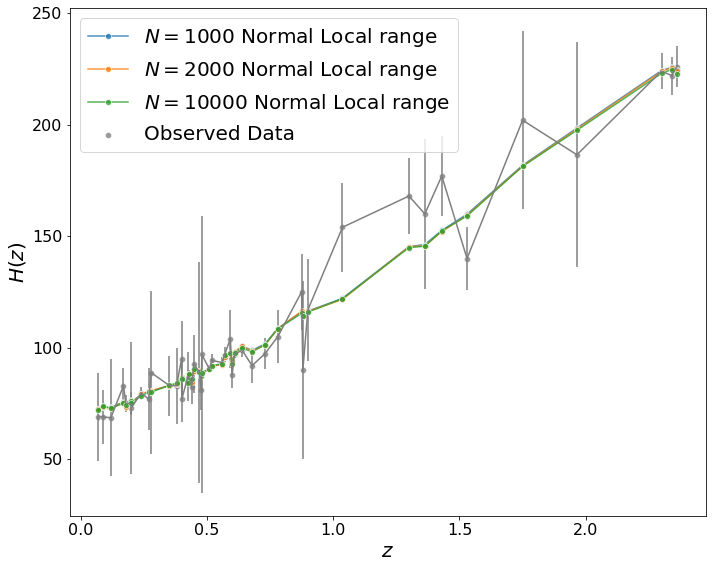

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:41: RuntimeWarning: invalid value encountered in sqrt
  v = 71.1*(np.sqrt(x1)**np.abs(2.58)+np.sqrt((((np.cos(np.sqrt(x1)))))))-np.sqrt(x1)-np.cos(np.log(x1)*160.8)*(((((np.cos(((x1)))))))+np.exp(0.7)*np.abs(np.sin(x1))+x1*np.sin(x1))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:60: RuntimeWarning: invalid value encountered in sqrt
  v = 71.0*(np.sqrt(x1)**np.abs(2.58)+np.sqrt((((np.cos(np.sqrt(x1)))))))-np.sqrt(x1)-np.cos(np.log(x1)*160.7)*(((((np.cos(((x1)))))))+np.exp(0.9)*np.abs(np.sin(x1))+x1*np.sin(x1))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:79: Runtime

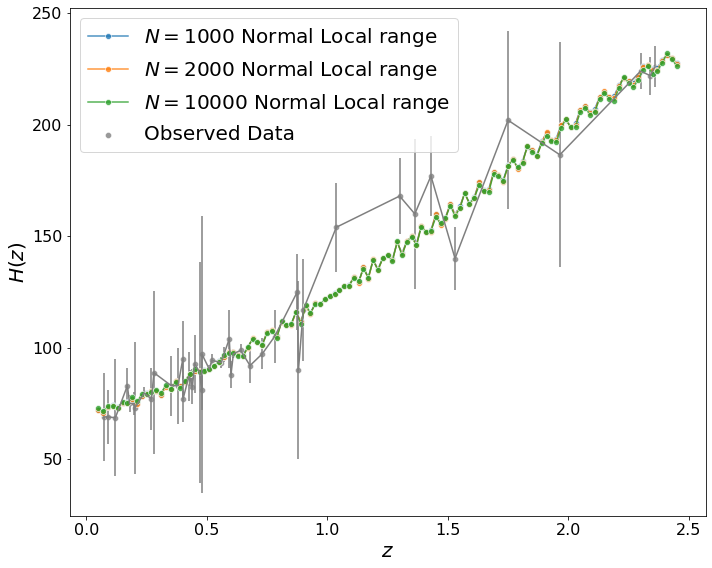

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:41: RuntimeWarning: invalid value encountered in sqrt
  v = 71.1*(np.sqrt(x1)**np.abs(2.58)+np.sqrt((((np.cos(np.sqrt(x1)))))))-np.sqrt(x1)-np.cos(np.log(x1)*160.8)*(((((np.cos(((x1)))))))+np.exp(0.7)*np.abs(np.sin(x1))+x1*np.sin(x1))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:60: RuntimeWarning: invalid value encountered in sqrt
  v = 71.0*(np.sqrt(x1)**np.abs(2.58)+np.sqrt((((np.cos(np.sqrt(x1)))))))-np.sqrt(x1)-np.cos(np.log(x1)*160.7)*(((((np.cos(((x1)))))))+np.exp(0.9)*np.abs(np.sin(x1))+x1*np.sin(x1))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:79: Runtime

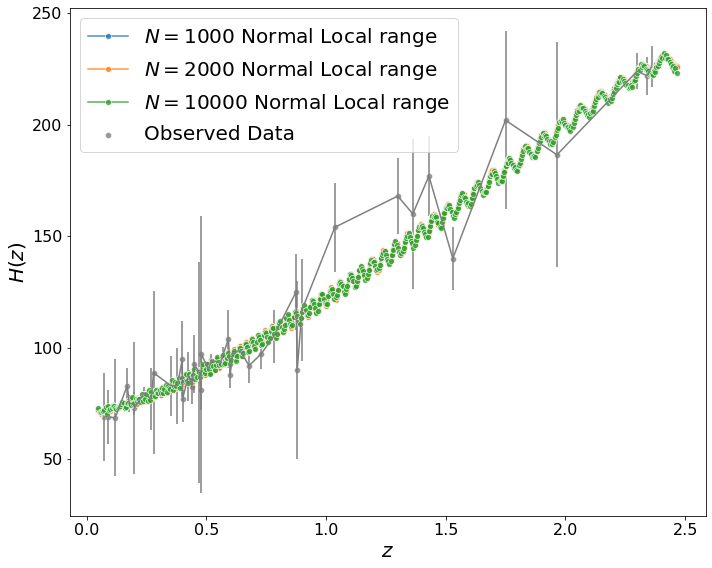

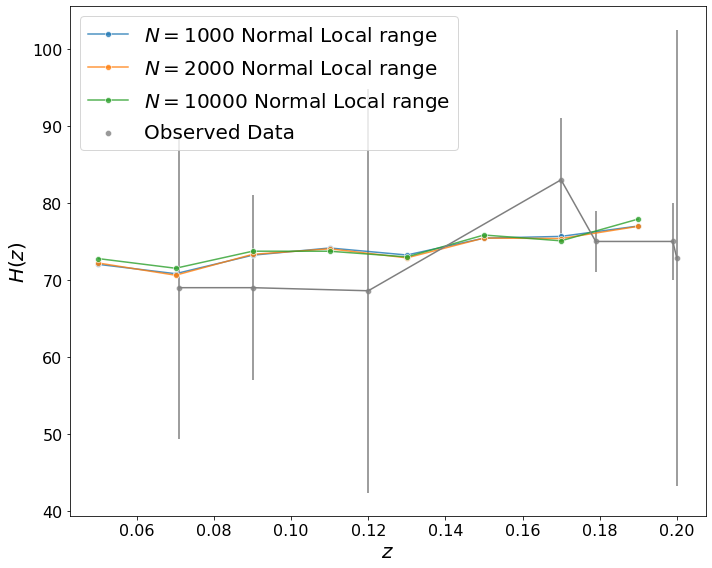

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:41: RuntimeWarning: invalid value encountered in sqrt
  v = 71.1*(np.sqrt(x1)**np.abs(2.58)+np.sqrt((((np.cos(np.sqrt(x1)))))))-np.sqrt(x1)-np.cos(np.log(x1)*160.8)*(((((np.cos(((x1)))))))+np.exp(0.7)*np.abs(np.sin(x1))+x1*np.sin(x1))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:60: RuntimeWarning: invalid value encountered in sqrt
  v = 71.0*(np.sqrt(x1)**np.abs(2.58)+np.sqrt((((np.cos(np.sqrt(x1)))))))-np.sqrt(x1)-np.cos(np.log(x1)*160.7)*(((((np.cos(((x1)))))))+np.exp(0.9)*np.abs(np.sin(x1))+x1*np.sin(x1))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:79: Runtime

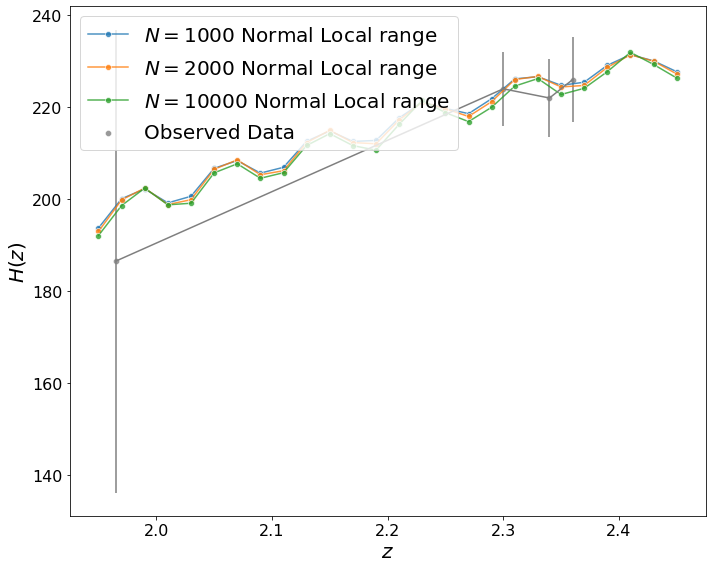

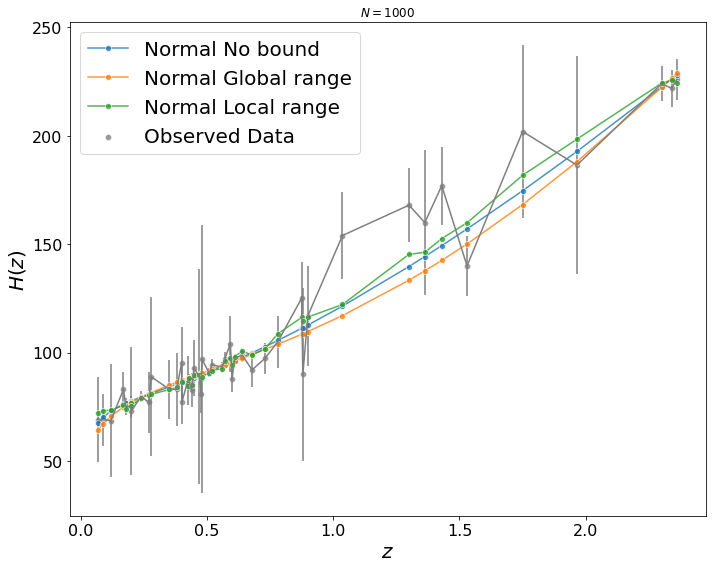

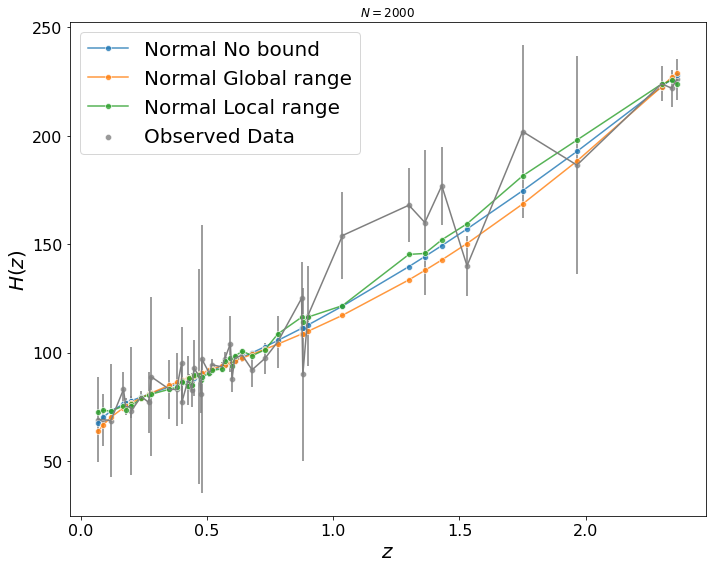

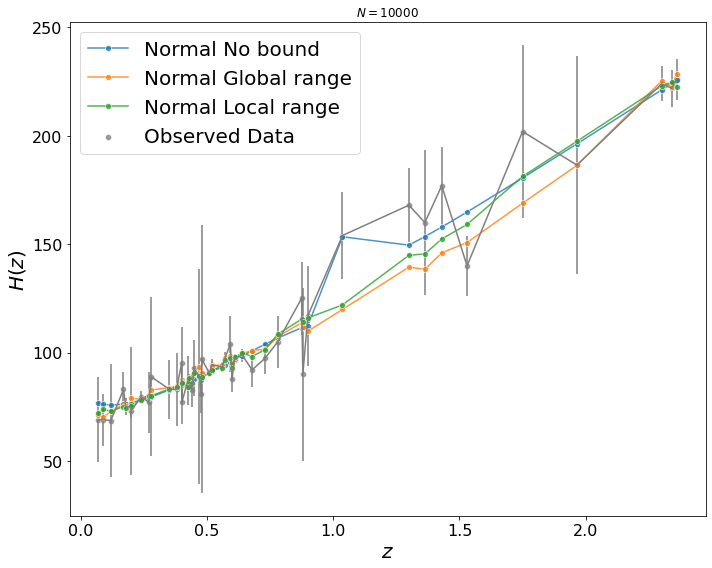

In [7]:
draw_functions('norm', 'local', train_x, train_y, train_sigma)

Draw for grammar_notrig.txt function
-----------------------------------------------------------------------------

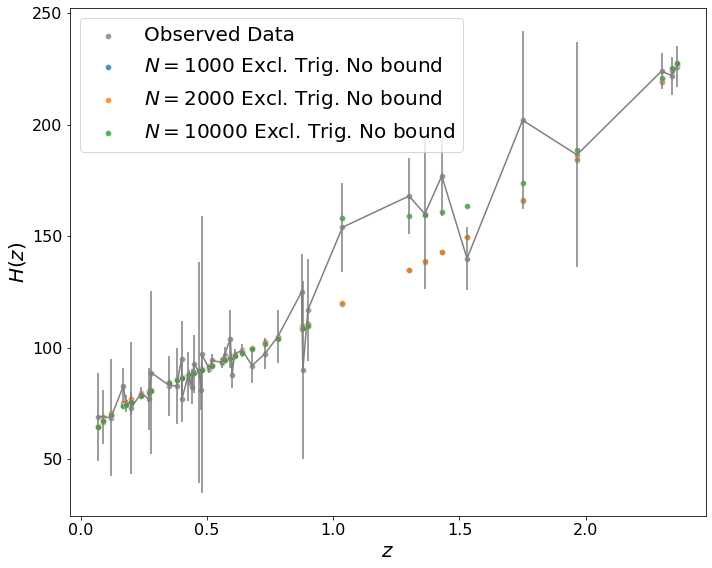

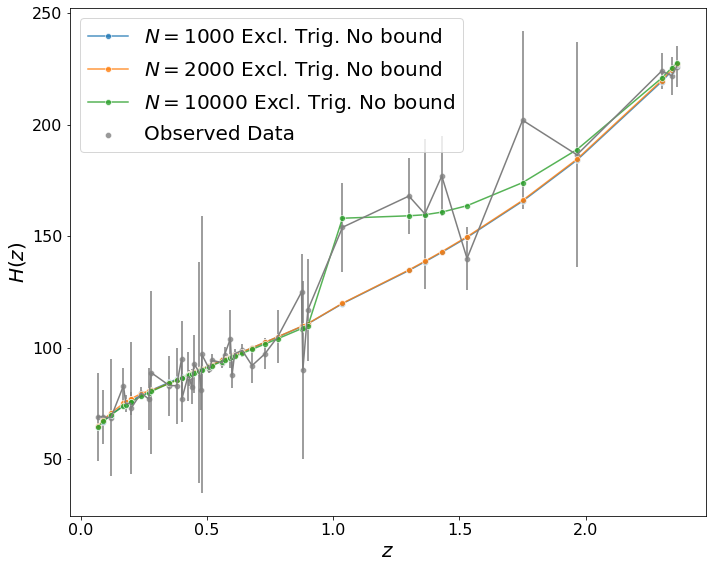

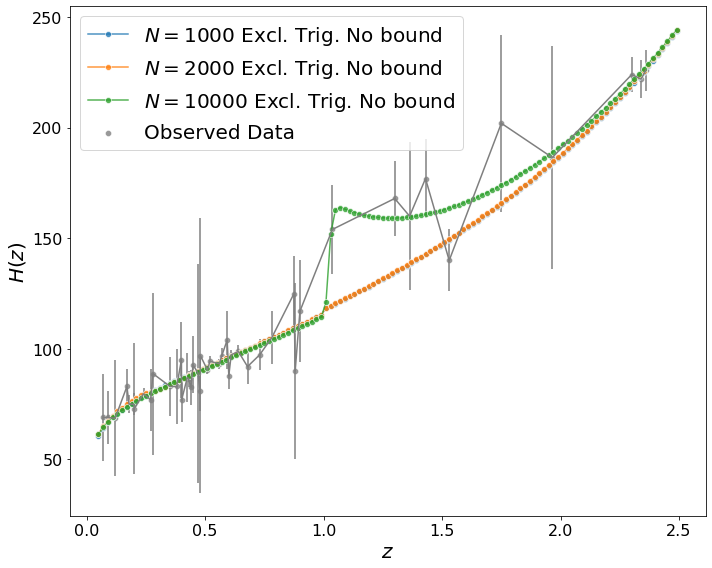

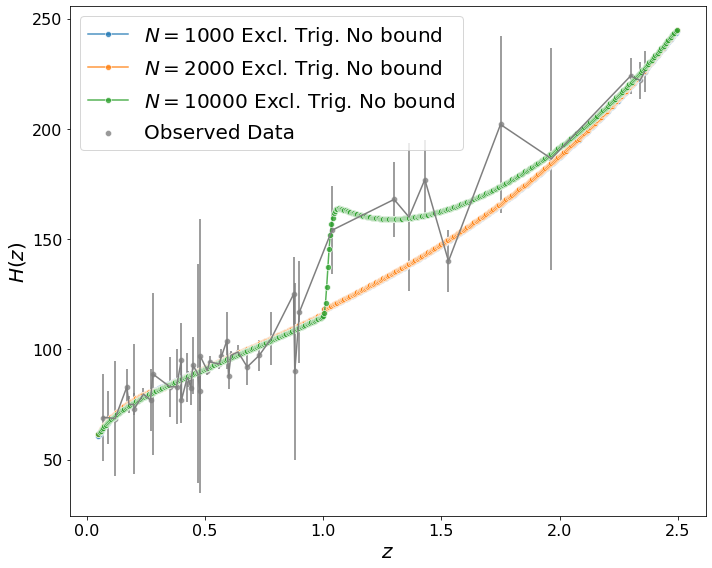

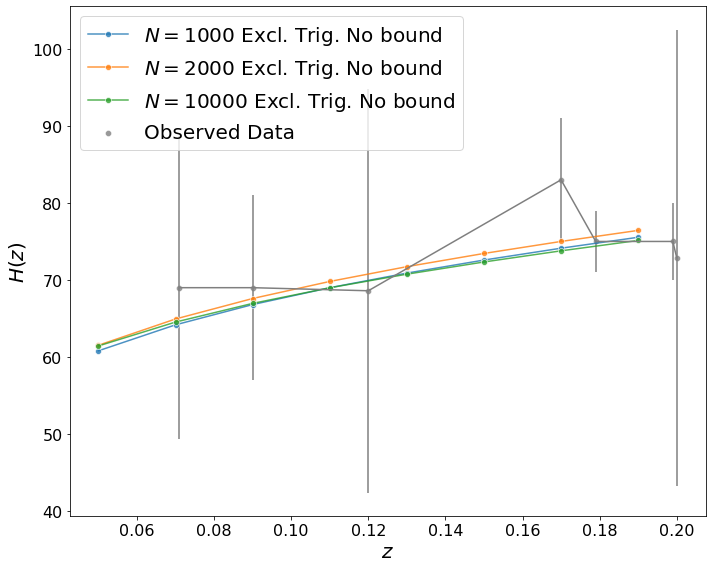

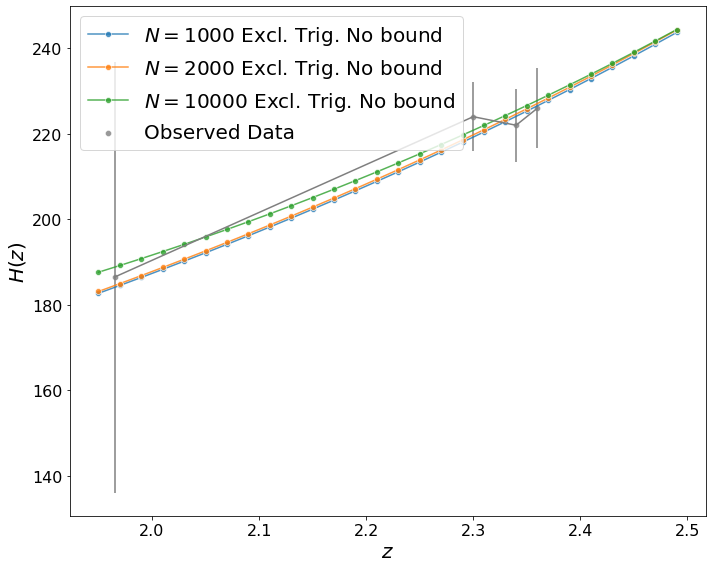

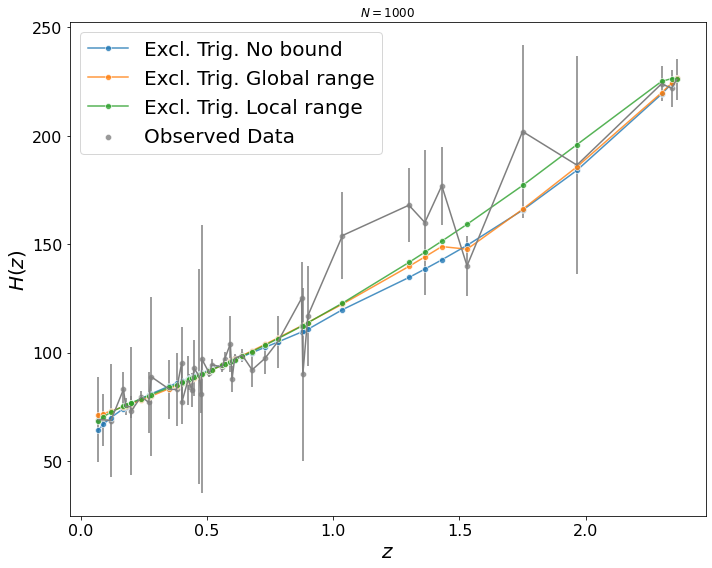

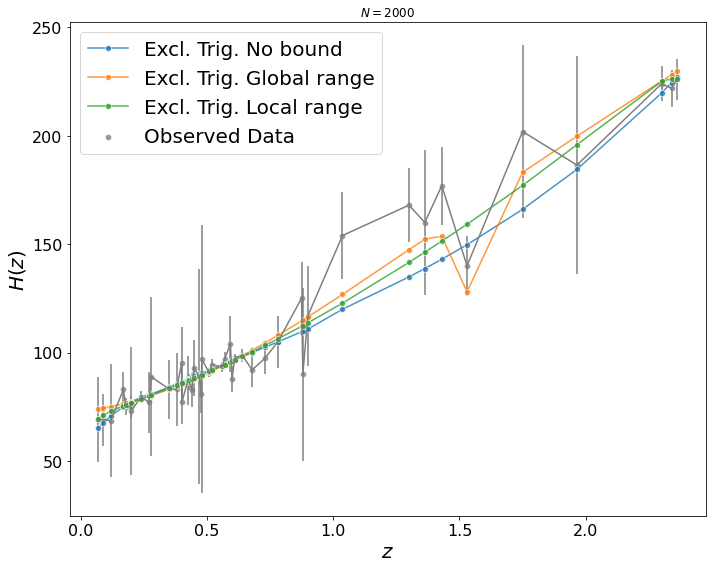

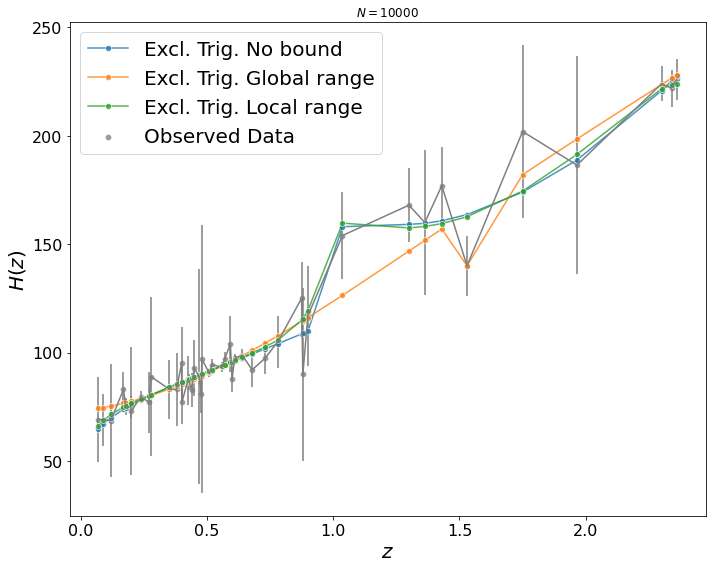

In [8]:
draw_functions('notrig', 'nobound', train_x, train_y, train_sigma)

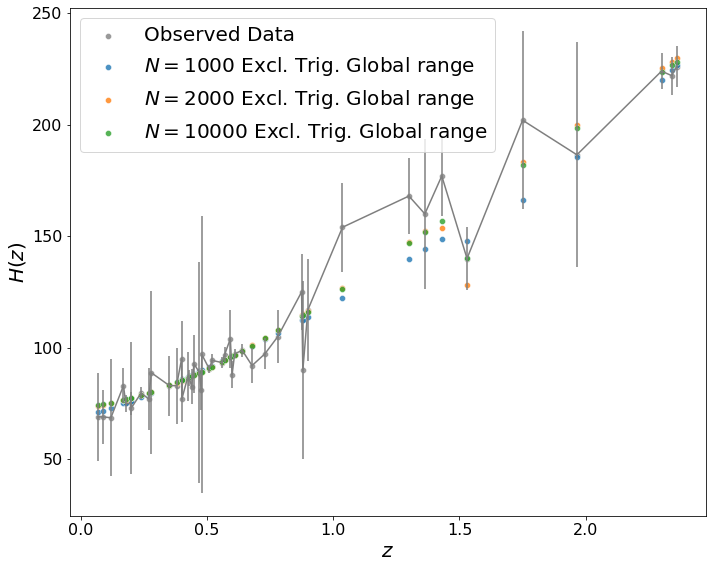

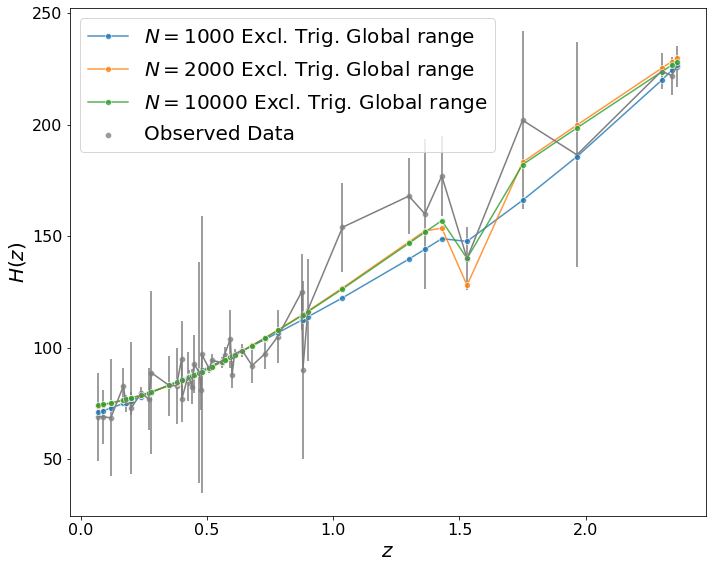

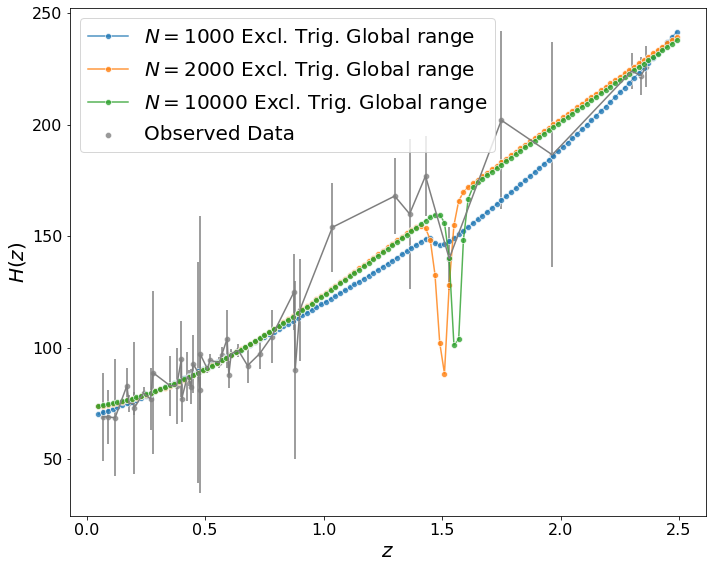

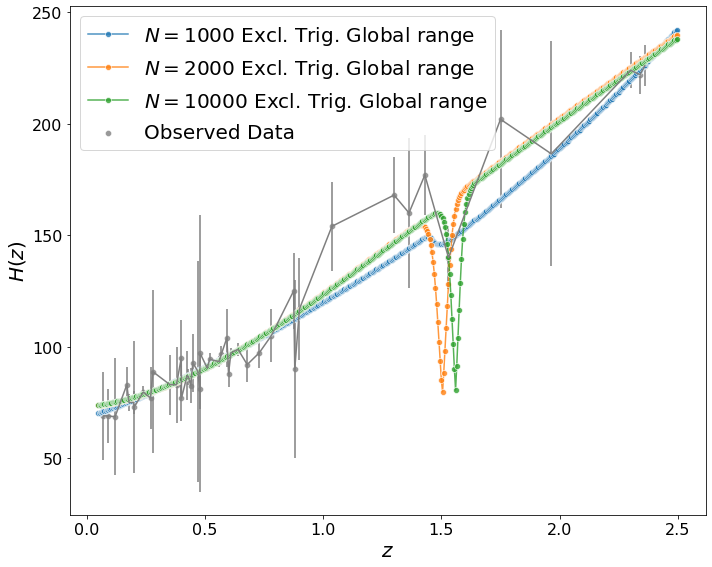

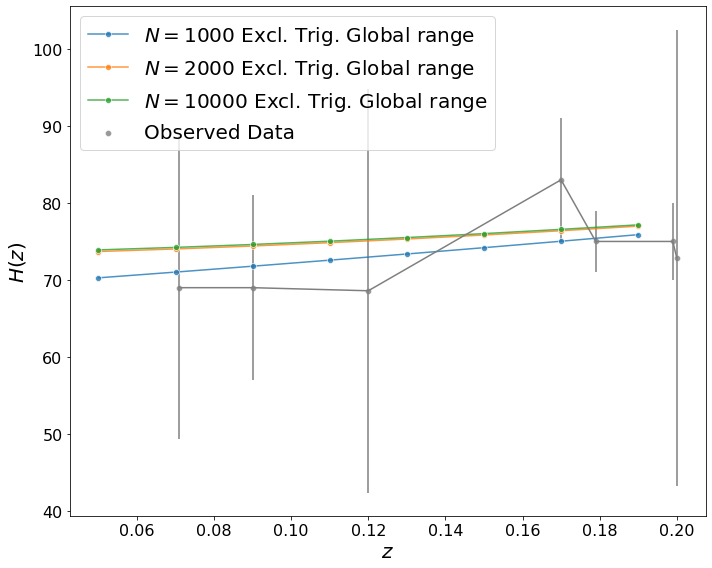

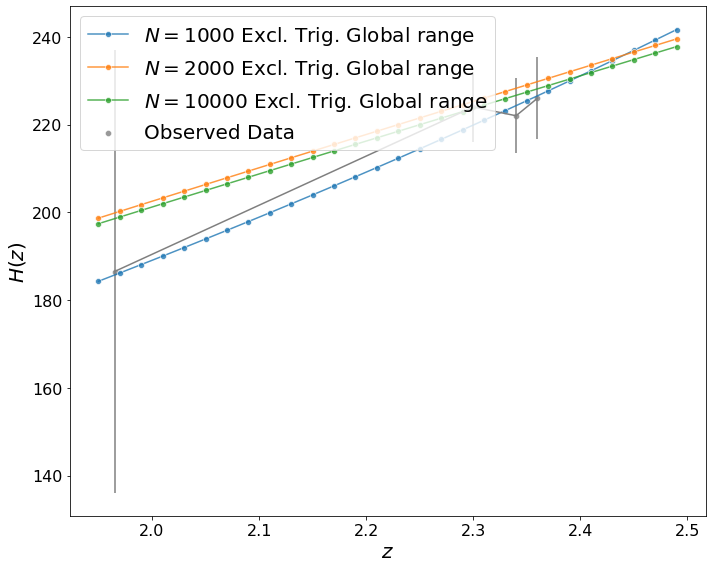

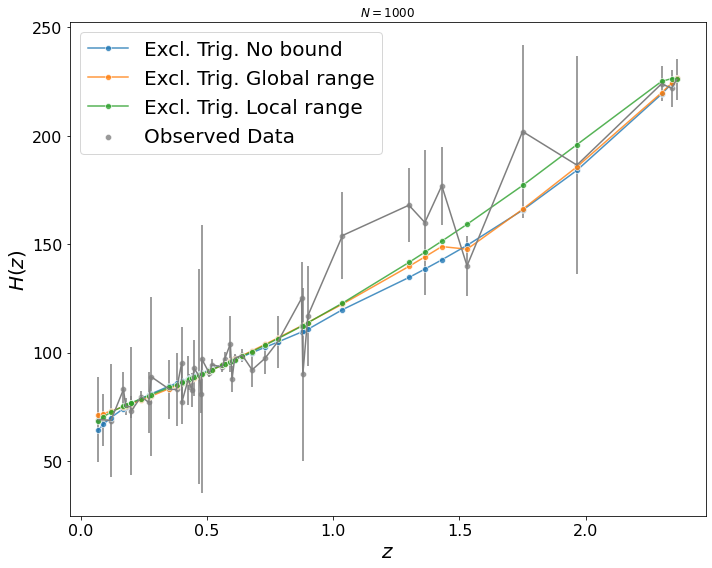

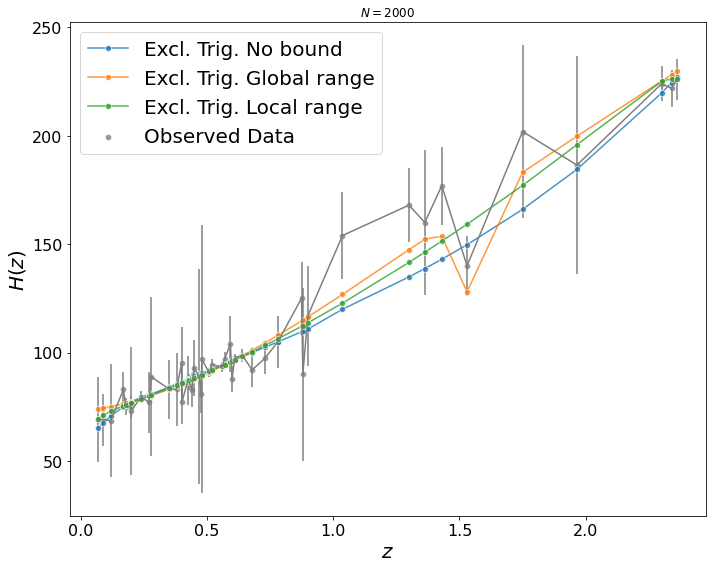

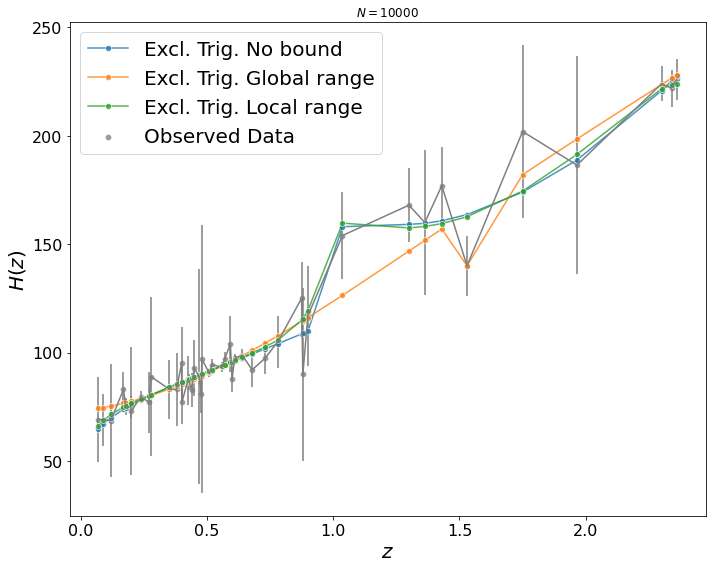

In [9]:
draw_functions('notrig', 'global', train_x, train_y, train_sigma)

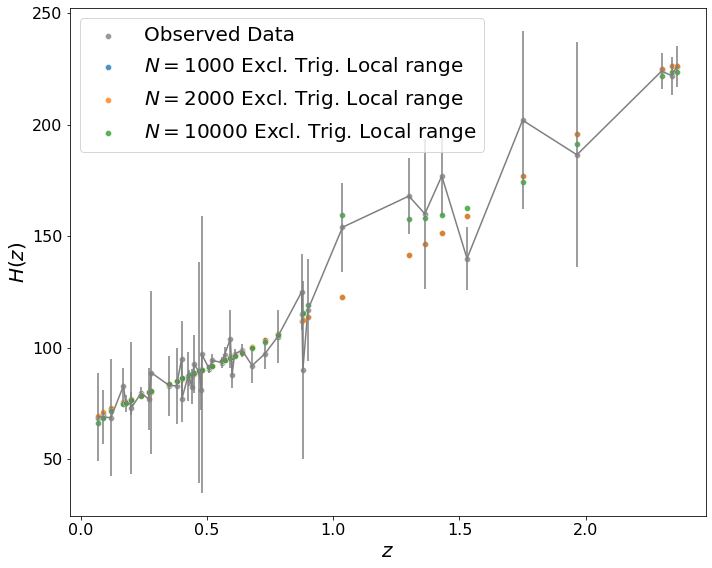

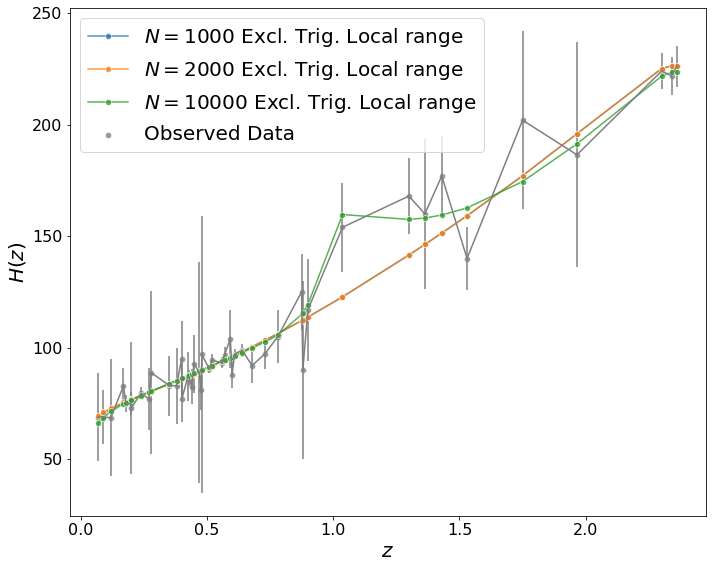

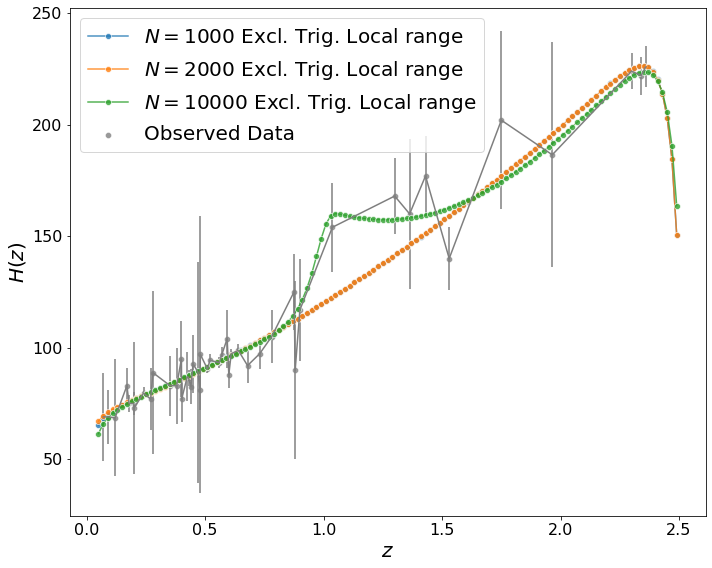

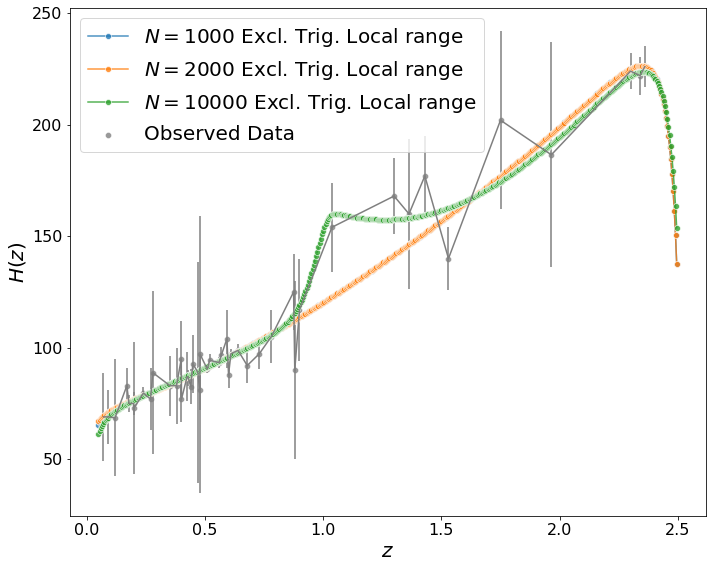

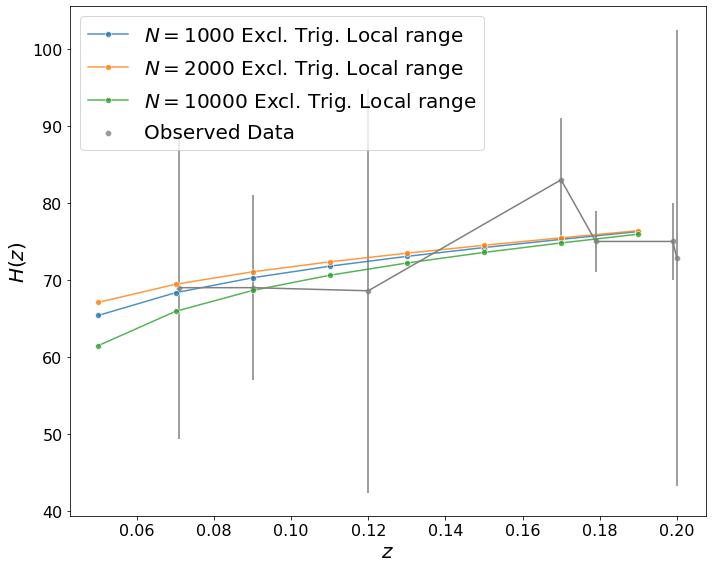

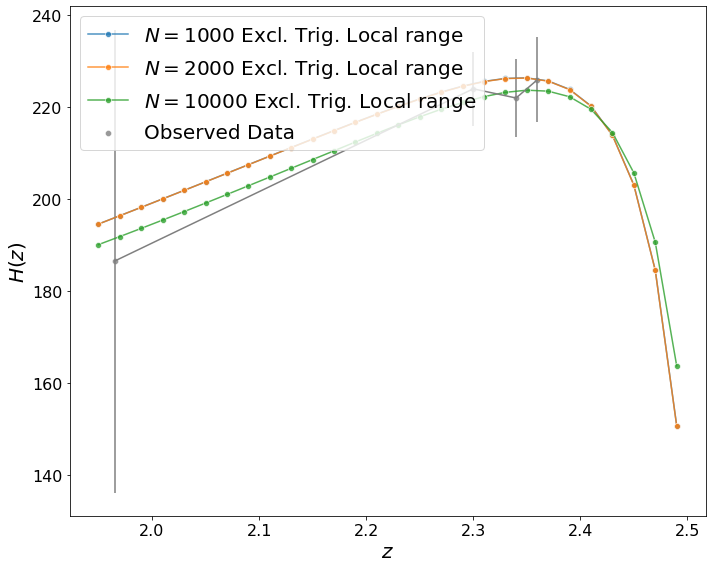

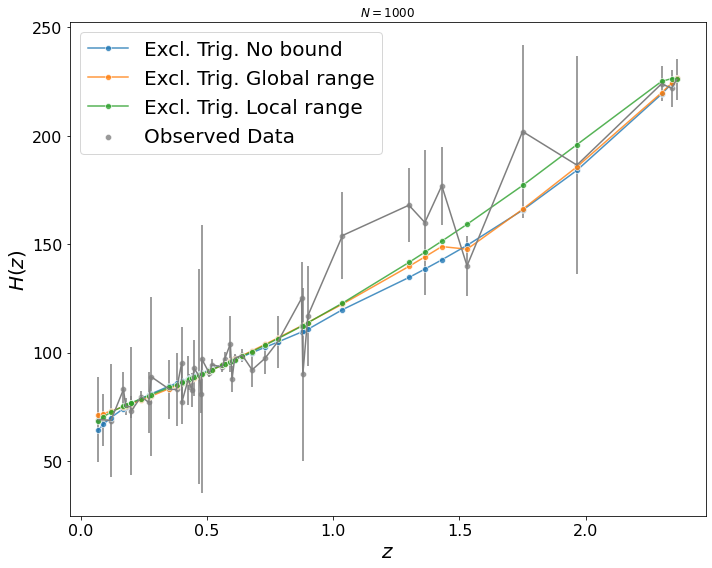

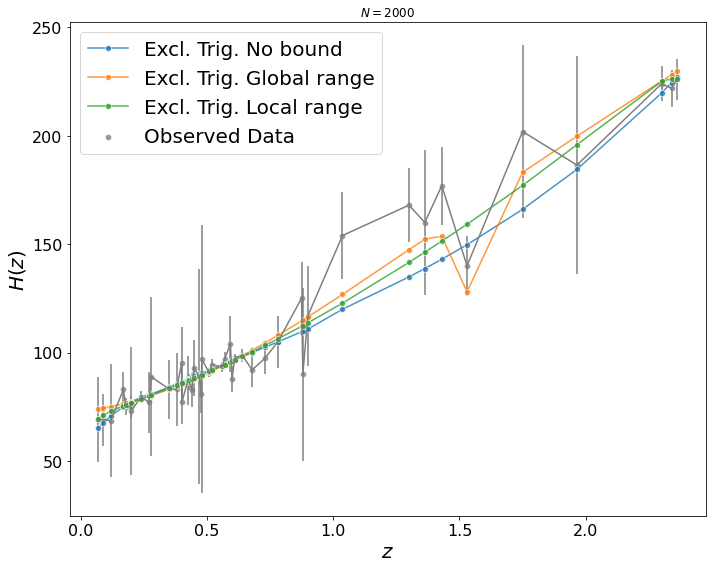

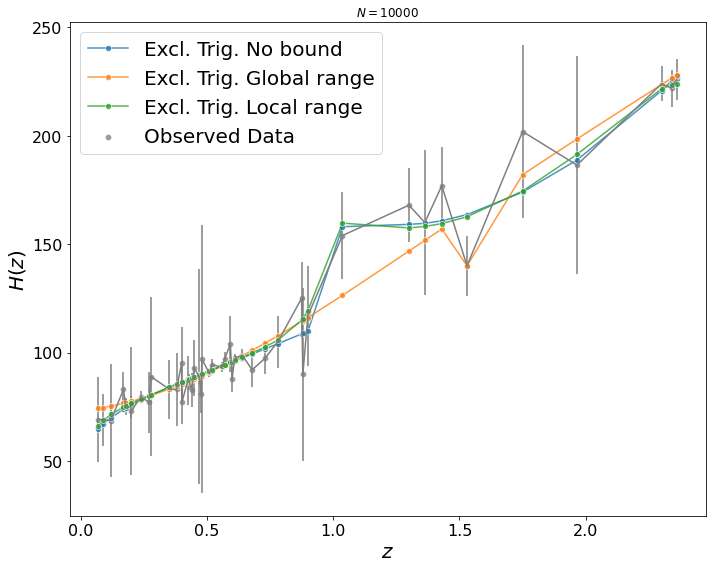

In [10]:
draw_functions('notrig', 'local', train_x, train_y, train_sigma)

Draw for grammar_nolog.txt case
------------------------------------------------

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:213: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(np.exp(x1))*(70.0+np.exp(x1-x1**x1+(np.tanh((x1/(np.tanh((1.52**(x1)**x1))**((((x1)*np.tanh(x1))))+np.exp(np.tanh((x1))**x1**np.sqrt(((983135.42)))))))))**5.99)


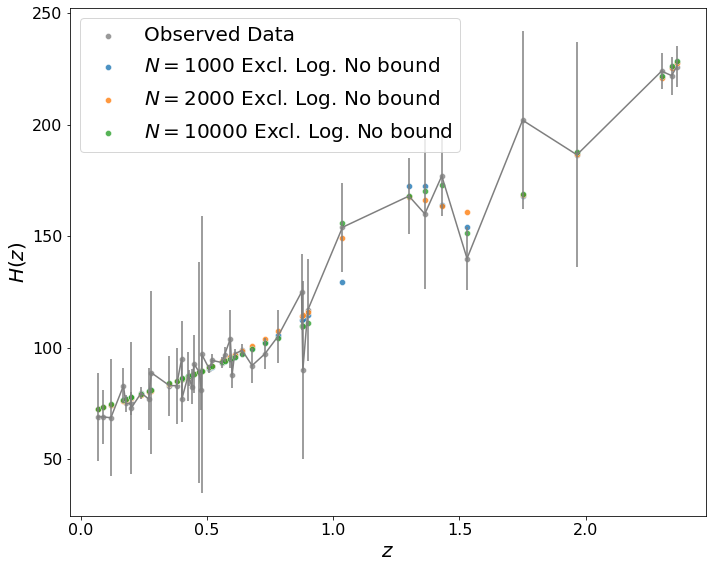

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:213: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(np.exp(x1))*(70.0+np.exp(x1-x1**x1+(np.tanh((x1/(np.tanh((1.52**(x1)**x1))**((((x1)*np.tanh(x1))))+np.exp(np.tanh((x1))**x1**np.sqrt(((983135.42)))))))))**5.99)


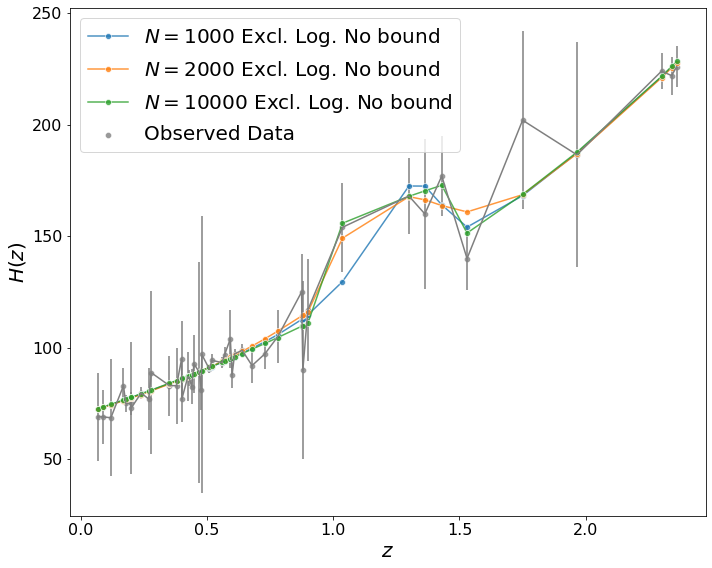

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:213: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(np.exp(x1))*(70.0+np.exp(x1-x1**x1+(np.tanh((x1/(np.tanh((1.52**(x1)**x1))**((((x1)*np.tanh(x1))))+np.exp(np.tanh((x1))**x1**np.sqrt(((983135.42)))))))))**5.99)


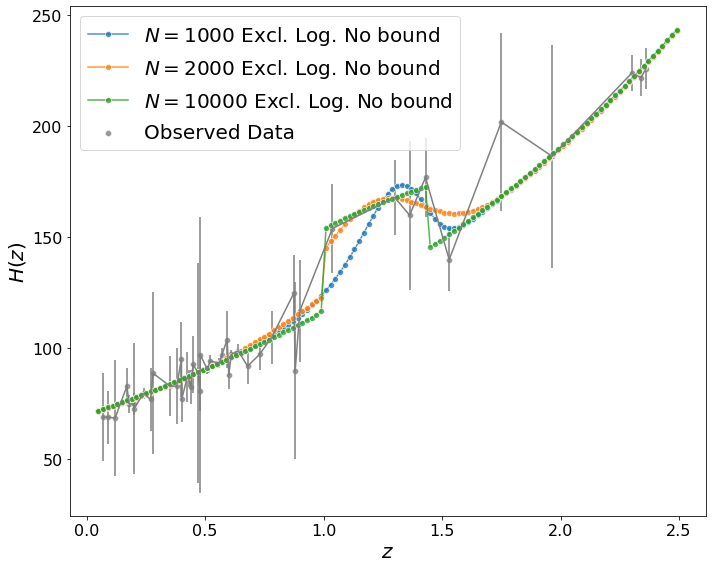

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:213: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(np.exp(x1))*(70.0+np.exp(x1-x1**x1+(np.tanh((x1/(np.tanh((1.52**(x1)**x1))**((((x1)*np.tanh(x1))))+np.exp(np.tanh((x1))**x1**np.sqrt(((983135.42)))))))))**5.99)


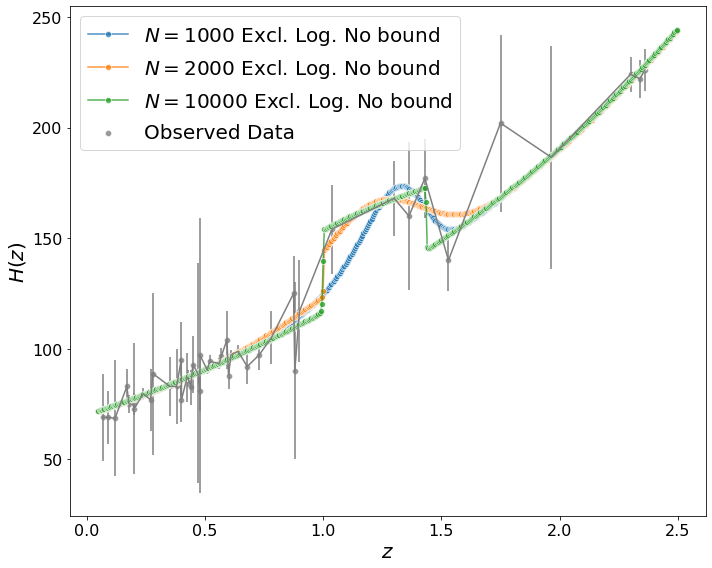

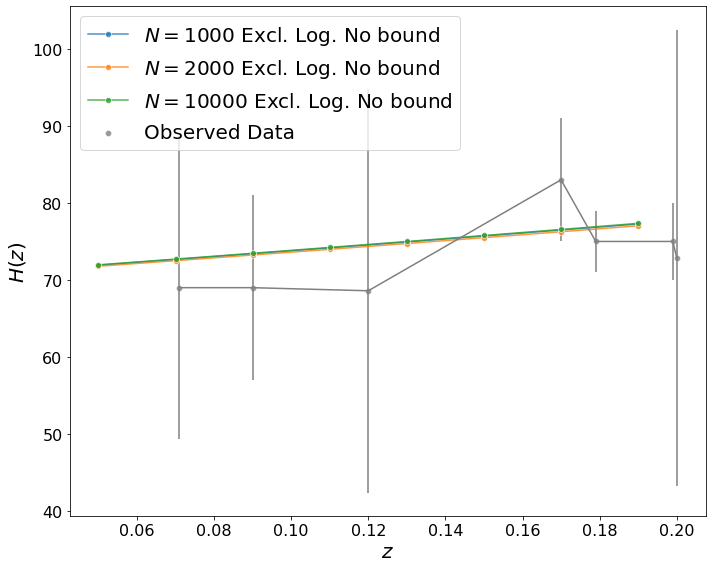

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:213: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(np.exp(x1))*(70.0+np.exp(x1-x1**x1+(np.tanh((x1/(np.tanh((1.52**(x1)**x1))**((((x1)*np.tanh(x1))))+np.exp(np.tanh((x1))**x1**np.sqrt(((983135.42)))))))))**5.99)


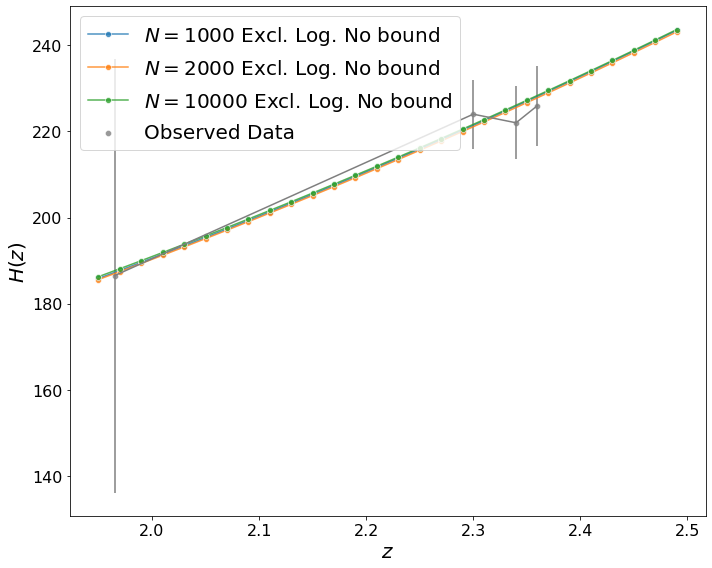

NameError: name 'sqrt' is not defined

In [11]:
draw_functions('nolog', 'nobound', train_x, train_y, train_sigma)

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in exp
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmo

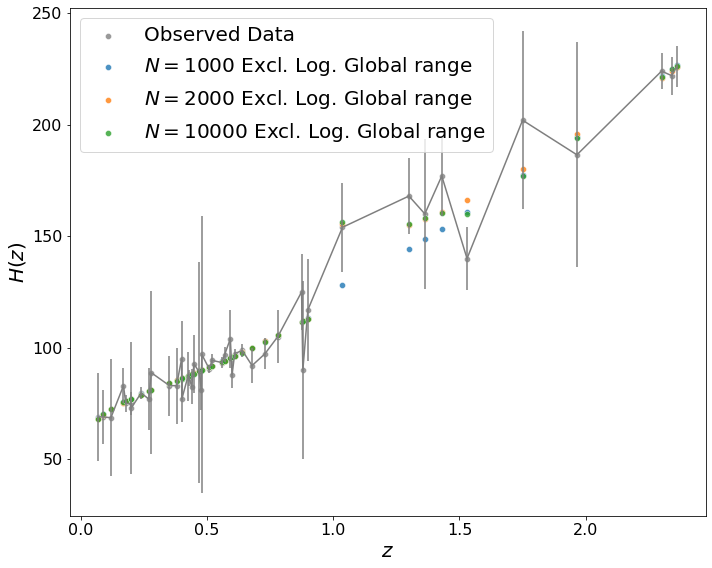

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in exp
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmo

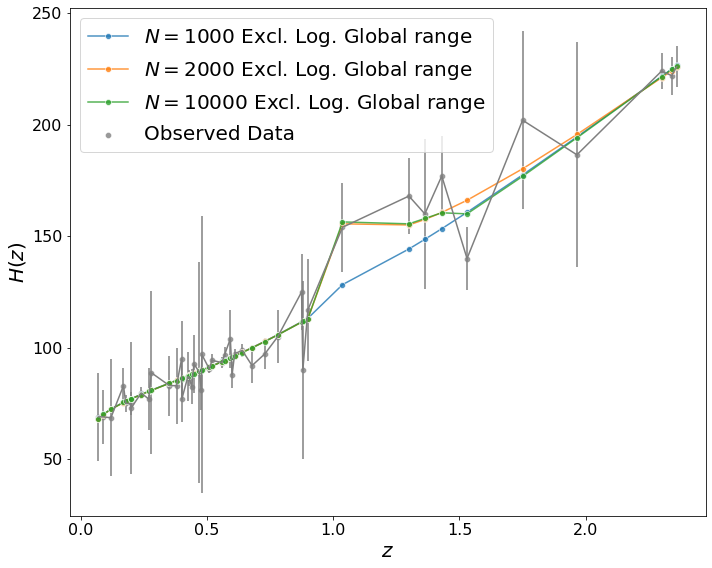

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in exp
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmo

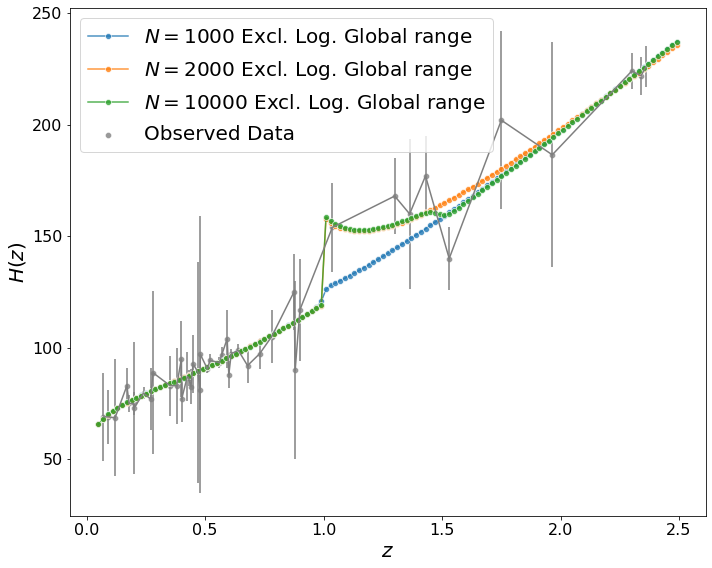

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in exp
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmo

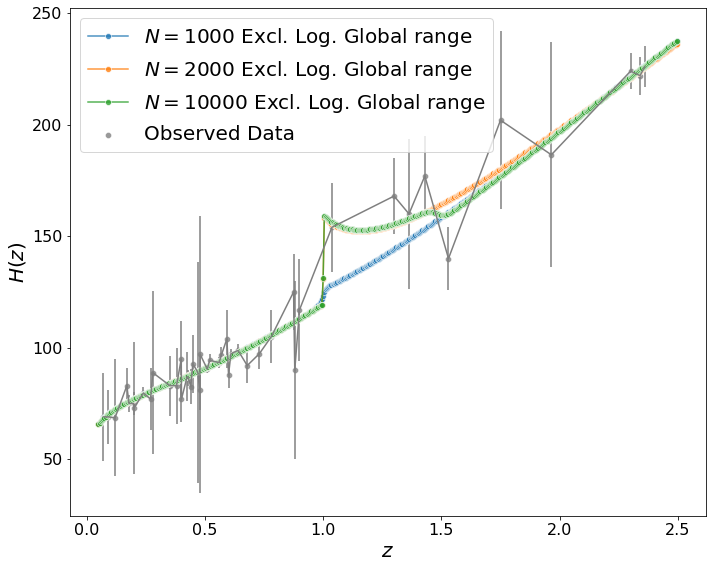

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in exp
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))


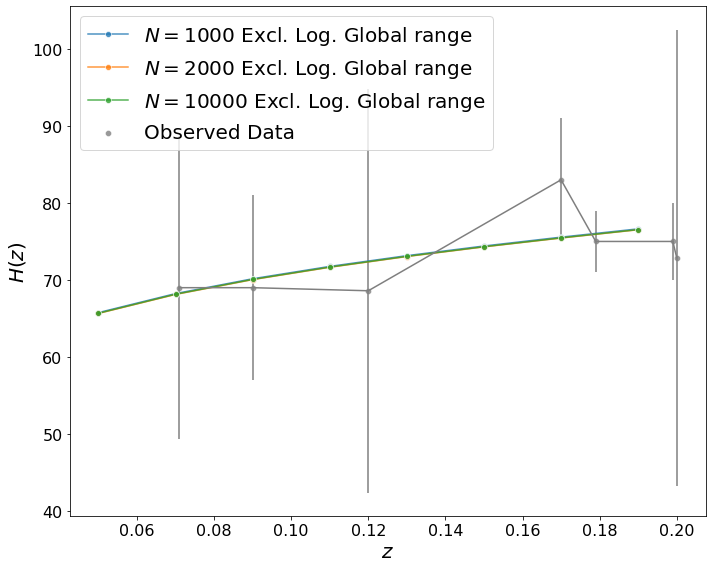

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in exp
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmo

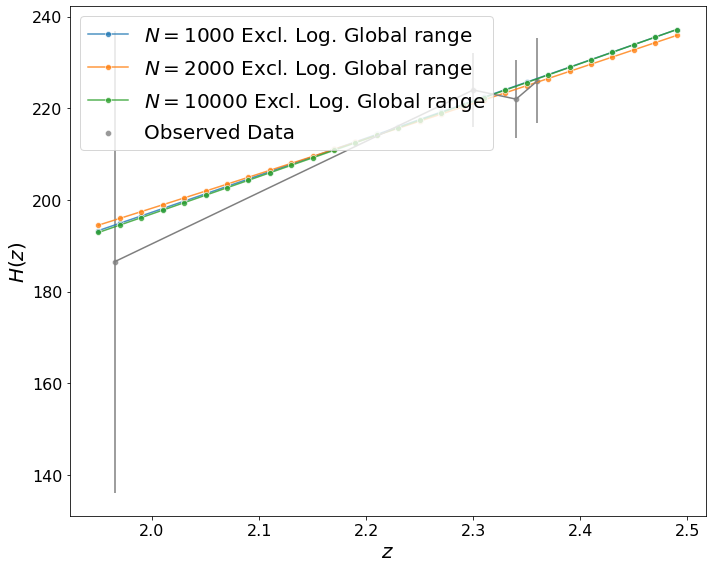

NameError: name 'sqrt' is not defined

In [12]:
draw_functions('nolog', 'global', train_x, train_y, train_sigma)

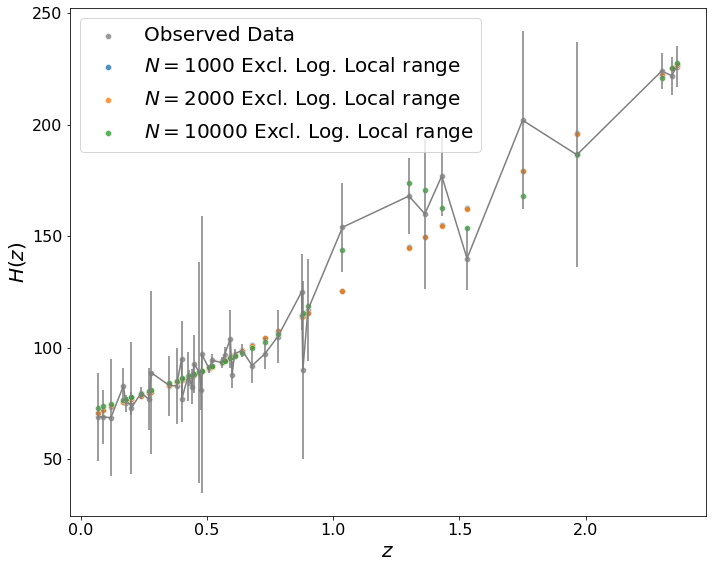

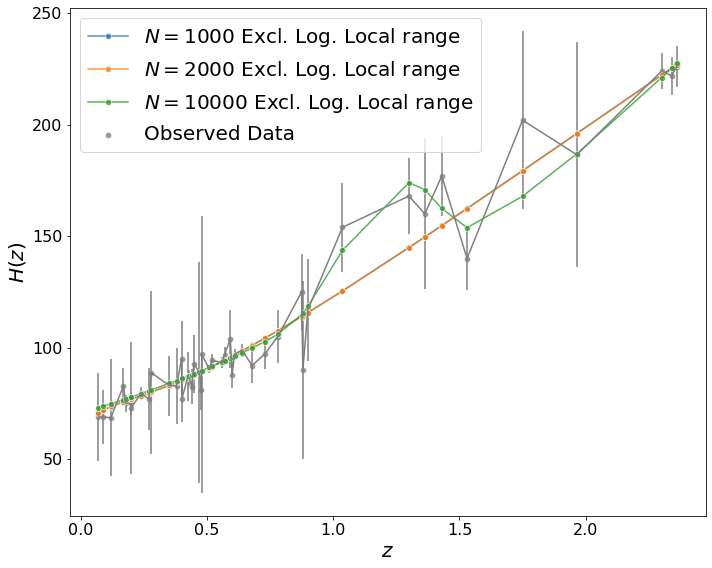

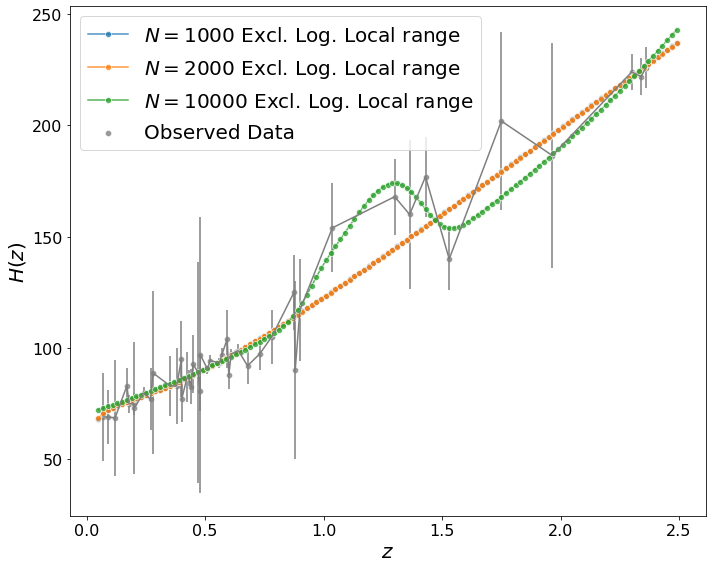

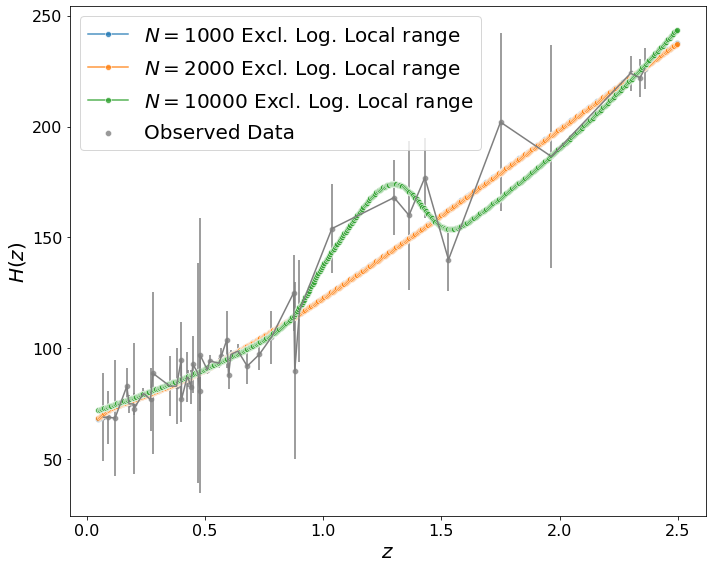

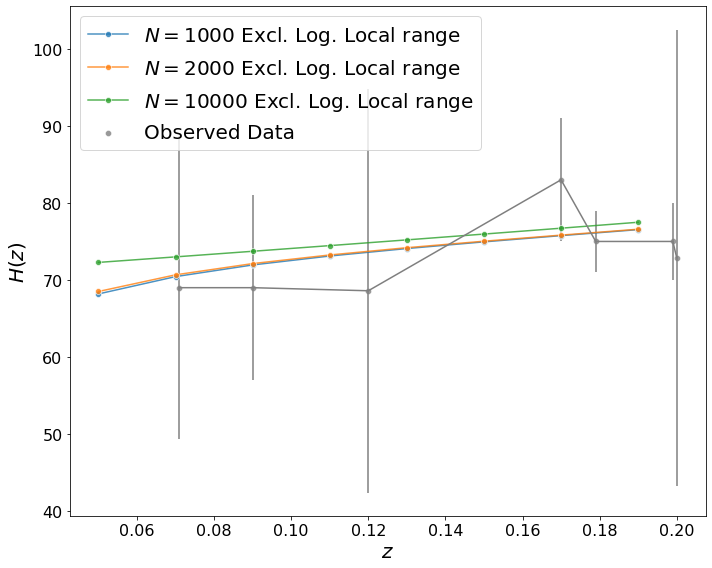

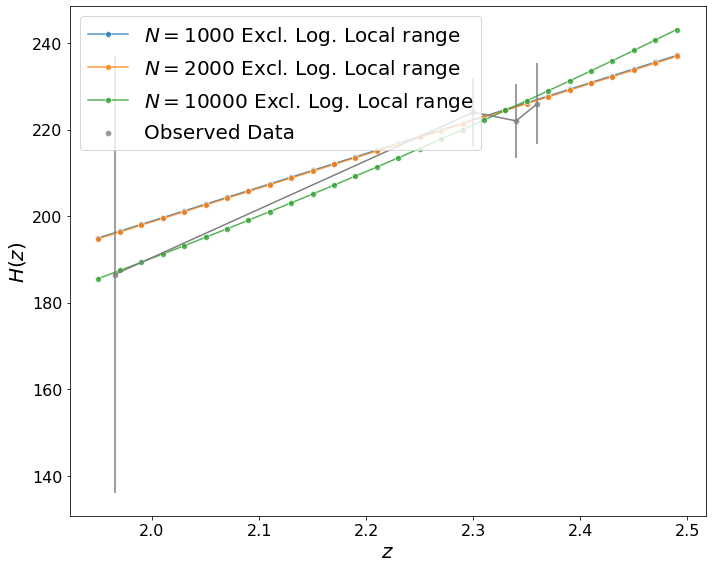

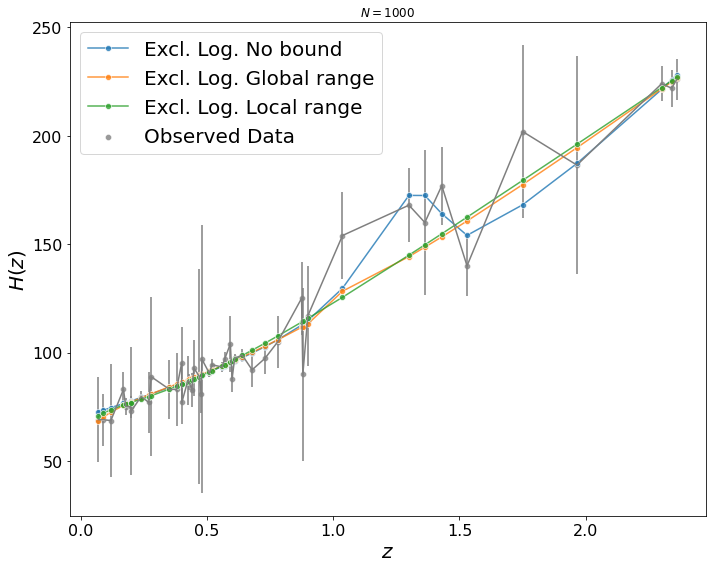

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:213: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(np.exp(x1))*(70.0+np.exp(x1-x1**x1+(np.tanh((x1/(np.tanh((1.52**(x1)**x1))**((((x1)*np.tanh(x1))))+np.exp(np.tanh((x1))**x1**np.sqrt(((983135.42)))))))))**5.99)
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:219: RuntimeWarning: overflow encountered in exp
  v = np.sqrt(9960.03*np.sqrt(np.sqrt(x1)**7.30+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(np.abs(np.exp(37384.91))))-np.tanh(x1**94342.1)*np.sqrt(np.sqrt(np.sqrt((4.75)))+np.tanh((85.8/(np.exp(1.6))+(x1-np.exp(0.5))))))))
C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\ge

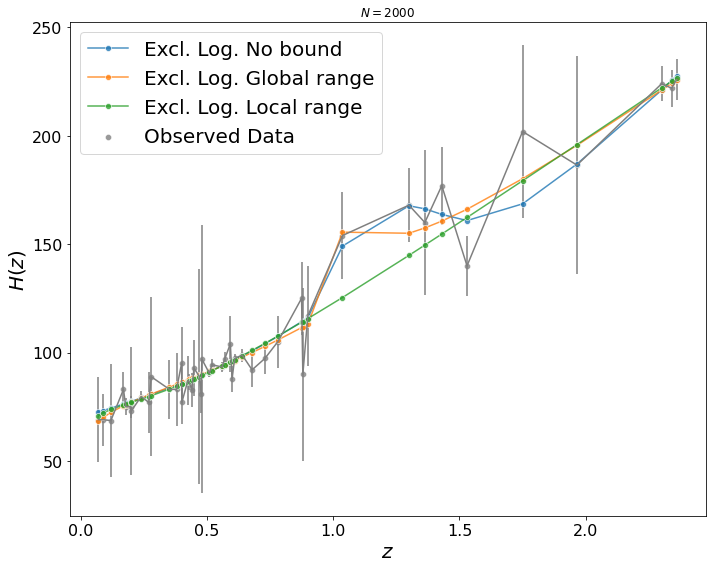

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:238: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9968.52*np.sqrt(np.sqrt(x1)**7.40+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(((np.sqrt(np.abs(62.43))))))-np.tanh(x1**52612.1)*np.sqrt(np.sqrt(np.sqrt((4.98)))+np.tanh(((np.sqrt((59.5/15.94+(np.tanh(x1))*36.5))))-((x1))**np.exp(x1))))))


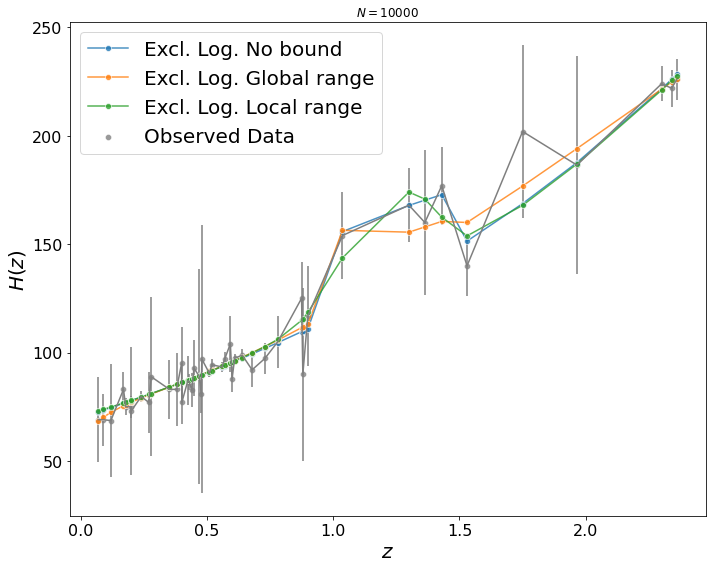

In [4]:
draw_functions('nolog', 'local', train_x, train_y, train_sigma)

Draw for grammar_power.txt case
------------------------------------------------

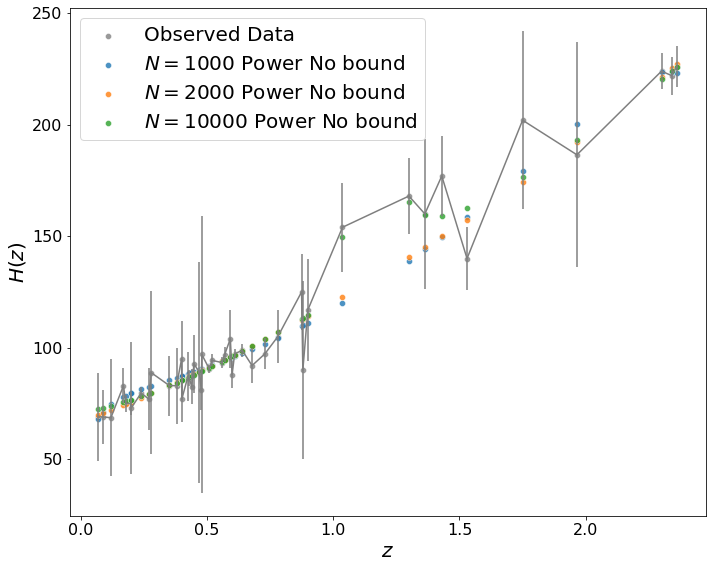

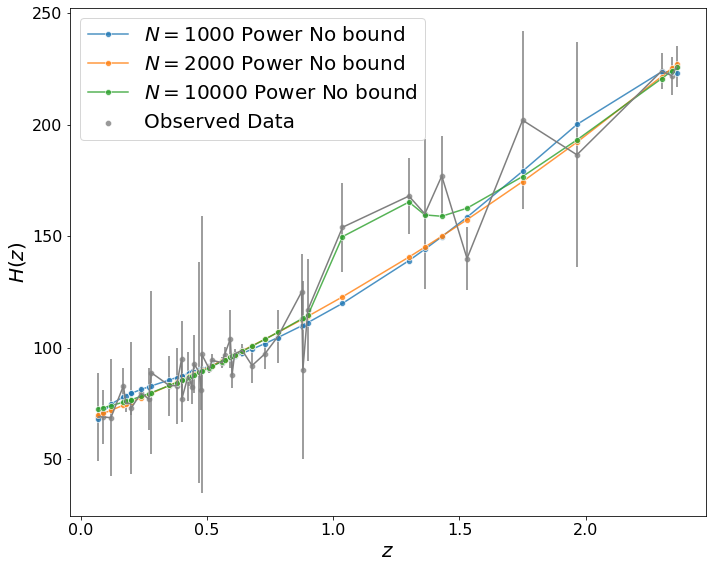

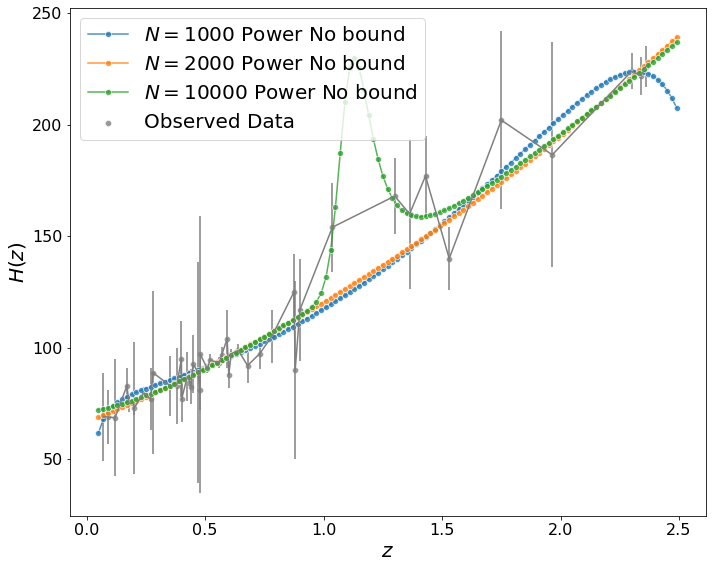

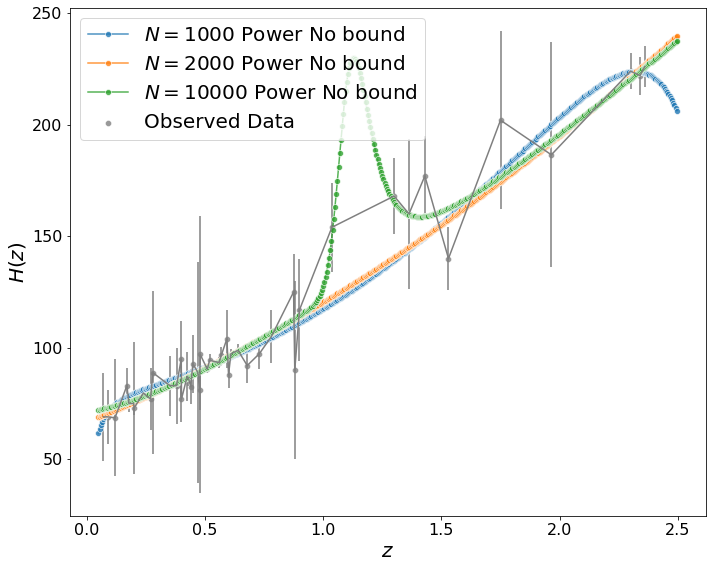

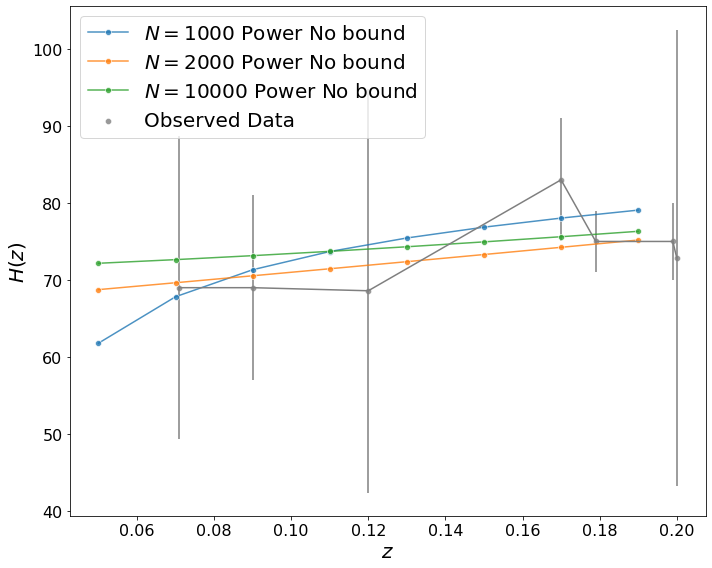

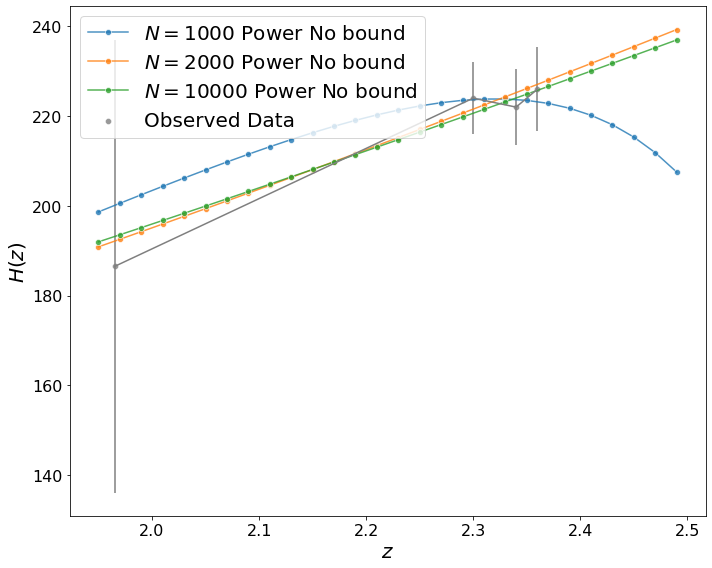

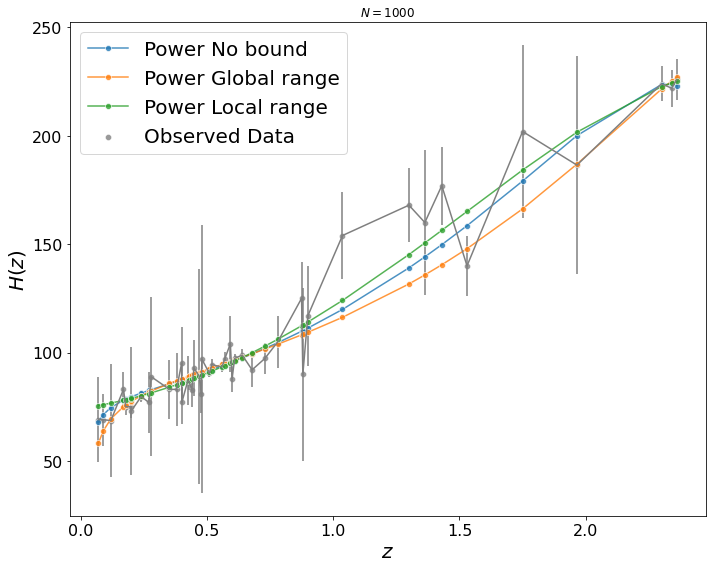

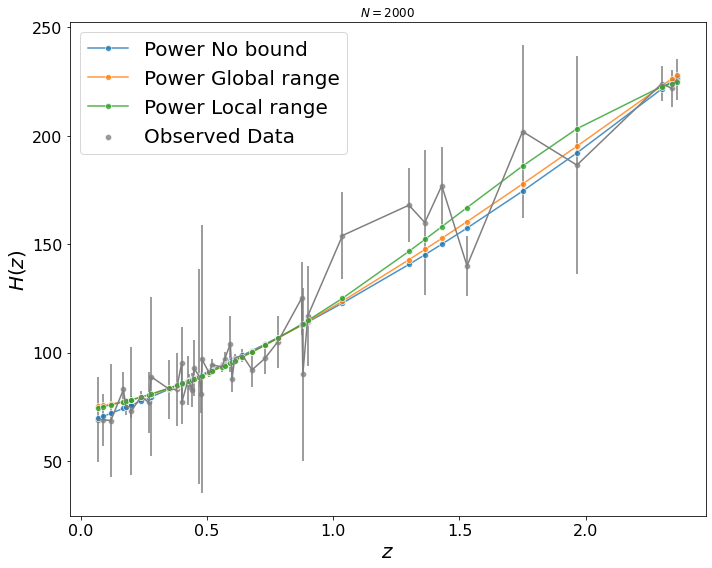

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


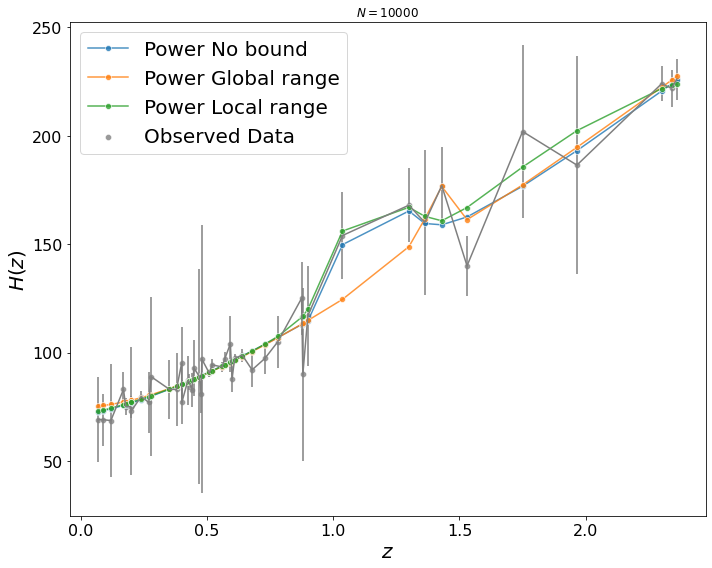

In [5]:
draw_functions('power', 'nobound', train_x, train_y, train_sigma)

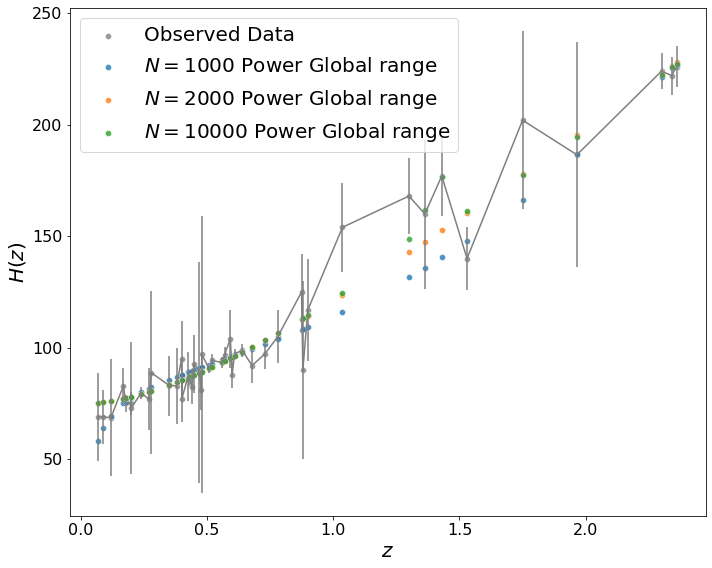

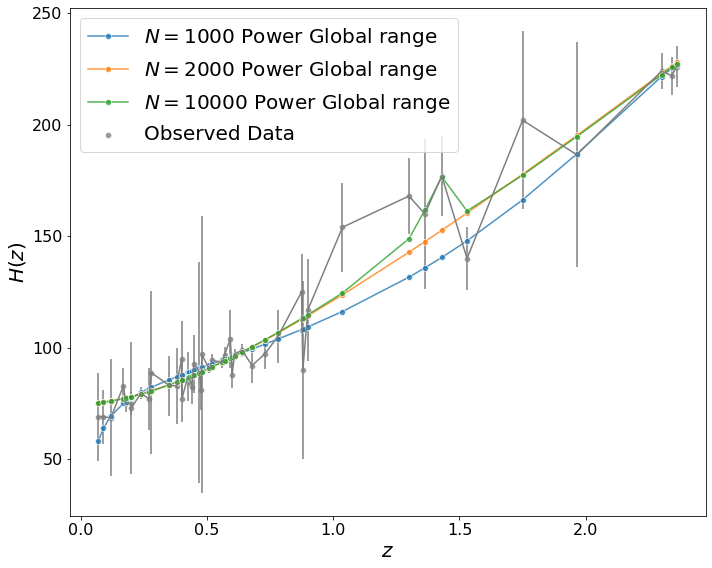

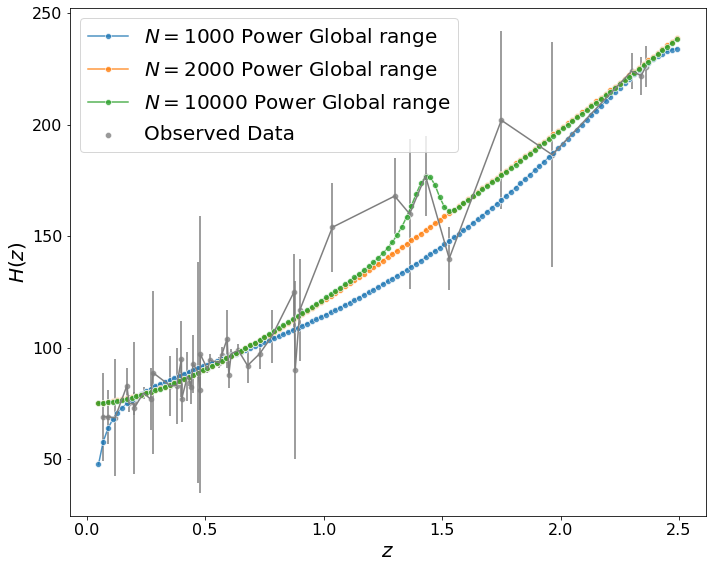

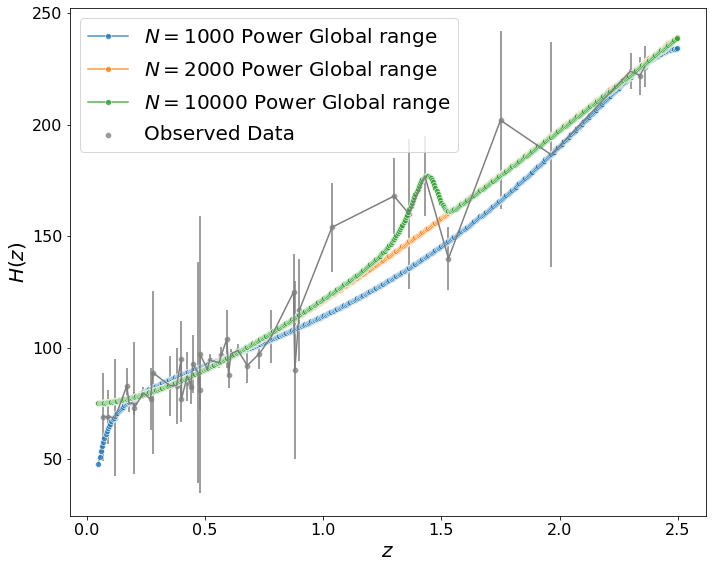

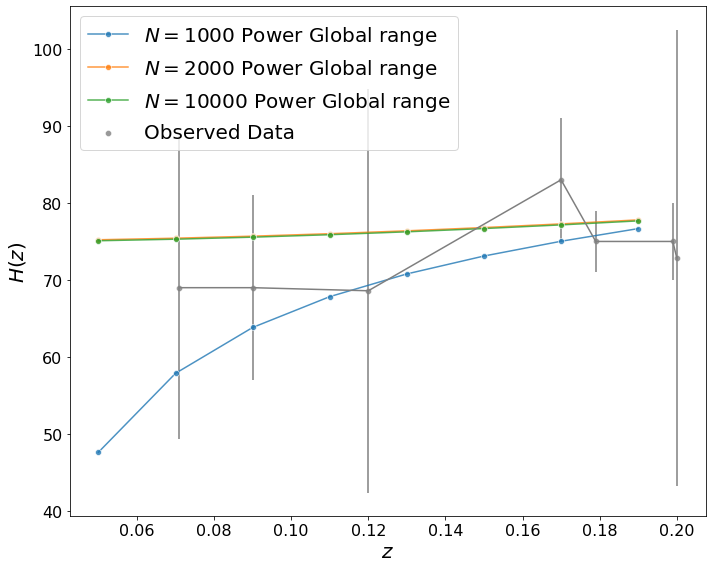

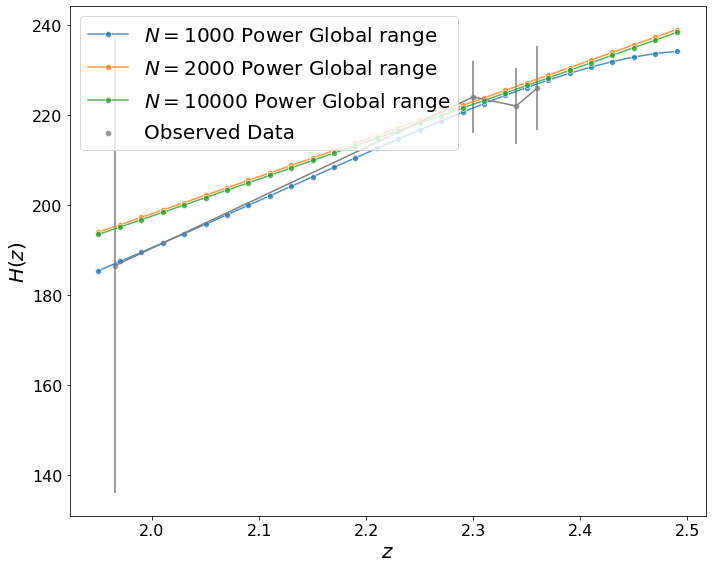

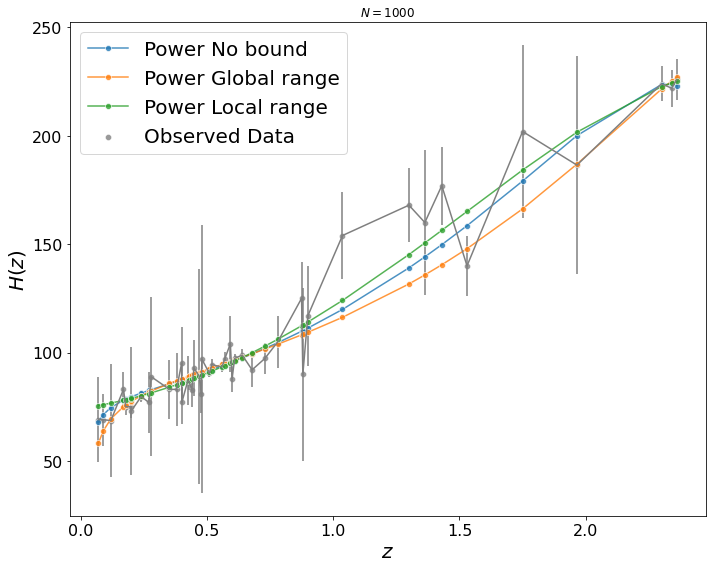

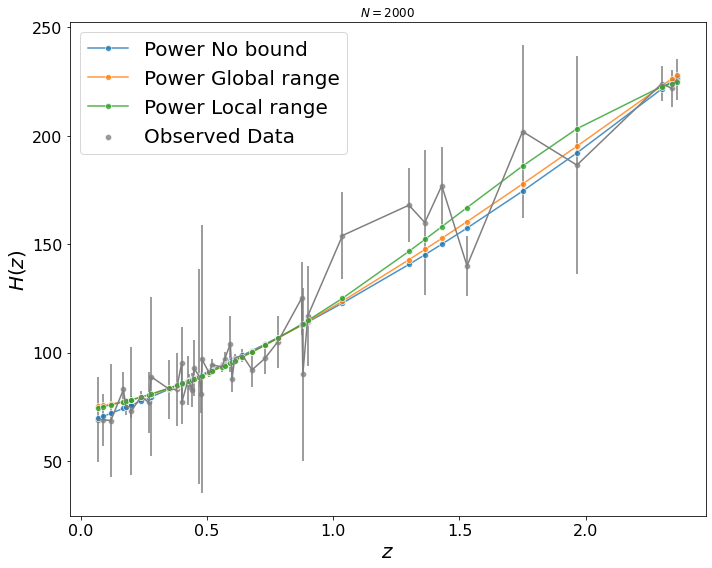

C:\Users\hwlee\OneDrive - 인제대학교\Projects\Physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


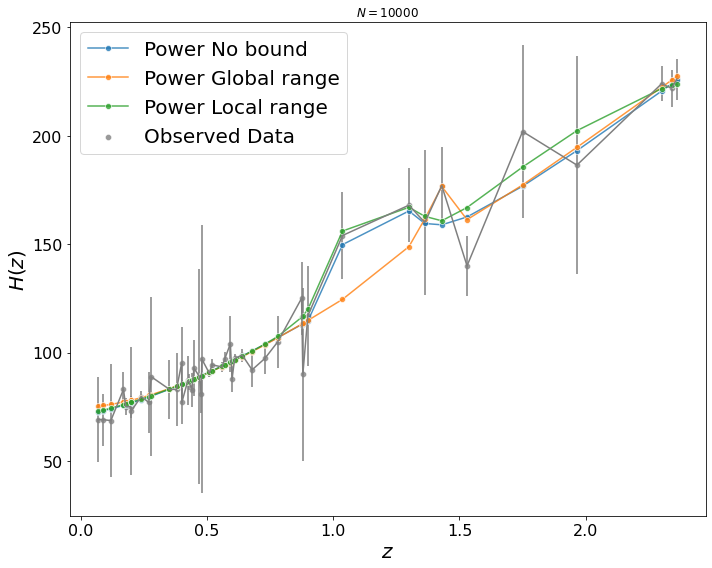

In [6]:
draw_functions('power', 'global', train_x, train_y, train_sigma)

C:\Users\hwlee\physics_local\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


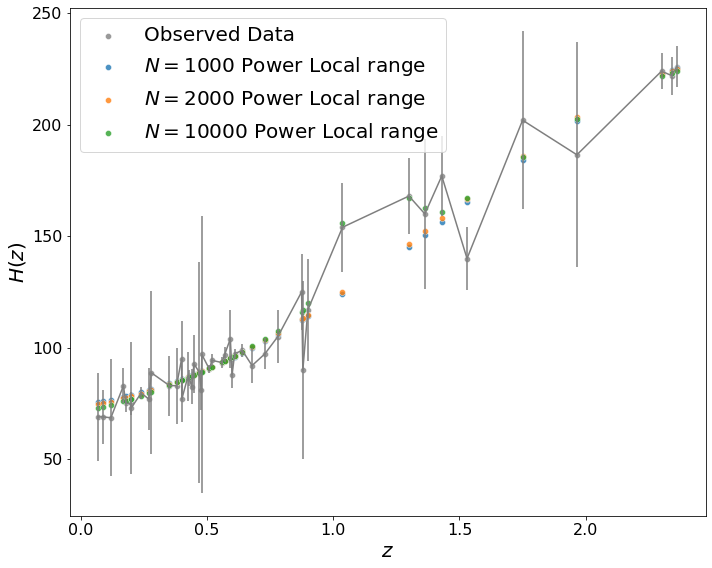

C:\Users\hwlee\physics_local\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


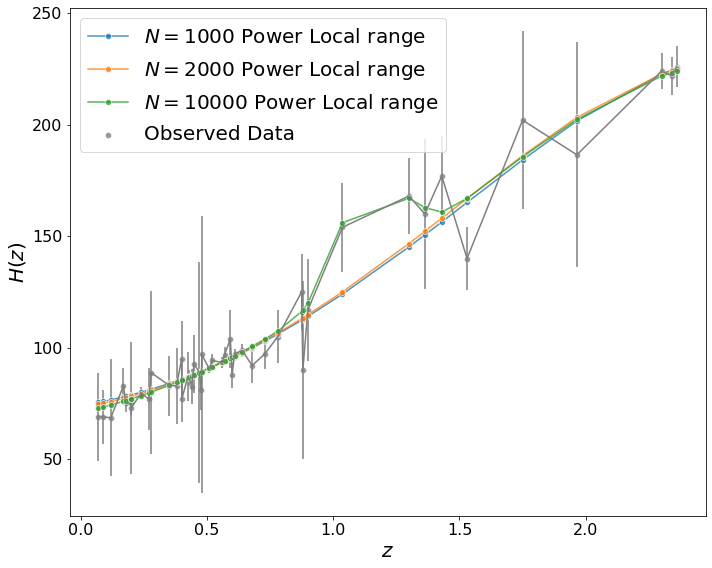

C:\Users\hwlee\physics_local\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


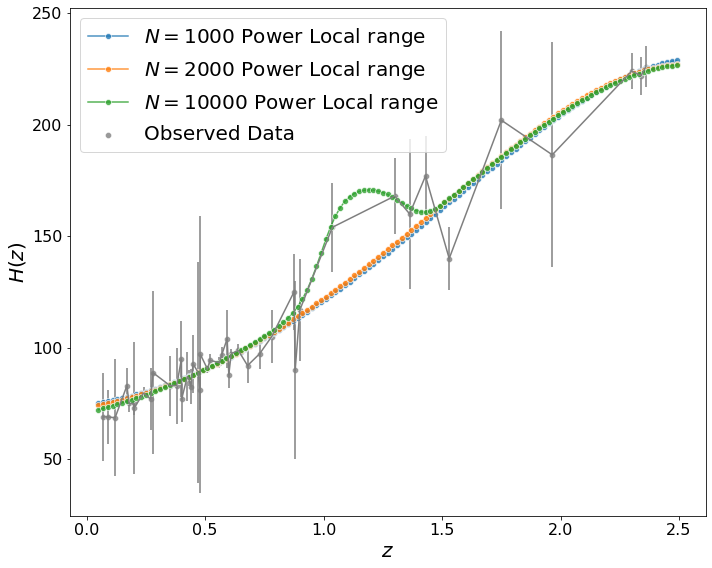

C:\Users\hwlee\physics_local\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


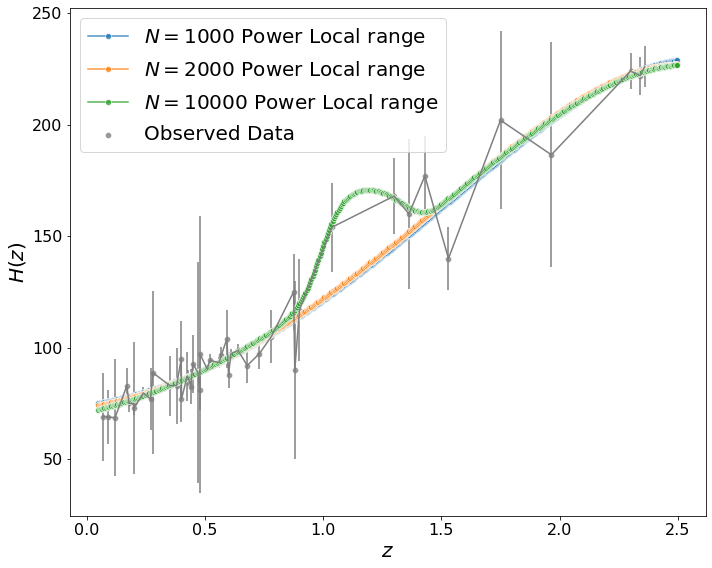

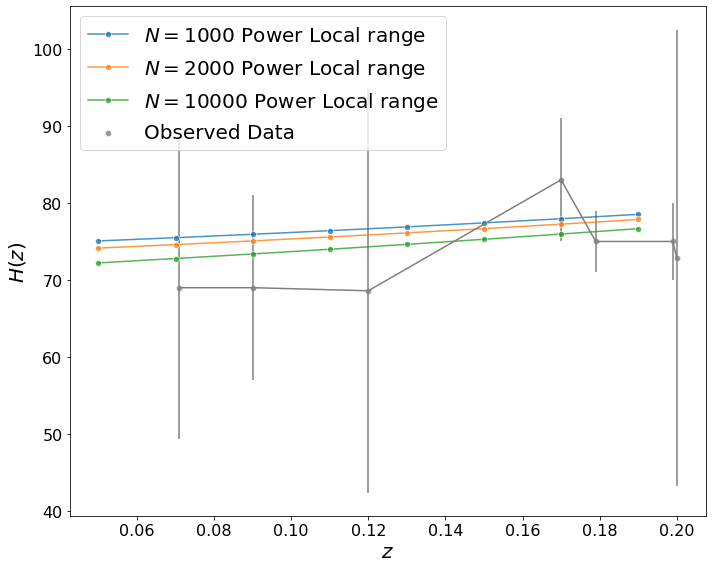

C:\Users\hwlee\physics_local\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


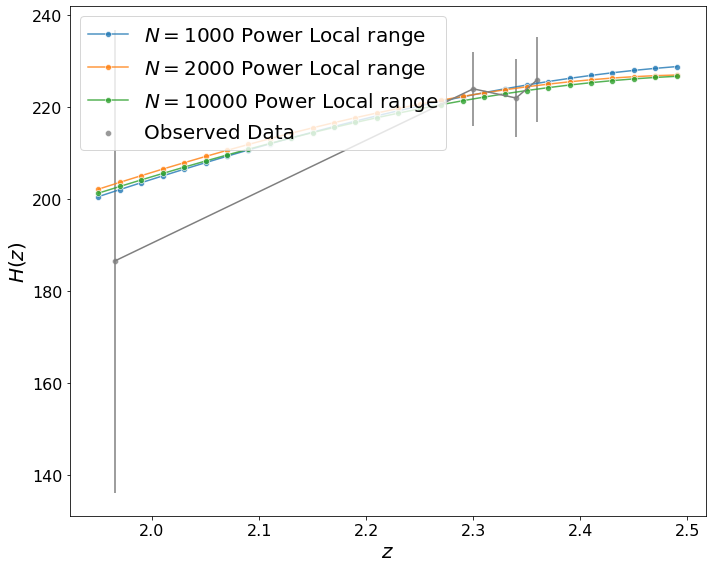

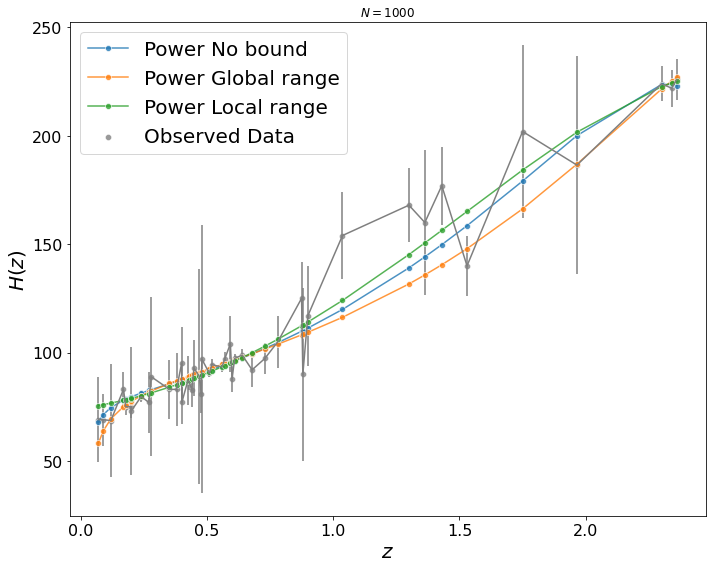

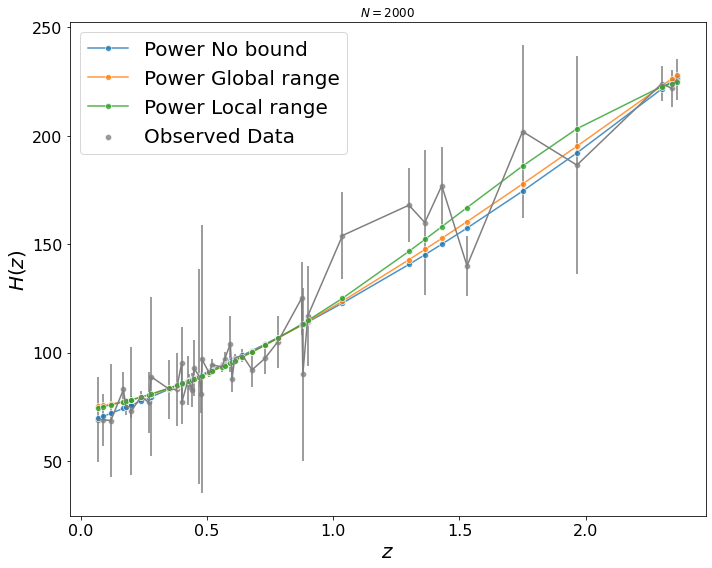

C:\Users\hwlee\physics_local\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes\python\genetic_algorithm220505.py:326: RuntimeWarning: overflow encountered in double_scalars
  v = udf2(x1)*(26.94)+udf2(((8.42+x1)))-udf2(x1)**2.4+x1*8.20+45.69/(udf1(udf1(x1)**(x1-(udf2((4.7)))))+x1**udf2(x1)**udf3(x1))


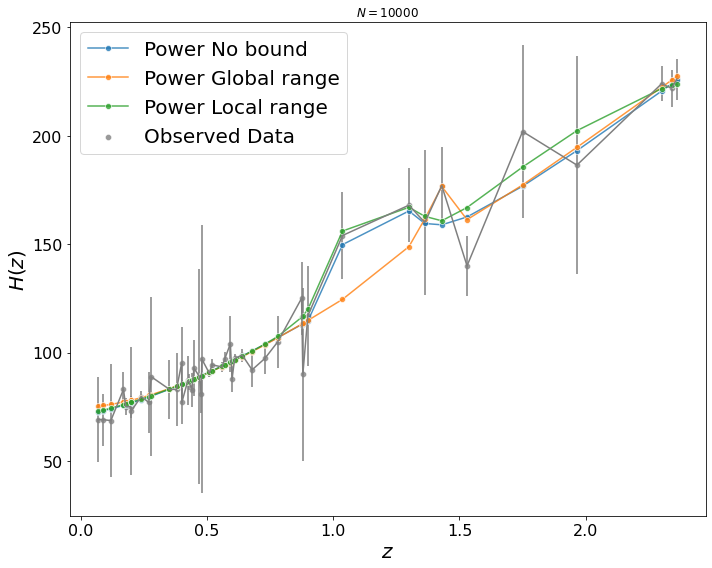

In [5]:
draw_functions('power', 'local', train_x, train_y, train_sigma)

comparison between grammars
---------------------------------------------

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


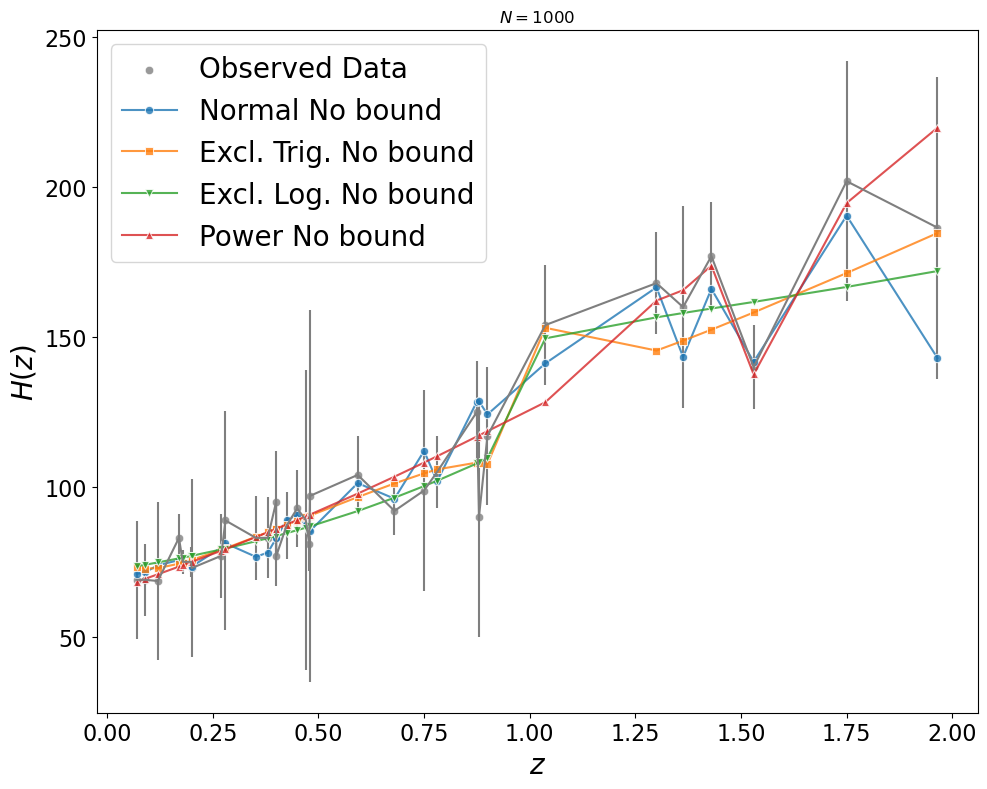

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


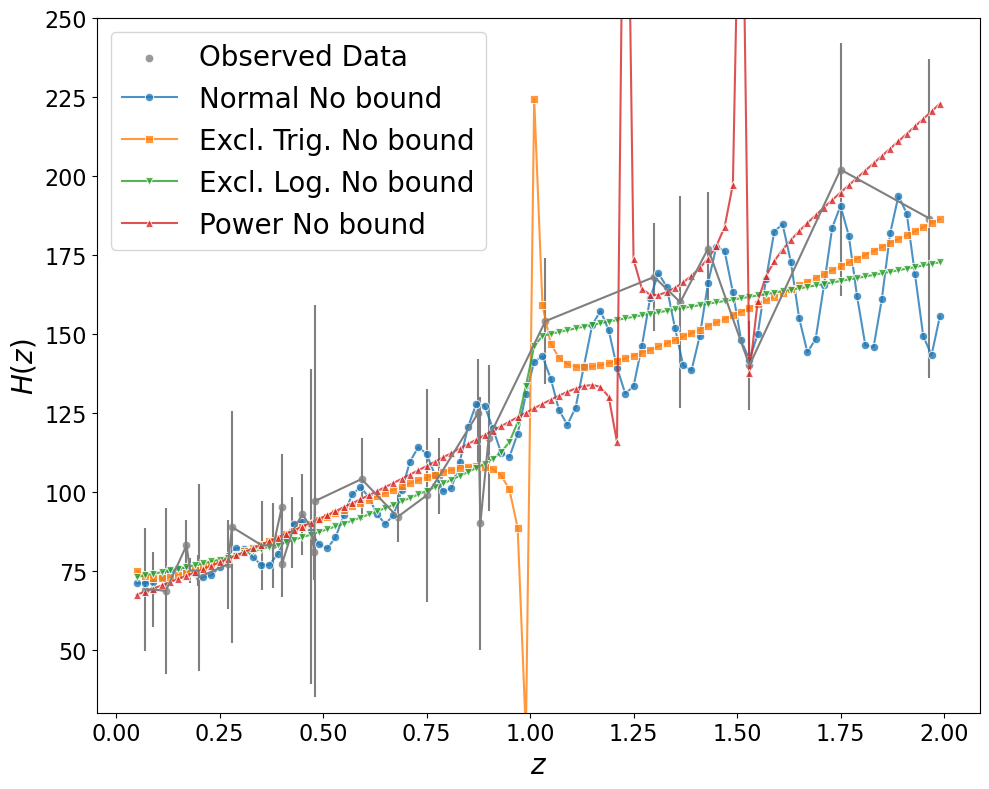

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


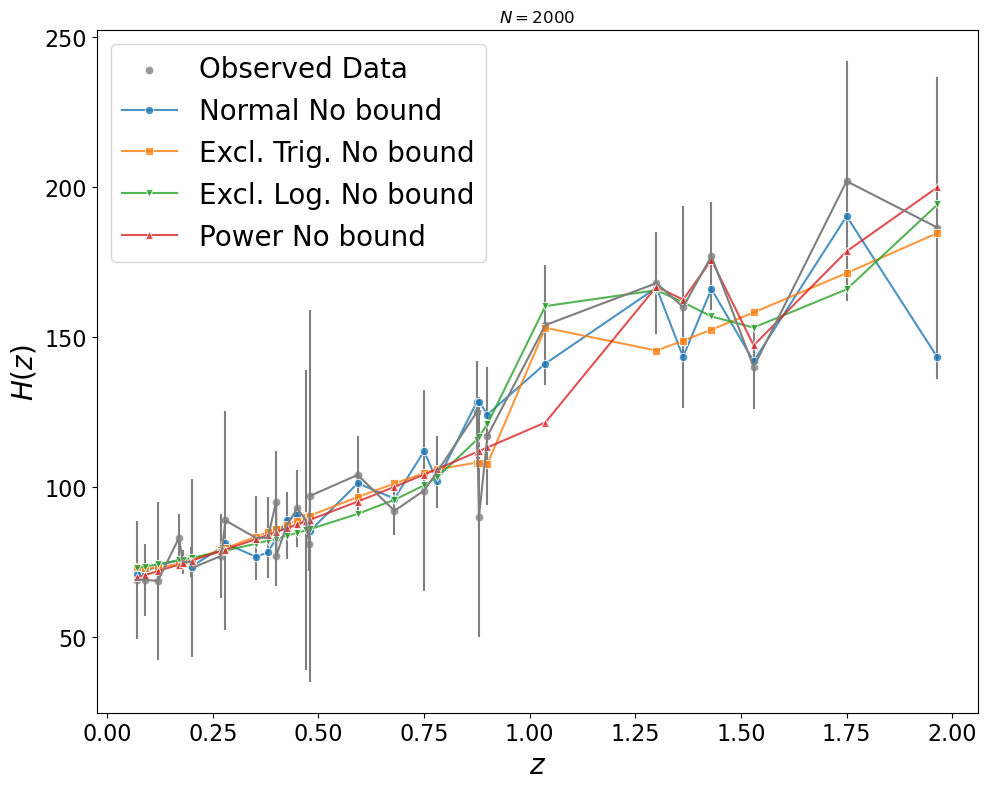

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


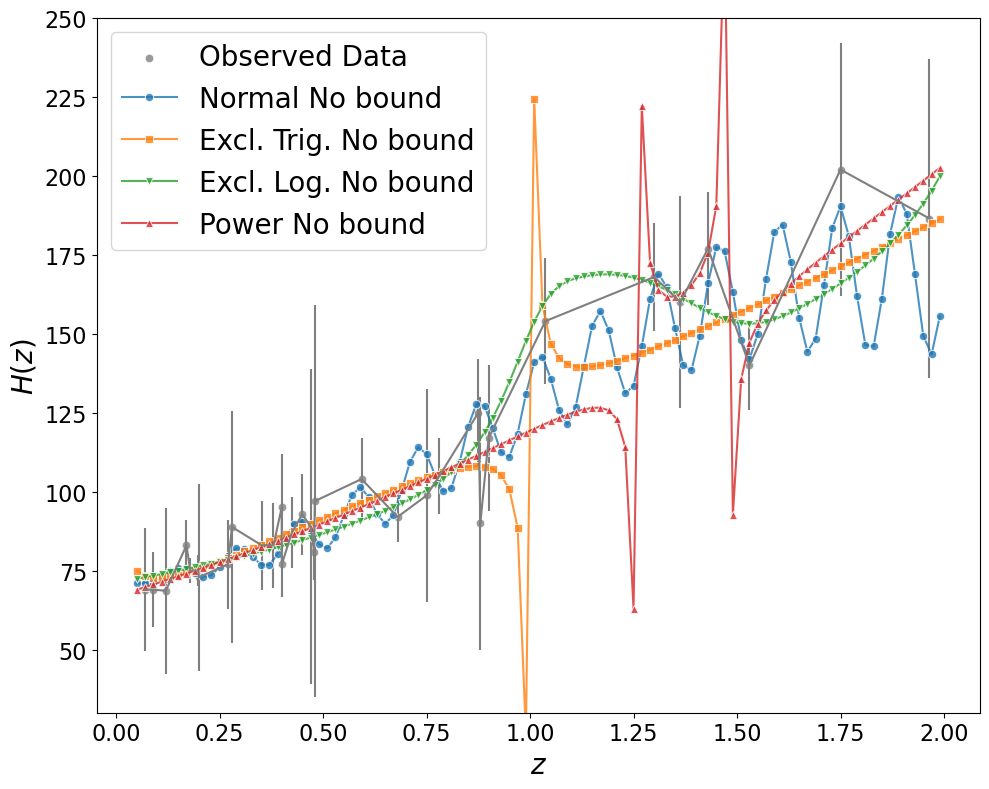

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:284: RuntimeWarning: overflow encountered in double_scalars
  v = 70.5+((72.80))**np.tanh(x1)+(x1+x1)*8.21+np.tanh(x1**((12.9)))*47.01/x1**x1**((((x1)**np.abs(np.sqrt(np.sqrt(x1**np.exp((x1)))))**np.sqrt(((6.78)**np.sqrt(np.sqrt(x1)))))))+(np.abs((((x1)))))*(np.exp(x1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


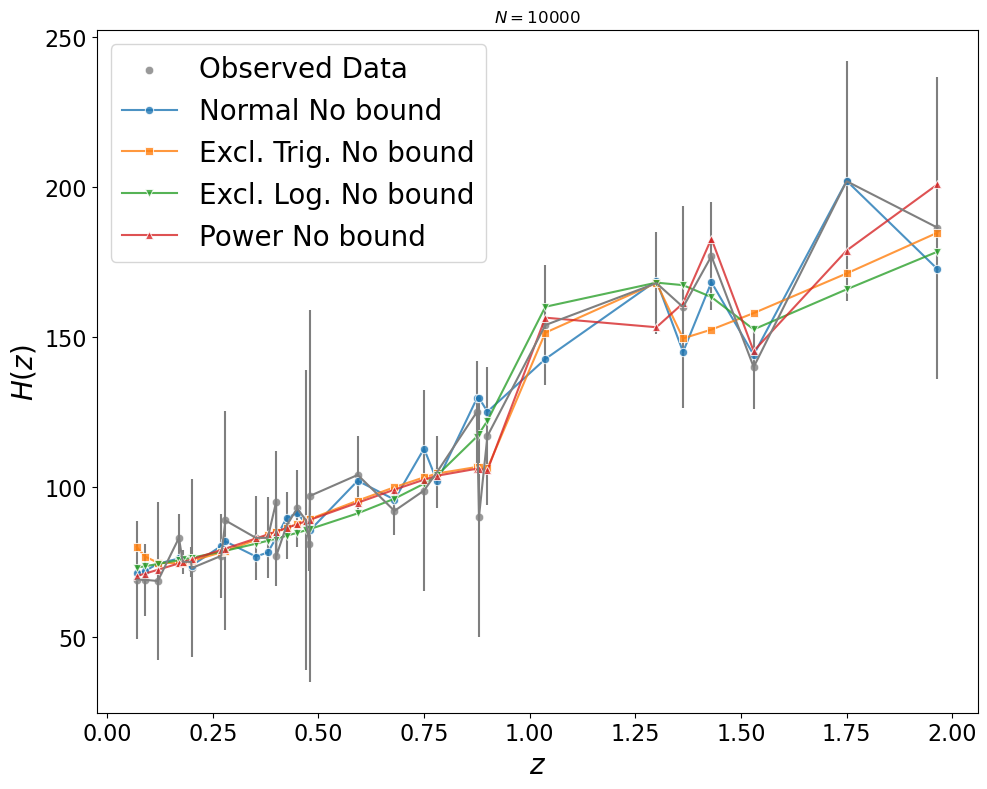

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:83: RuntimeWarning: invalid value encountered in sqrt
  v = 98.3**np.sqrt((np.cos(np.sqrt(7.1/np.exp(np.exp(x1))))))+69.7+np.cos((np.abs(x1)*(043.11)))*x1*(((9.76))+np.log(91.21))-np.cos(((21.95)))/np.cos(np.abs(np.sqrt(x1)))**x1
C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:284: RuntimeWarning: overflow encountered in double_scalars
  v = 70.5+((72.80))**np.tanh(x1)+(x1+x1)*8.21+np.tanh(x1**((12.9)))*47.01/x1**x1**((((x1)**np.abs(np.sqrt(np.sqrt(x1**np.exp((x1)))))**np.sqrt(((6.78)**np.sqrt(np.sqrt(x1)))))))+(np.abs((((x1)))))*(np.exp(x1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


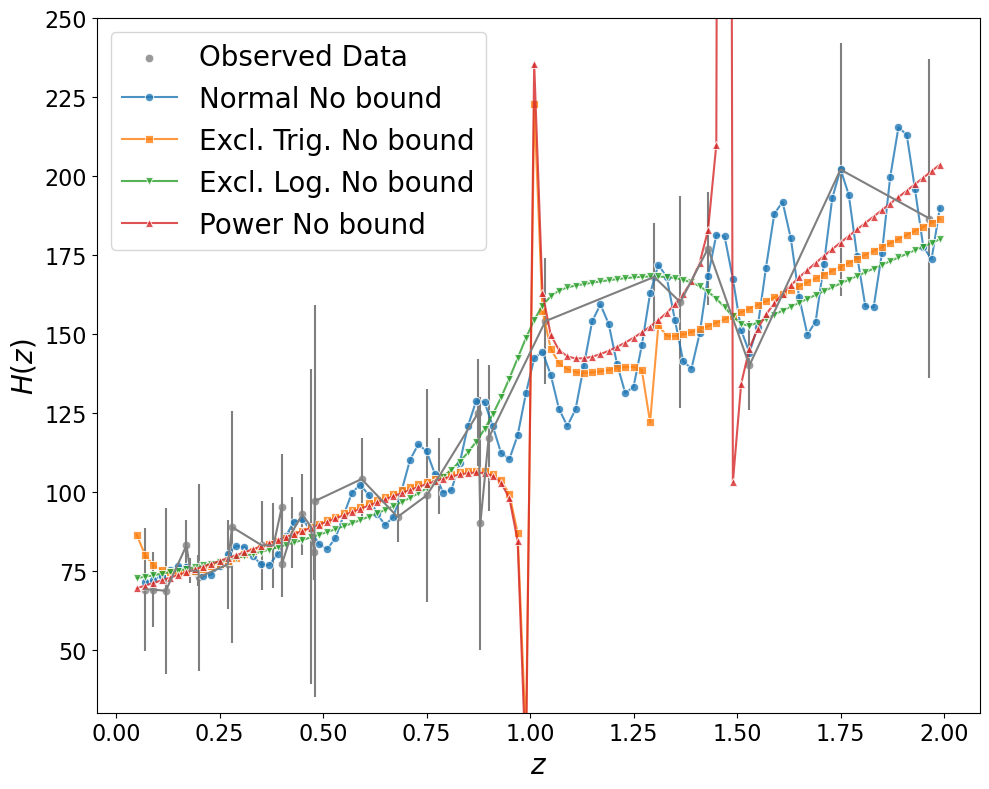

In [24]:
N_number = len(ga_functions['norm']['N'])
for idx in range(N_number):
    draw_comparison_grammar('nobound', idx, train_x, train_y, train_sigma)
#draw_comparison_grammar('nobound', 1, train_x, train_y, train_sigma)
#draw_comparison_grammar('nobound', 2, train_x, train_y, train_sigma)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


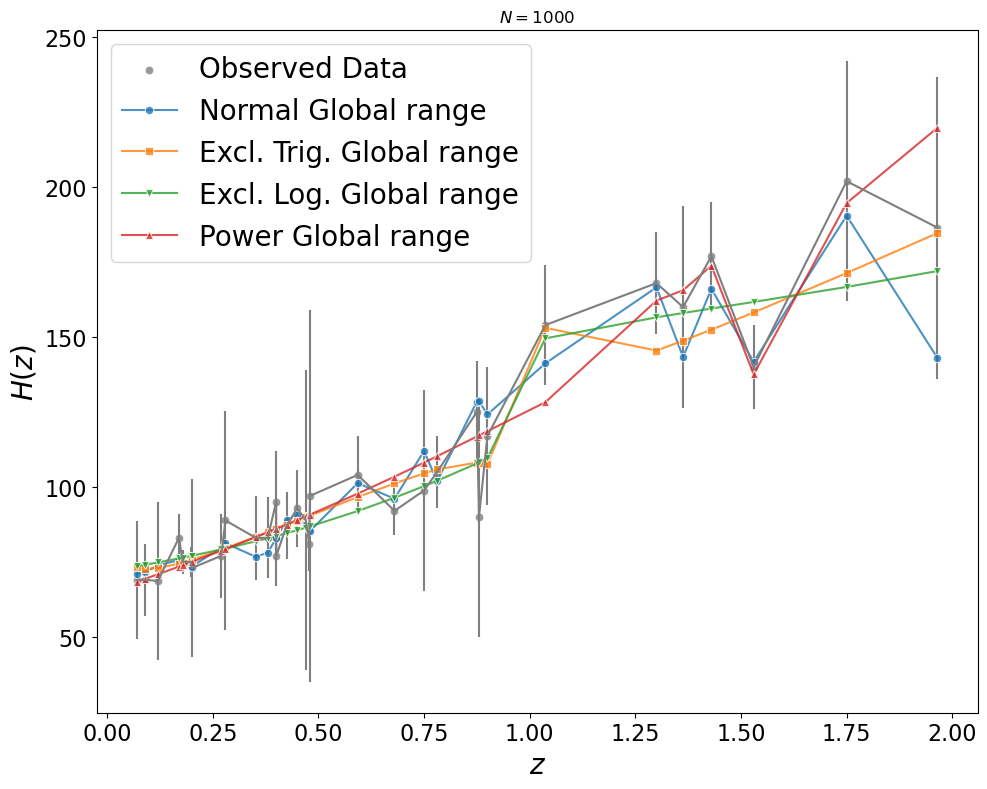

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


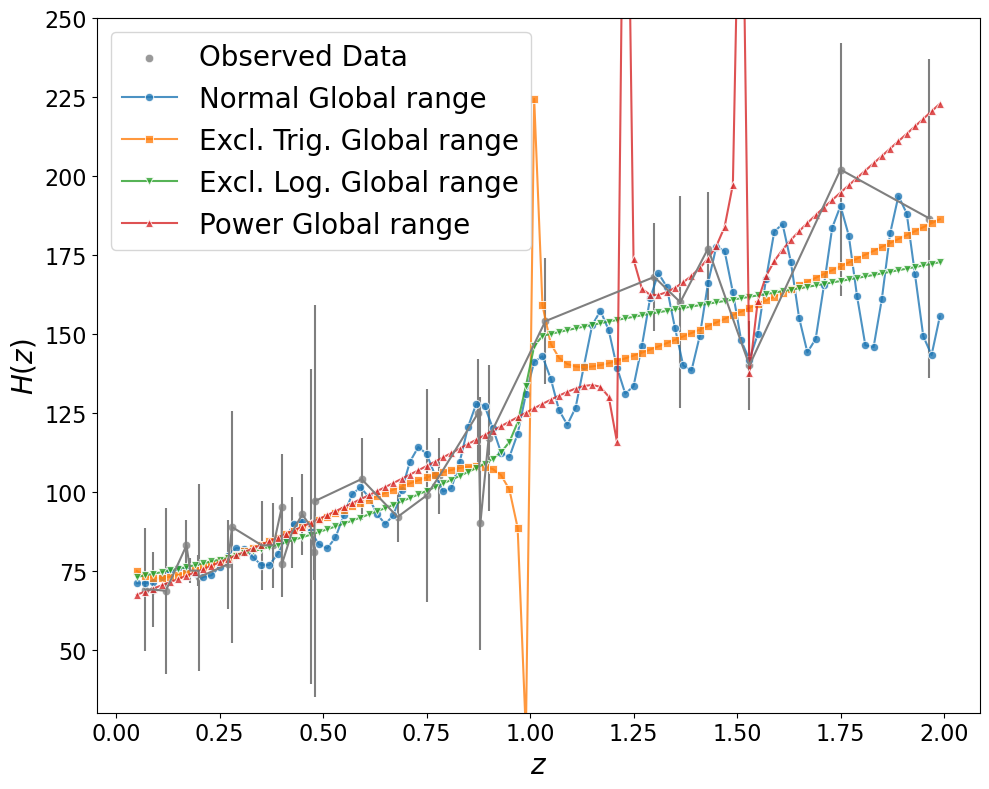

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


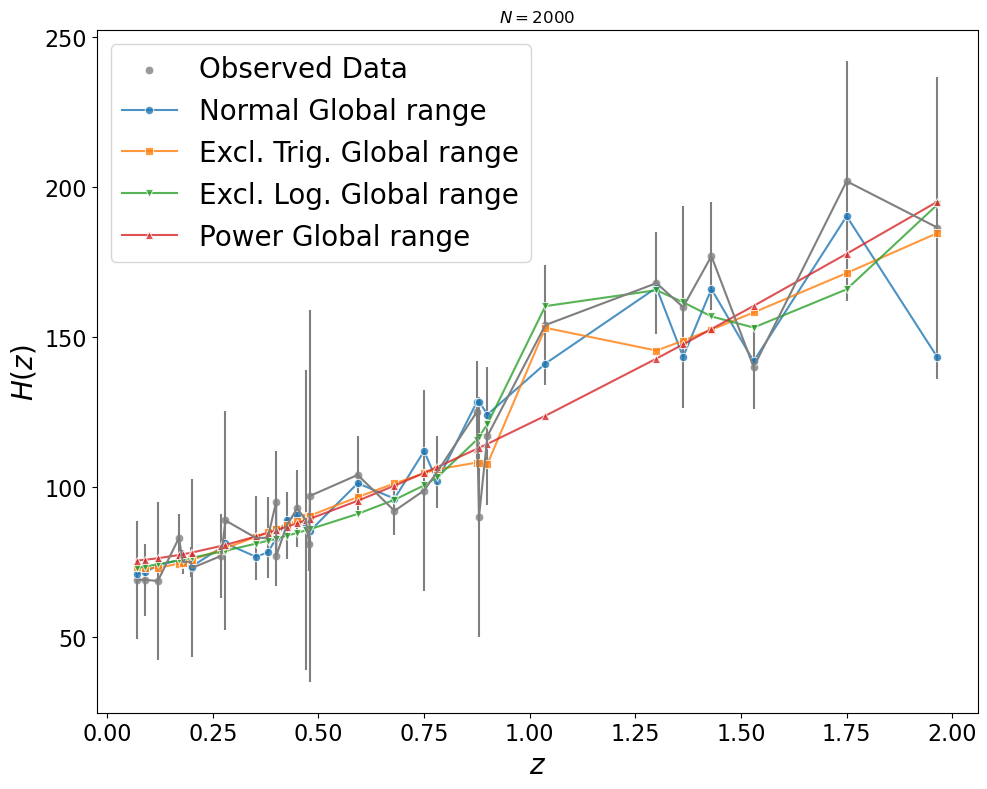

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


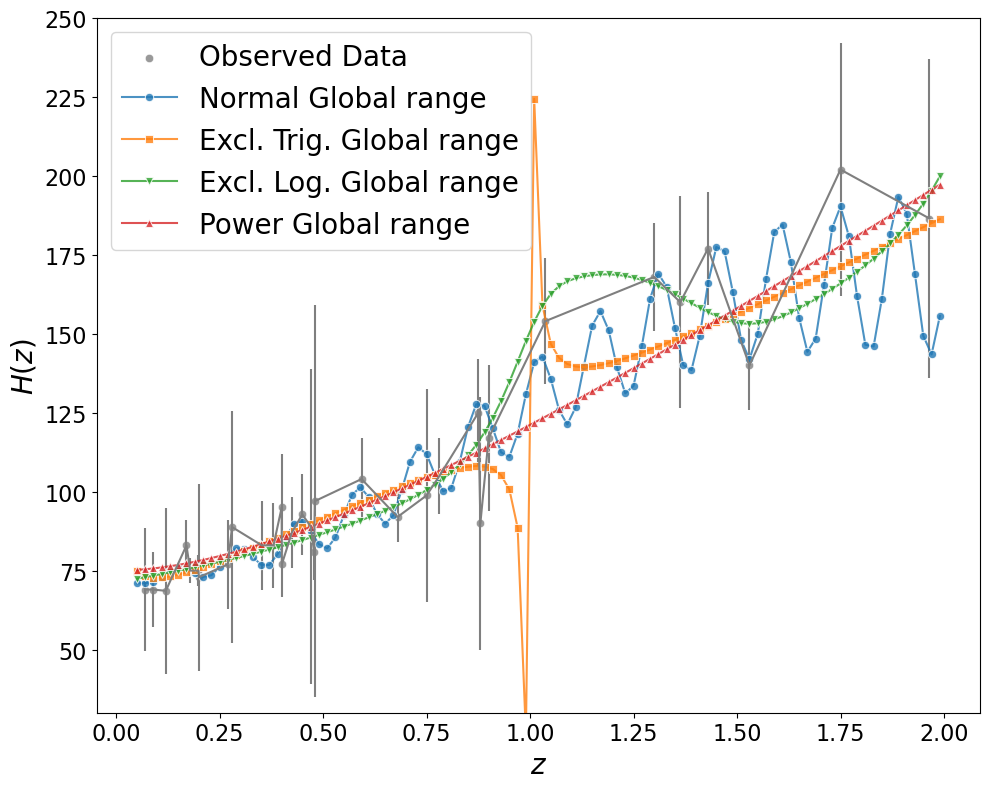

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:290: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9968.52*np.sqrt(np.sqrt(x1)**7.40+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(((np.sqrt(np.abs(62.43))))))-np.tanh(x1**52612.1)*np.sqrt(np.sqrt(np.sqrt((4.98)))+np.tanh(((np.sqrt((59.5/15.94+(np.tanh(x1))*36.5))))-((x1))**np.exp(x1))))))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


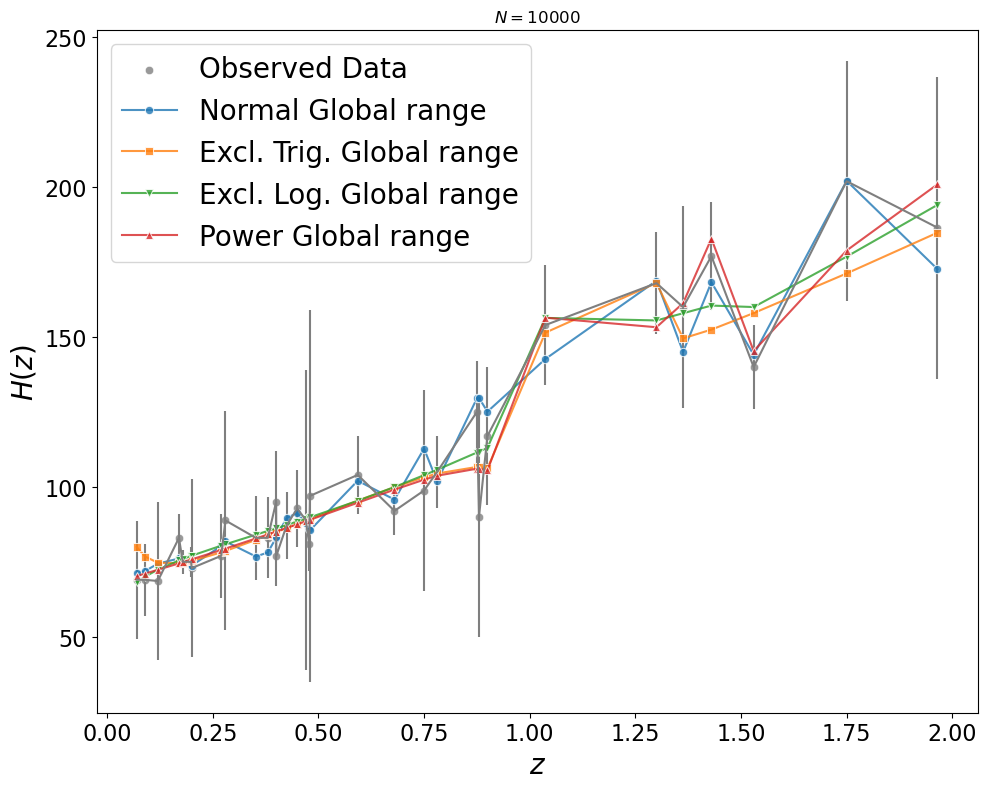

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:91: RuntimeWarning: invalid value encountered in sqrt
  v = 98.3**np.sqrt((np.cos(np.sqrt(7.1/np.exp(np.exp(x1))))))+69.7+np.cos((np.abs(x1)*(043.11)))*x1*(((9.76))+np.log(91.21))-np.cos(((21.95)))/np.cos(np.abs(np.sqrt(x1)))**x1
C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:290: RuntimeWarning: overflow encountered in double_scalars
  v = np.sqrt(9968.52*np.sqrt(np.sqrt(x1)**7.40+x1/np.tanh(np.sqrt(x1)+np.tanh(x1*np.tanh(((np.sqrt(np.abs(62.43))))))-np.tanh(x1**52612.1)*np.sqrt(np.sqrt(np.sqrt((4.98)))+np.tanh(((np.sqrt((59.5/15.94+(np.tanh(x1))*36.5))))-((x1))**np.exp(x1))))))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


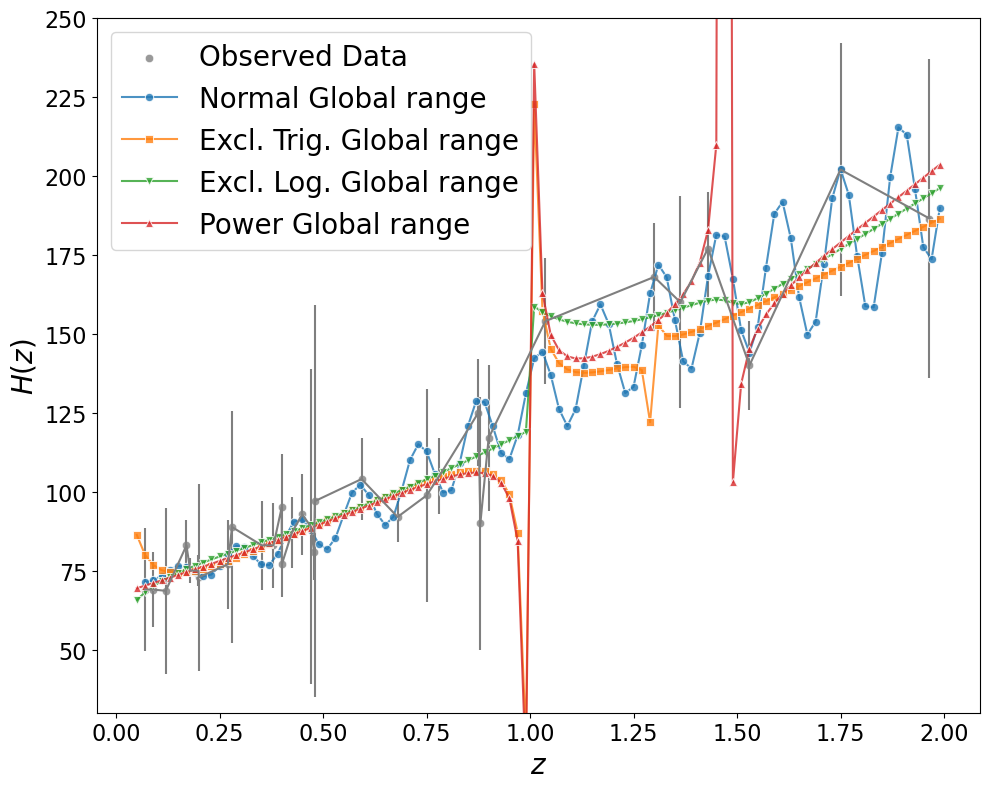

In [25]:
N_number = len(ga_functions['norm']['N'])
for idx in range(N_number):
    draw_comparison_grammar('global', idx, train_x, train_y, train_sigma)


C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:250: RuntimeWarning: overflow encountered in exp
  v = 9.54*(np.exp(x1+((np.tanh(np.exp(np.sqrt((np.sqrt(x1))**x1)-np.tanh((x1)))))))+4.4+x1/np.exp(((np.abs(x1**09.7/(41.36))))**4.17-x1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


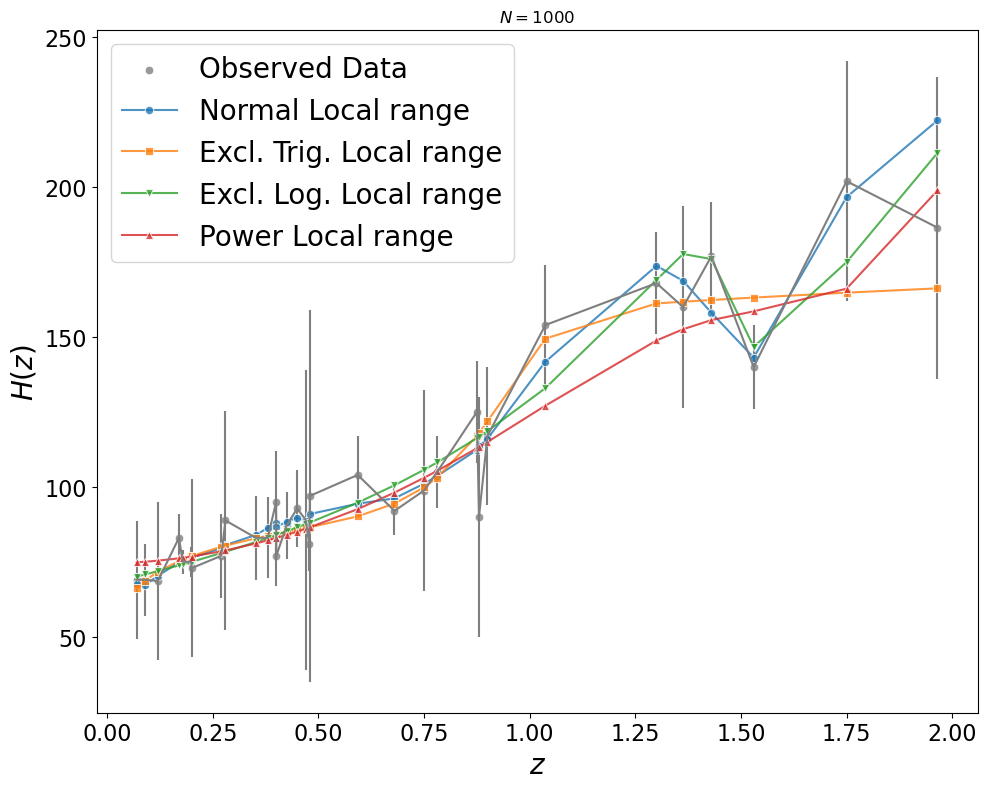

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:250: RuntimeWarning: overflow encountered in exp
  v = 9.54*(np.exp(x1+((np.tanh(np.exp(np.sqrt((np.sqrt(x1))**x1)-np.tanh((x1)))))))+4.4+x1/np.exp(((np.abs(x1**09.7/(41.36))))**4.17-x1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


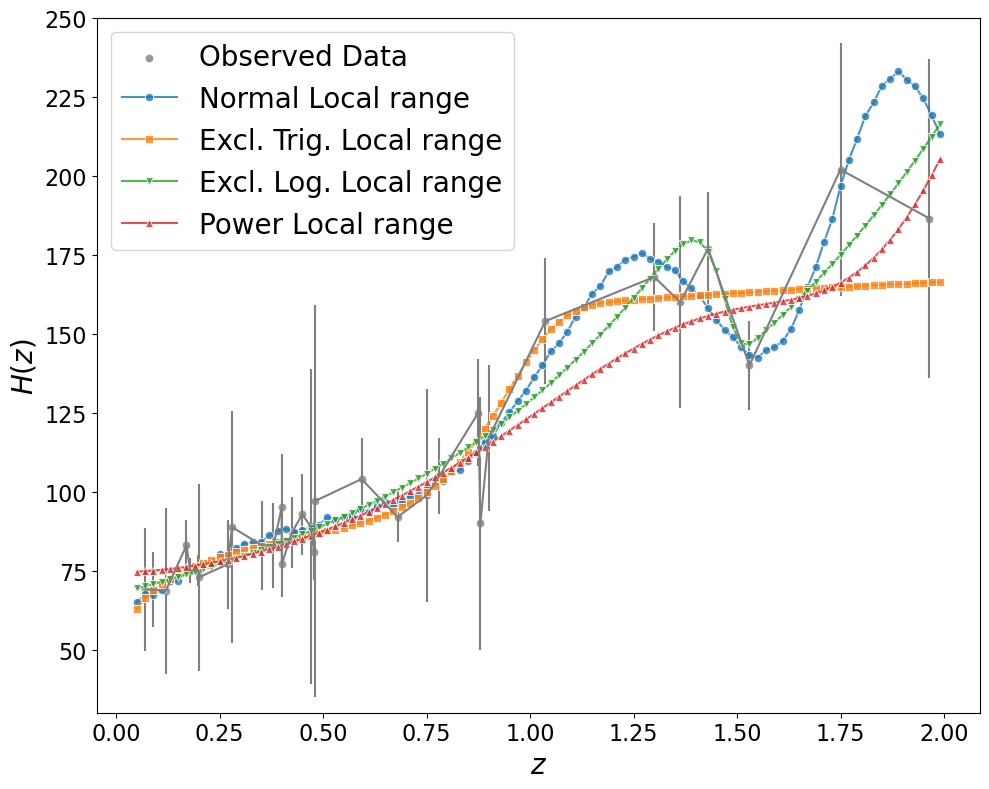

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:275: RuntimeWarning: overflow encountered in exp
  v = 9.54*(np.exp(x1+((np.tanh(np.exp(np.sqrt((np.sqrt(x1)))**x1-np.tanh((x1)))))))+4.4+x1/np.exp(((np.abs(x1**((9.7))/(40.63))))**4.34-x1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


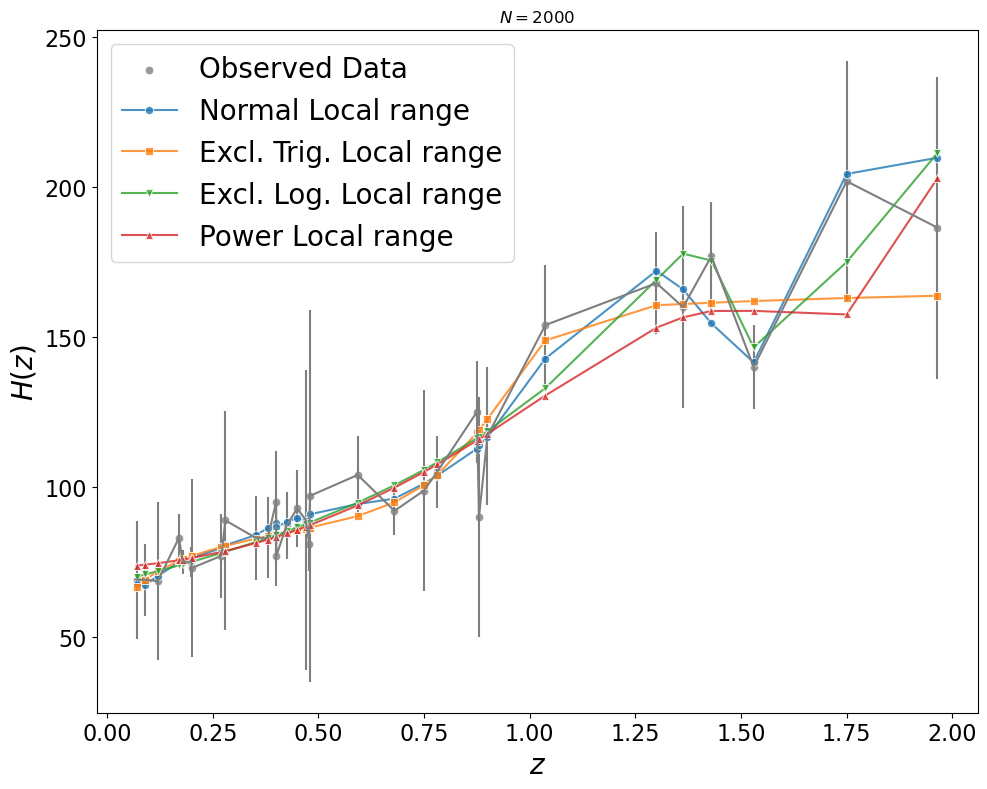

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:275: RuntimeWarning: overflow encountered in exp
  v = 9.54*(np.exp(x1+((np.tanh(np.exp(np.sqrt((np.sqrt(x1)))**x1-np.tanh((x1)))))))+4.4+x1/np.exp(((np.abs(x1**((9.7))/(40.63))))**4.34-x1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


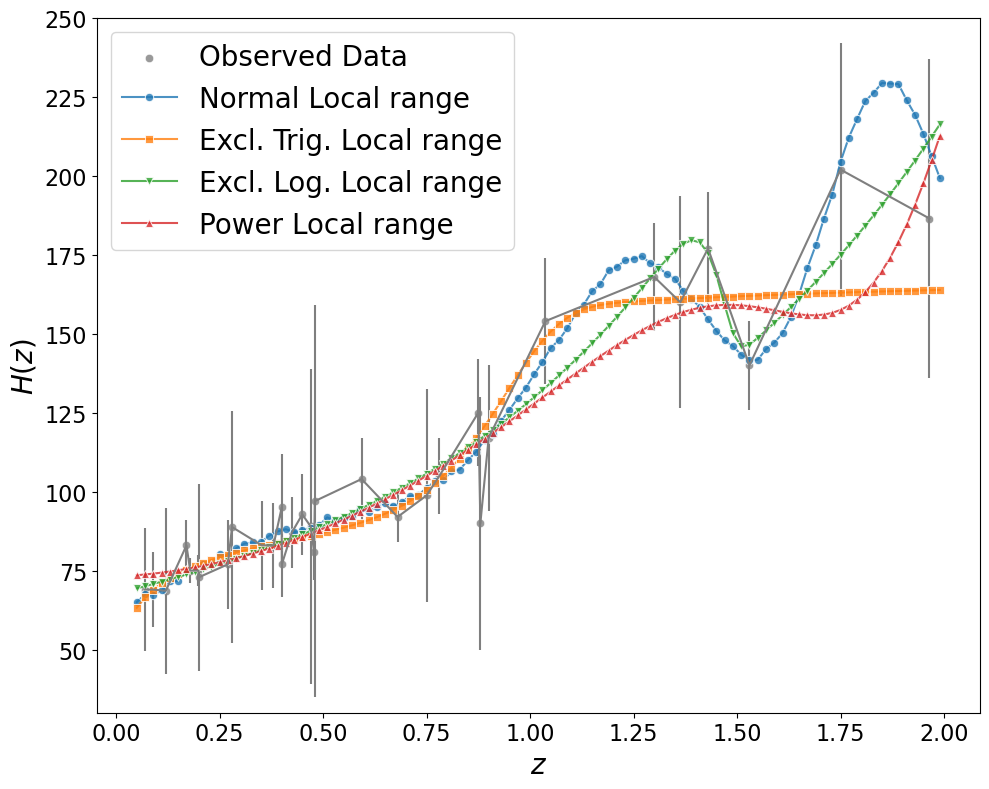

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:298: RuntimeWarning: overflow encountered in exp
  v = 9.99*(np.exp(((x1+np.tanh(np.abs(0.7)))))+(x1**np.tanh((x1))+4.4+x1/np.exp((np.abs((x1))**((9.7))/(41.12))**4.09-x1)*np.tanh(((np.exp(x1)**np.abs((np.abs(np.exp((x1-x1))-(((x1*(np.exp((np.tanh(np.tanh(np.abs(x1)))))))))))))))))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


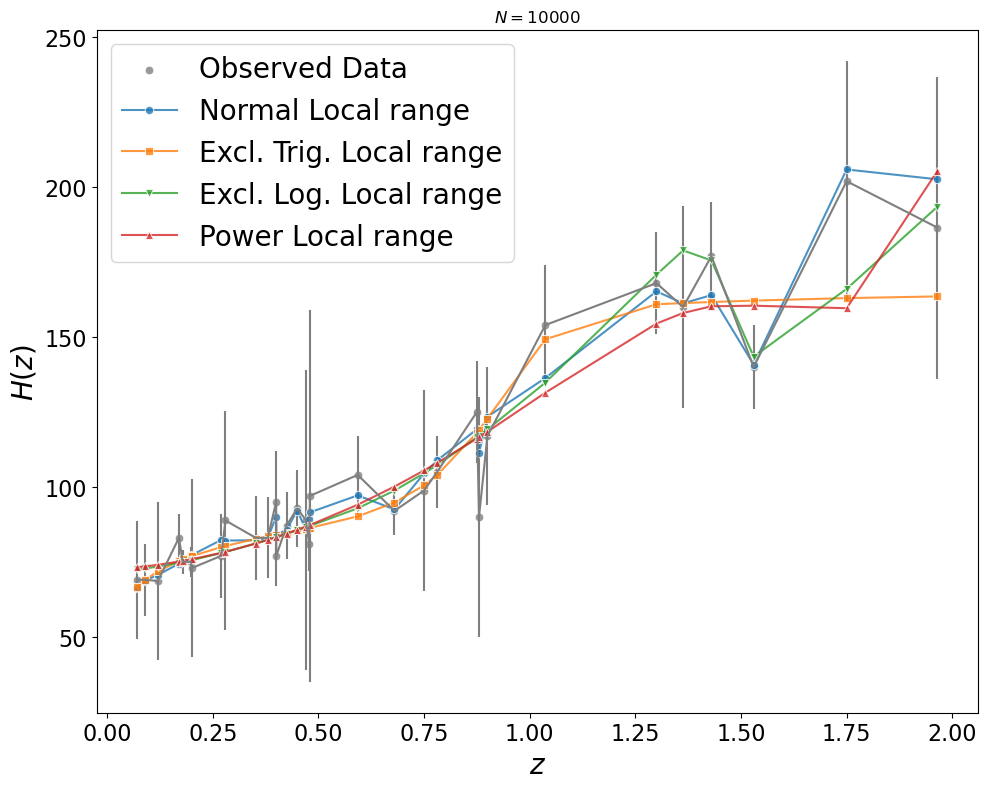

C:\Users\hwlee\hwlee_data\Projects\physics\MachineLearning\y2022\ijml2202-GA approach for cosmological data fit(title changed)\codes_revised\python\genetic_algorithm230915.py:298: RuntimeWarning: overflow encountered in exp
  v = 9.99*(np.exp(((x1+np.tanh(np.abs(0.7)))))+(x1**np.tanh((x1))+4.4+x1/np.exp((np.abs((x1))**((9.7))/(41.12))**4.09-x1)*np.tanh(((np.exp(x1)**np.abs((np.abs(np.exp((x1-x1))-(((x1*(np.exp((np.tanh(np.tanh(np.abs(x1)))))))))))))))))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


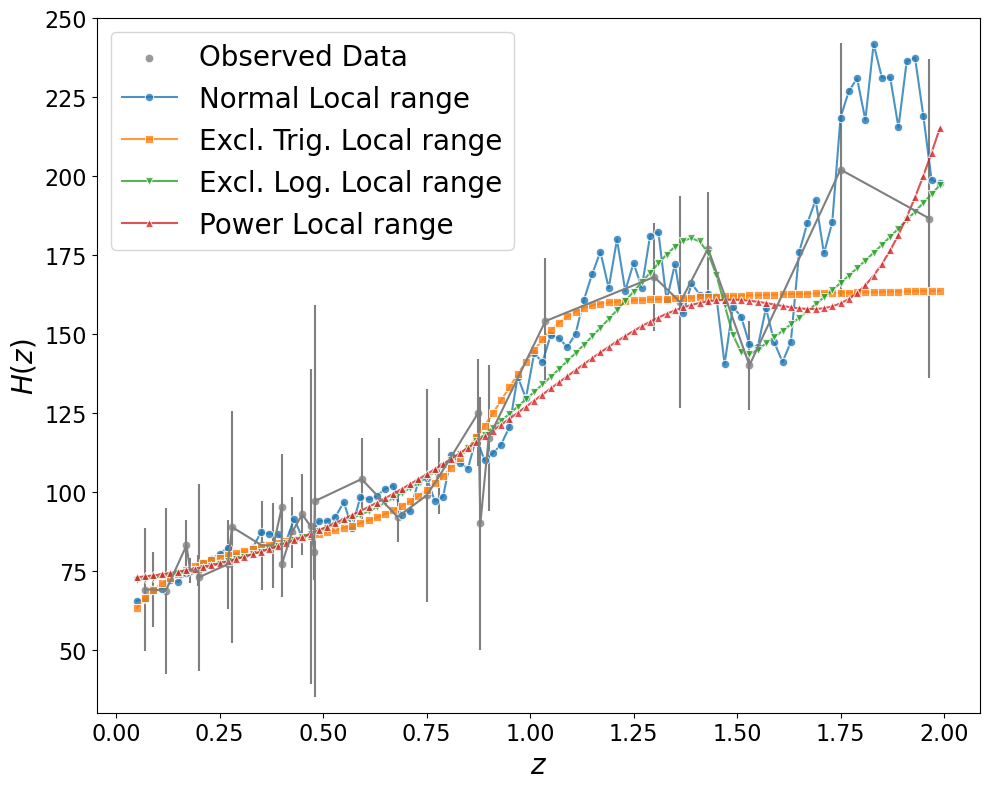

In [26]:
N_number = len(ga_functions['norm']['N'])
for idx in range(N_number):
    draw_comparison_grammar('local', idx, train_x, train_y, train_sigma)
